<a href="https://colab.research.google.com/github/hmaldonado12/7506R-1C2024-GRUPO6/blob/main/tp1/7506R_TP1_GRUPO06_ENTREGA_N8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## IMPORTS

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import seaborn as sns
import scipy.stats as st
import scipy.linalg as la
import sklearn as sk
import scipy.stats as st
import warnings
import geopandas as gpd
import matplotlib.pyplot as plt
warnings.simplefilter(action='ignore', category=FutureWarning)

## **1. Análisis Exploratorio y Preprocesamiento de Datos**
El primer paso consiste en la selección de los datos que se van a utilizar, se deben filtrar
únicamente los anuncios de propiedades de tipo vivienda ( Casa, PH y Departamento ) ubicados
en Capital Federal cuyo tipo de operación sea venta y su precio se encuentre en dólares (USD).
Se debe separar un conjunto de entrenamiento (80%) y un conjunto de test (20%).

#### **PREPRACION DE LOS DATOS**
Crear un nuevo dataset que contemplen los siguientes atributos :
- Tipos de vivienda: Casa, Ph Y Departamentos
- Moneda de transacción: Dólares (USD)
- Ubicacion : Capital Federal

##### **1.1 Mostrar informacion del dataset con los filtros requeridos del enunciado**

In [4]:
properties_argentina = pd.read_csv('properati_argentina_2021.csv') #/content/drive/MyDrive/Colab Notebooks/properati_argentina_2021.csv')

attributes_list = ["property_type", "operation", "property_currency", "place_l2"]
conditions_list = [["Casa", "PH","Departamento"],["Venta"],["USD"],["Capital Federal"]]

print("Dataframe antes de filtrar : ", properties_argentina.shape)
print("Datafrema filtrado: ", properties_argentina_filtered.shape)

Dataframe antes de filtrar :  (460154, 20)
Datafrema filtrado:  (94249, 20)


#### 1.2 Separar el conjunto de prueba y de entranamiento
- Entranamiento 80%
- Prueba 20 %

In [5]:
properties_argentina_train_set, properties_argentina_test_set = train_test_split(properties_argentina_filtered, test_size=0.2, random_state=42)
print("Conjunto de Entranamiento: ", properties_argentina_train_set.shape)
print("Conjunto de Prueba: ", properties_argentina_test_set .shape)

Conjunto de Entranamiento:  (75399, 20)
Conjunto de Prueba:  (18850, 20)


In [6]:
properties_argentina_filtered = properties_argentina_train_set
properties_argentina_filtered

,id,start_date,end_date,created_on,latitud,longitud,place_l2,place_l3,place_l4,place_l5,place_l6,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_currency,property_title
285884,sH/yN2YdtUSSJepTsIXyjQ==,2021-03-06,2021-03-18,2021-03-06,-34.621390,-58.506366,Capital Federal,Monte Castro,NaN,NaN,NaN,Venta,Departamento,3.0,2.0,51.0,44.0,112000.0,USD,Venta tres ambientes chico cochera y amplio ba...
120762,8vhkDo5KTd+Wwz3QYRR7wg==,2021-05-13,2021-05-19,2021-05-13,-34.563005,-58.453674,Capital Federal,Belgrano,NaN,NaN,NaN,Venta,Departamento,3.0,2.0,79.0,66.0,299900.0,USD,VENTA DEPARTAMENTO 3 AMB COCHERA BELGRANO
419659,hnDEA6QbHN6K/57Hkhlrhg==,2021-10-14,2022-02-09,2021-10-14,-34.612349,-58.491906,Capital Federal,Villa del Parque,NaN,NaN,NaN,Venta,Departamento,3.0,2.0,110.0,80.0,249000.0,USD,VENTA | DEPARTAMENTO |3 AMBIENTES | V. DEL PARQUE
21443,FMJCKPGRvEjbz0NBCaZ3Gw==,2021-10-01,2021-10-07,2021-10-01,-34.620806,-58.397336,Capital Federal,Boedo,NaN,NaN,NaN,Venta,PH,3.0,2.0,97.0,67.0,135000.0,USD,Casa - Boedo
103677,GgQjrtJSz1N4jQ8aSuNudA==,2021-05-28,2021-06-05,2021-05-28,-34.558229,-58.446708,Capital Federal,Belgrano,NaN,NaN,NaN,Venta,Departamento,3.0,2.0,89.0,89.0,300000.0,USD,Departamento - Belgrano
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30514,upUD9tdVDI/Ib/fRFNFDZA==,2021-10-15,9999-12-31,2021-10-15,-34.569953,-58.488393,Capital Federal,Villa Urquiza,NaN,NaN,NaN,Venta,Departamento,3.0,2.0,100.0,75.0,199000.0,USD,DEPARTAMENTO 3 AMBIENTES - VILLA URQUIZA
268902,EJ8p6gJ/c3hA2ktL034+BQ==,2021-01-19,2021-01-29,2021-01-19,-34.555575,-58.438803,Capital Federal,Belgrano,NaN,NaN,NaN,Venta,Departamento,3.0,2.0,91.0,81.0,333000.0,USD,Adelanto y 12 cuotas en pesos - Belgrano
379634,Z9std/wufD6bvz2jlpr8pg==,2021-05-19,2021-06-02,2021-05-19,-34.638700,-58.374163,Capital Federal,Barracas,NaN,NaN,NaN,Venta,Departamento,1.0,NaN,43.0,36.0,99800.0,USD,Departamento premium - mejor zona de Barracas
4766,8dvRLkGjVg6S5brptSDAzQ==,2021-09-20,2022-03-09,2021-09-20,NaN,NaN,Capital Federal,Almagro,NaN,NaN,NaN,Venta,Departamento,2.0,1.0,34.0,34.0,76120.0,USD,Departamento - Almagro


## **ENTENDER EL PROBLEMA**
El objetivo del tp es poder entrenar un modelo que pueda predecir el valor de venta de un inmueble en cualquier barrio de capital federal.
En esta primera parte vamos a limpiar los datos y además entender como los datos pueden influir en la prediction de nuestro modelo o rendimiento de nuestro modelo.

### COMPROBACIONES PLANTEADAS EN EL TP
Las comprobaciones nos daran un entendimiento más profundo sobre los datos. Con los conocimientos de los datos vamos a tener más criterios para poder limpiar los mismos y poder entrenar el modelo.
#### a) Exploración Inicial: analizar cada variable, considerando los siguientes aspectos


In [7]:
col_numericas = []
col_categoricas = []
for columna in properties_argentina_filtered.columns:
  if properties_argentina_filtered[columna].dtype == 'float' or properties_argentina_filtered[columna].dtype == 'int':
    col_numericas.append(columna)
  else:
    col_categoricas.append(columna)

#### Columnas del Tipo Númericas

In [8]:
col_numericas_pd = pd.DataFrame(col_numericas)
col_numericas_pd

,0
0,latitud
1,longitud
2,place_l6
3,property_rooms
4,property_bedrooms
5,property_surface_total
6,property_surface_covered
7,property_price


#### Columnas del Tipo Categoricas

In [9]:
col_categoricas_pd = pd.DataFrame(col_categoricas)
col_categoricas_pd

,0
0,id
1,start_date
2,end_date
3,created_on
4,place_l2
5,place_l3
6,place_l4
7,place_l5
8,operation
9,property_type


#### a.1)Variables Cuantitativas: calcular medidas de resumen: media, mediana,moda,etc

In [10]:
properties_argentina_filtered[col_numericas].describe()

,latitud,longitud,place_l6,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price
count,72420.000000,72420.000000,0.0,74555.000000,66597.000000,71509.000000,72708.000000,7.539900e+04
mean,-34.591358,-58.449737,NaN,2.825015,2.017208,111.841013,89.872806,2.260926e+05
std,0.188601,0.289167,NaN,1.433820,1.135236,1079.926643,1106.107524,3.183805e+05
min,-53.788624,-71.471192,NaN,1.000000,-1.000000,10.000000,1.000000,5.000000e+03
25%,-34.615996,-58.466550,NaN,2.000000,1.000000,45.000000,40.000000,9.500000e+04
50%,-34.595757,-58.439146,NaN,3.000000,2.000000,65.000000,58.000000,1.439000e+05
75%,-34.577367,-58.408917,NaN,4.000000,3.000000,105.000000,89.000000,2.380000e+05
max,-24.219827,-54.133330,NaN,40.000000,70.000000,137000.000000,217000.000000,2.140000e+07


#### a.2) Variables Cualitativas: mostrar cantidad de valores posibles, y frecuencias de cada uno.

In [11]:
properties_argentina_filtered[col_categoricas].describe()

,id,start_date,end_date,created_on,place_l2,place_l3,place_l4,place_l5,operation,property_type,property_currency,property_title
count,75399,75399,75399,75399,75399,75073,2870,0,75399,75399,75399,75399
unique,75399,365,600,365,1,57,4,0,1,3,1,46378
top,sH/yN2YdtUSSJepTsIXyjQ==,2021-12-16,2021-06-05,2021-12-16,Capital Federal,Palermo,Palermo Hollywood,NaN,Venta,Departamento,USD,Departamento - Palermo
freq,1,3732,10253,3732,75399,11397,1232,NaN,75399,64619,75399,1184


#### a.3) Determinar variables irrelevantes en el análisis
Con la información del punto anterior podemos determinar algunas variables que no son relevantes para nuestro modelo, es decir no nos van a aportar información de calidad que sirva para el entrenamiento del modelo.



##### **ANALISIS :**
##### 1. Buscamos el porcentaje de nulos para las variables del tipo cuantitativas y cualitativas

##### CUANTITATIVAS

In [12]:
cantidad_nulos_numericos = properties_argentina_filtered[col_numericas].isnull().sum()
cantidad_nulos_numericos

latitud                      2979
longitud                     2979
place_l6                    75399
property_rooms                844
property_bedrooms            8802
property_surface_total       3890
property_surface_covered     2691
property_price                  0
dtype: int64

Podemos concluir que la columna place_l6 al tener todos sus valores nulos, no nos va a portar información de calidad para la determinación del precio de una vivienda. Por lo tanto, se decide eliminar la columna place_l6

#### CUALITATIVAS

In [13]:
cantidad_nulos_categoricas = properties_argentina_filtered[col_categoricas].isnull().sum()
cantidad_nulos_categoricas

id                       0
start_date               0
end_date                 0
created_on               0
place_l2                 0
place_l3               326
place_l4             72529
place_l5             75399
operation                0
property_type            0
property_currency        0
property_title           0
dtype: int64

Llegamos a la misma conclusión que place_l6.

Solo nos falta analizar las variables del tipo fecha, en especial la que nos dice la fecha en la que se hizo la publicación del inmueble.


<ipython-input-14-9b0910865b47>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  properties_argentina_for_price = properties_argentina_filtered[


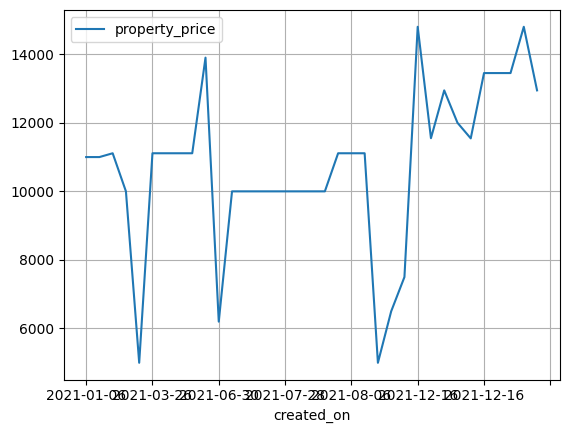

In [14]:
properties_argentina_for_price = properties_argentina_filtered[
    properties_argentina["property_price"] < 15000
]
(properties_argentina_for_price.sort_values(by="created_on")
.plot(
    x="created_on",
    y="property_price",
    grid=True
))
plt.show()

Como podemos observar en el gráfico el precio de un inmueble varía según la fecha en la que se publicó, por lo tanto, este atributo si puede aportar información en la predicción del precio de un inmueble en capital federal

Los atributos irrelevantes para nuestro análisis son :
- start_date
- end_date
- place_l5
- place_l6

Por lo tanto, estas variables se pueden eliminar de la data frame

In [15]:
properties_argentina_filtered = properties_argentina_filtered.drop(columns=["start_date", "end_date", "created_on" ,"place_l5", "place_l6"])
properties_argentina_filtered

,id,latitud,longitud,place_l2,place_l3,place_l4,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_currency,property_title
285884,sH/yN2YdtUSSJepTsIXyjQ==,-34.621390,-58.506366,Capital Federal,Monte Castro,NaN,Venta,Departamento,3.0,2.0,51.0,44.0,112000.0,USD,Venta tres ambientes chico cochera y amplio ba...
120762,8vhkDo5KTd+Wwz3QYRR7wg==,-34.563005,-58.453674,Capital Federal,Belgrano,NaN,Venta,Departamento,3.0,2.0,79.0,66.0,299900.0,USD,VENTA DEPARTAMENTO 3 AMB COCHERA BELGRANO
419659,hnDEA6QbHN6K/57Hkhlrhg==,-34.612349,-58.491906,Capital Federal,Villa del Parque,NaN,Venta,Departamento,3.0,2.0,110.0,80.0,249000.0,USD,VENTA | DEPARTAMENTO |3 AMBIENTES | V. DEL PARQUE
21443,FMJCKPGRvEjbz0NBCaZ3Gw==,-34.620806,-58.397336,Capital Federal,Boedo,NaN,Venta,PH,3.0,2.0,97.0,67.0,135000.0,USD,Casa - Boedo
103677,GgQjrtJSz1N4jQ8aSuNudA==,-34.558229,-58.446708,Capital Federal,Belgrano,NaN,Venta,Departamento,3.0,2.0,89.0,89.0,300000.0,USD,Departamento - Belgrano
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30514,upUD9tdVDI/Ib/fRFNFDZA==,-34.569953,-58.488393,Capital Federal,Villa Urquiza,NaN,Venta,Departamento,3.0,2.0,100.0,75.0,199000.0,USD,DEPARTAMENTO 3 AMBIENTES - VILLA URQUIZA
268902,EJ8p6gJ/c3hA2ktL034+BQ==,-34.555575,-58.438803,Capital Federal,Belgrano,NaN,Venta,Departamento,3.0,2.0,91.0,81.0,333000.0,USD,Adelanto y 12 cuotas en pesos - Belgrano
379634,Z9std/wufD6bvz2jlpr8pg==,-34.638700,-58.374163,Capital Federal,Barracas,NaN,Venta,Departamento,1.0,NaN,43.0,36.0,99800.0,USD,Departamento premium - mejor zona de Barracas
4766,8dvRLkGjVg6S5brptSDAzQ==,NaN,NaN,Capital Federal,Almagro,NaN,Venta,Departamento,2.0,1.0,34.0,34.0,76120.0,USD,Departamento - Almagro


#### a.4) Realizar un análisis gráfico de las distribuciones de las variables más relevantes

En esta sección vamos a mostrar la distribución para los atributos que pueden aportar información para determinar el precio de un inmueble:
- Ubicación: latitud y longitud
- Tipo de inmueble: Departamento, Casa y PH
- Cantidad de ambientes: property_rooms
- Cantidad de baños: property_bedrooms
- Superficie cubierta
- Precio del inmueble

#### 1.) UBICACIÓN

array([[<Axes: title={'center': 'latitud'}>]], dtype=object)

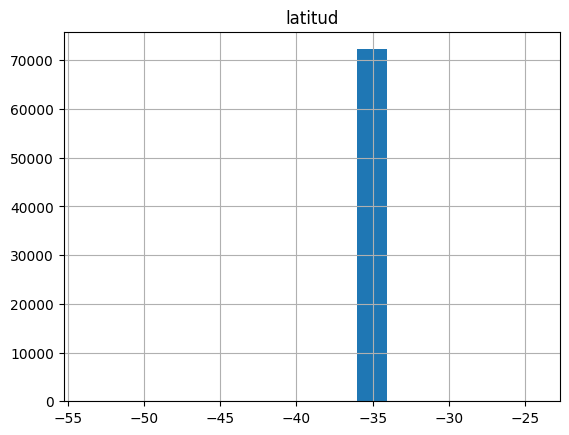

In [16]:
properties_argentina_distribucion = properties_argentina_filtered.copy()
properties_argentina_distribucion.hist(
    "latitud",
    bins=15
)

array([[<Axes: title={'center': 'longitud'}>]], dtype=object)

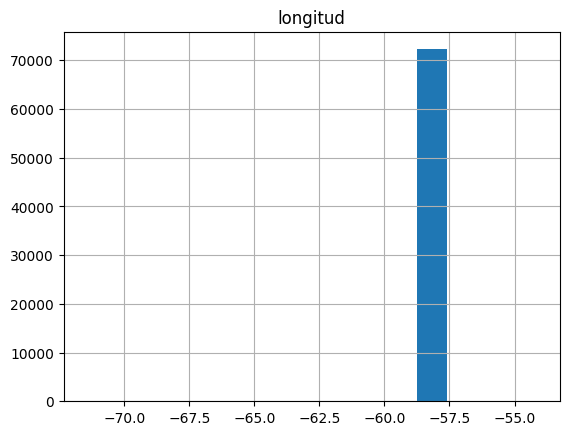

In [17]:
properties_argentina_distribucion.hist(
    "longitud",
    bins=15
)

#### 2.) TIPO DE INMUEBLE

array([[<Axes: title={'center': 'Casa'}>,
        <Axes: title={'center': 'Departamento'}>],
       [<Axes: title={'center': 'PH'}>, <Axes: >]], dtype=object)

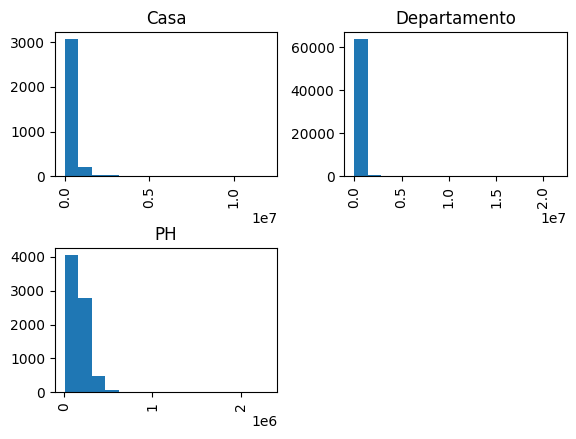

In [18]:
properties_argentina_distribucion.hist(
    "property_price",
    by="property_type",
    bins=15
)

#### 3.) CANTIDAD DE AMBIENTES


<Axes: xlabel='property_rooms', ylabel='Count'>

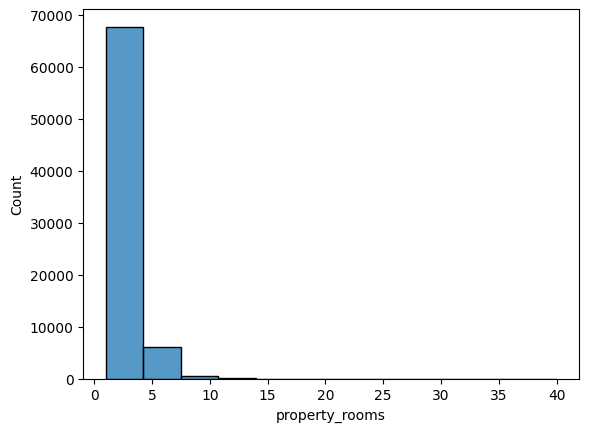

In [19]:
sns.histplot(
    properties_argentina_distribucion,
    x="property_rooms",
    bins=12
)

#### 4.) CANTIDAD DE BAÑOS

<Axes: xlabel='property_bedrooms', ylabel='Count'>

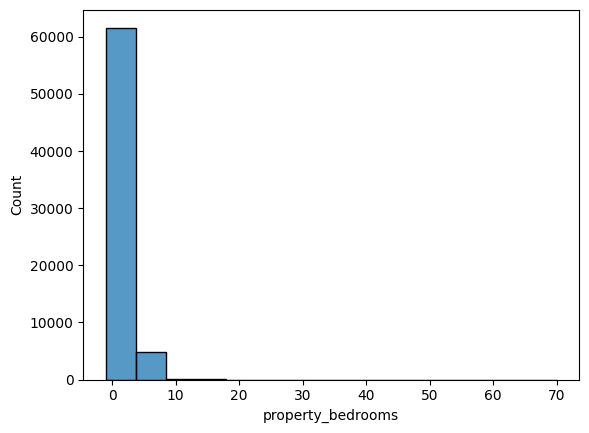

In [20]:
sns.histplot(
    properties_argentina_distribucion,
    x="property_bedrooms",
    bins=15
)

#### 4.) PRECIO

<Axes: xlabel='property_price', ylabel='Count'>

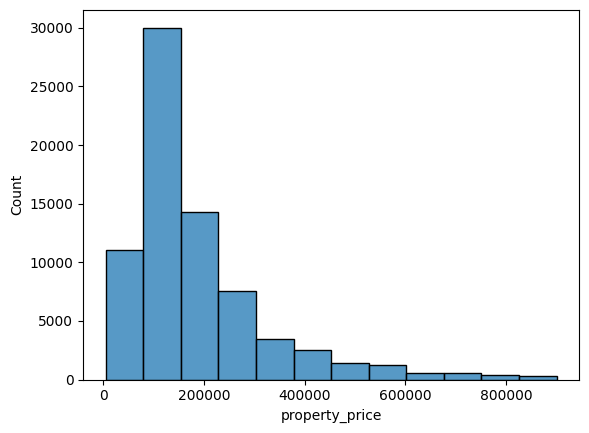

In [21]:
precio = properties_argentina_distribucion[properties_argentina_distribucion["property_price"] < 900000]
sns.histplot(
    precio,
    x="property_price",
    bins=12
)

#### a.5) Analizar las correlaciones existentes entre las variables.
Para analizar la correlación entre las variables, hay que seleccionar aquellas variables del tipo float64

<Axes: >

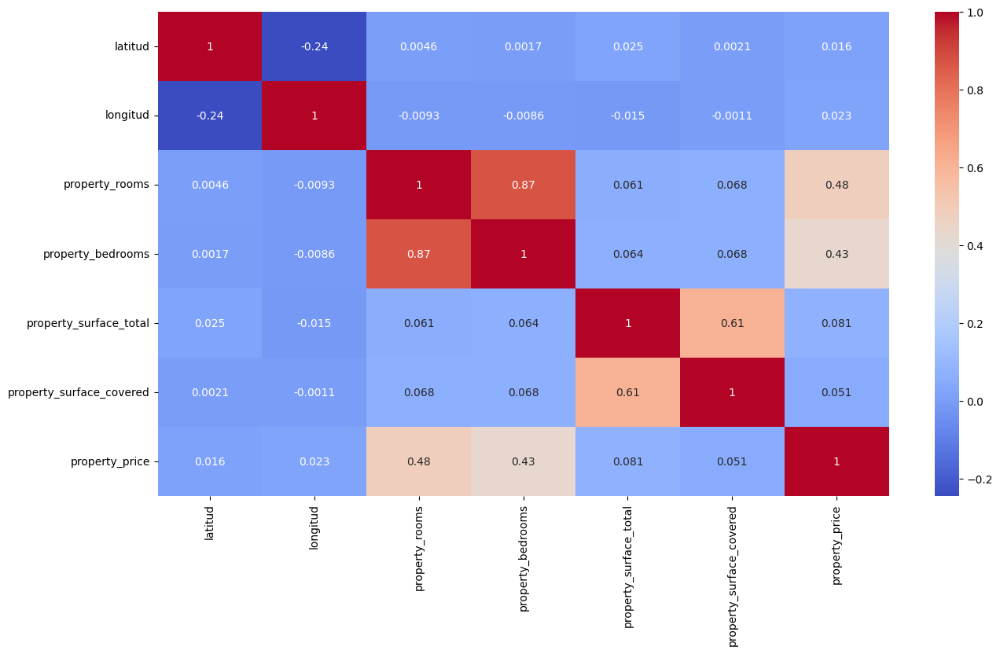

In [22]:
properties_argentina_filtered_copy = properties_argentina_filtered.copy()
properties_argentina_numeric = properties_argentina_filtered_copy.select_dtypes(include=['float64', 'int64'])
corr_matrix = properties_argentina_numeric.corr()
plt.figure(figsize=(15, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm")

Se analiza la correlación de todos los atributos respecto al precio de la propiedad, podemos observar que el atributo rooms y bedrooms tiene correlaciones positivas, esto quiere decir que el precio de una vivienda puede aumentar si estos dos atributos aumentan.

Con esta información también nos podemos preguntar lo siguiente: ¿La proporción de habitaciones/ambientes por casa puede influir en el precio de una propiedad?, para contestar esta pregunta, se puede crear una nueva variable que represente el nuevo atributo


In [23]:
properties_argentina_filtered_copy = properties_argentina_filtered.copy()
properties_argentina_filtered_copy["property_bedrooms_ratio"] = properties_argentina_filtered_copy["property_bedrooms"] / properties_argentina_filtered_copy["property_rooms"]

properties_argentina_numeric = properties_argentina_filtered_copy.select_dtypes(include=['float64', 'int64'])
corr_matrix = properties_argentina_numeric.corr()
corr_property_price = corr_matrix["property_price"].sort_values(ascending=False)
print(corr_property_price)

property_price              1.000000
property_rooms              0.484365
property_bedrooms           0.426593
property_surface_total      0.080665
property_bedrooms_ratio     0.062126
property_surface_covered    0.050979
longitud                    0.022694
latitud                     0.016128
Name: property_price, dtype: float64


Si observamos el valor obtenido no tiene mucha influencia en sobre el valor de una propiedad.
También se puede hacer el mismo análisis con la proporción de la property_surface_covered/property_surface_total

In [24]:
properties_argentina_filtered_copy = properties_argentina_filtered.copy()
properties_argentina_filtered_copy["property_surface_ratio"] = properties_argentina_filtered_copy["property_surface_covered"] / properties_argentina_filtered_copy["property_surface_total"]

properties_argentina_numeric = properties_argentina_filtered_copy.select_dtypes(include=['float64', 'int64'])
corr_matrix = properties_argentina_numeric.corr()
corr_property_price = corr_matrix["property_price"].sort_values(ascending=False)
print(corr_property_price)

property_price              1.000000
property_rooms              0.484365
property_bedrooms           0.426593
property_surface_total      0.080665
property_surface_covered    0.050979
longitud                    0.022694
latitud                     0.016128
property_surface_ratio     -0.001285
Name: property_price, dtype: float64


Si bien es una correlación negativa, el valor no es muy representativo, por lo tanto, podemos concluir que no influye en la determinación del precio de una propiedad.
Concluimos que los dos atributos que pueden influir en el precio de una propiedad son: property_bedrooms y property_rooms.

Esta es un conclusion muy temprano, ya que nos falta limpiar los datos, mas adelante vamos a tener una conclusion de las correlaciones un poco más coherente.

### b) Visualización de los datos: en esta sección se espera que puedan realizar una primera
Aproximación a los datos apoyándose en visualizaciones, por ejemplo: gráficos de dispersión
entre variables, histogramas, heatmaps, exploración de las columnas y cualquier otro gráfico
adicional que se considere útil justificando su utilización.
.

Ahora vamos a observar con un mapa de calor las propiedades mas caras y en que parte se concentran las que tiene más metros cuadrados(totales)

#### b.2) Cantidad de Propiedades según El barrio

Text(0, 0.5, 'Cantidad de propiedades')

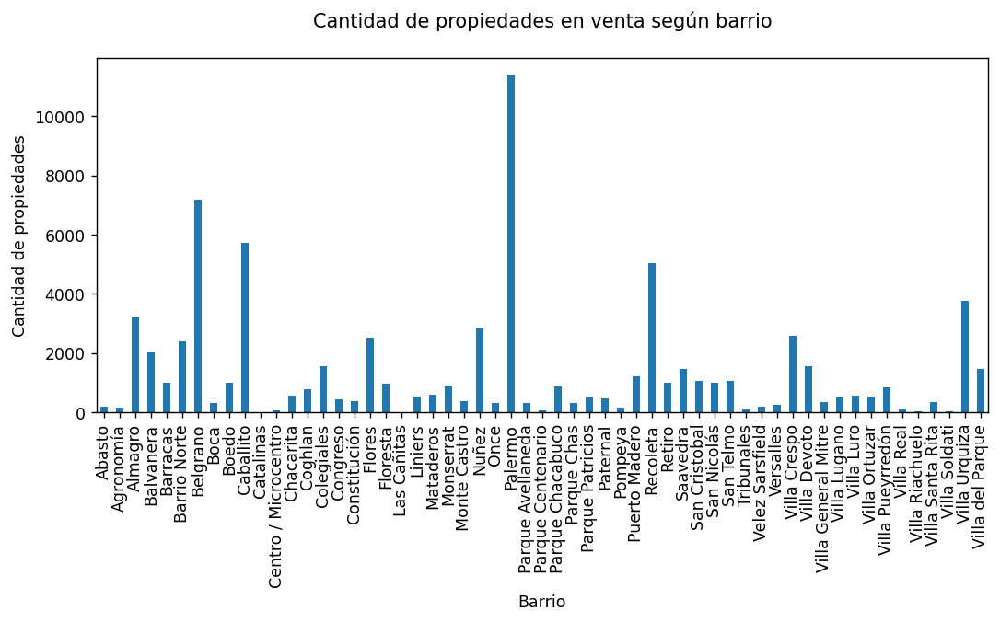

In [25]:
plt.figure(dpi=125,figsize=(10,4))

properties_argentina_filtered.groupby('place_l3')['id'].count().plot(kind='bar')
plt.title("Cantidad de propiedades en venta según barrio\n")
plt.xlabel("Barrio")
plt.ylabel("Cantidad de propiedades")

#### b.3) Cantidad de inmuebles según el tipo

Text(0, 0.5, 'Cantidad de propiedades')

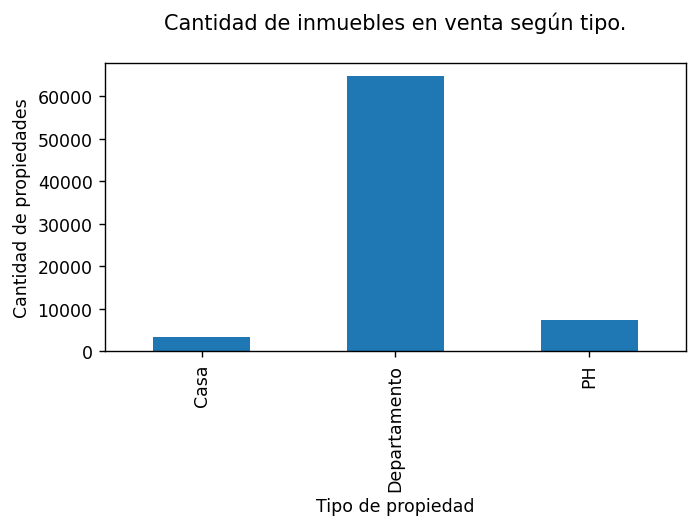

In [26]:
plt.figure(dpi=125,figsize=(6,3))

properties_argentina_filtered.groupby('property_type')['id'].count().plot(kind='bar')
plt.title("Cantidad de inmuebles en venta según tipo.\n")
plt.xlabel("Tipo de propiedad")
plt.ylabel("Cantidad de propiedades")

### c.) Datos Faltantes

* Realizar análisis de datos faltantes en columna. Graficar para cada variable el
porcentaje de datos faltantes con respecto al total del dataset.

Antes de empezar voy a llamar "" a la columna place_l3 y "" a la columna place_l2

In [27]:
properties_argentina_filtered = properties_argentina_filtered.rename(columns={"place_l2":"city","place_l3":"zone"})

Primero busco caracteres raros como "NULL", "?", "-", como no hay ninguno sigo buscando valores faltantes:

In [28]:
filas_totales = properties_argentina_filtered.shape[0]
porcentaje_col_faltante = properties_argentina_filtered.isna().sum() / filas_totales * 100
print(porcentaje_col_faltante)

id                           0.000000
latitud                      3.950981
longitud                     3.950981
city                         0.000000
zone                         0.432366
place_l4                    96.193583
operation                    0.000000
property_type                0.000000
property_rooms               1.119378
property_bedrooms           11.673895
property_surface_total       5.159220
property_surface_covered     3.569013
property_price               0.000000
property_currency            0.000000
property_title               0.000000
dtype: float64


Veo que todos los valores son bajos y no deberia dropear ninguna exceptuando a place_l4, como su funcion es especificar en que parte de Palermo estan algunas propiedades, lo mas lógico sería reemplazar a Palermo por la zona especifica en estas zonas y evitar tener una columna con más de un 96% de datos NaN.

In [29]:
for i in range(1,properties_argentina_filtered.shape[0]):
    fila = properties_argentina_filtered.iloc[i]
    zona = fila["zone"]
    es_NaN = zona!=zona

    if not es_NaN and zona=="Palermo":
      zona_Palermo = fila["place_l4"]
      zona_Pal_NaN = zona_Palermo!=zona_Palermo
      if not zona_Pal_NaN:
        properties_argentina_filtered.iat[i, 4] = zona_Palermo

    i+=1

    properties_argentina_filtered=properties_argentina_filtered

Ahora vamos a eliminar la columna place_l4 y luego volvemos a ver los datos faltantes por columna pero en un grafico

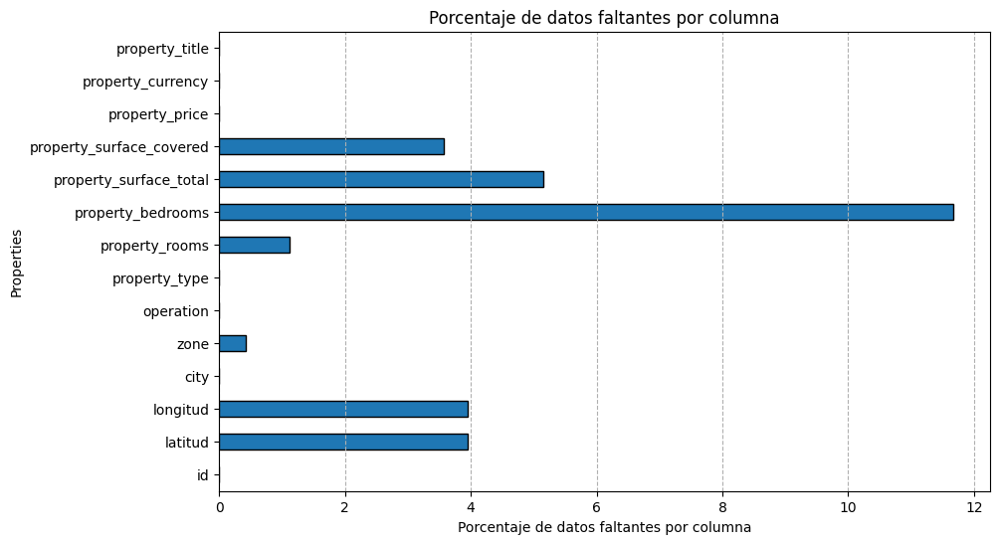

In [30]:
properties_argentina_filtered = properties_argentina_filtered.drop(columns=["place_l4"])
filas_totales = properties_argentina_filtered.shape[0]
porcentaje_col_faltante = properties_argentina_filtered.isna().sum() / filas_totales * 100


porcentaje_col_faltante.plot(kind='barh', figsize=(10, 6), edgecolor='black')
plt.title('Porcentaje de datos faltantes por columna')
plt.ylabel('Properties')
plt.xlabel('Porcentaje de datos faltantes por columna')
plt.grid(axis='x', linestyle='--')
plt.show()

Podemos observar que exceptuando a "property_bedrooms" todas las columnas tienen un porcentaje de datos faltantes menor o similar al 5%.


*  Realizar un análisis de datos faltantes a nivel de fila. Calcular el porcentaje de datos
faltantes de cada registro. Realizar un gráfico que permita conocer la proporción de
faltantes por fila en el dataset.



Primero calculo que porcentaje de cada fila falta:

*   Elemento de la lista

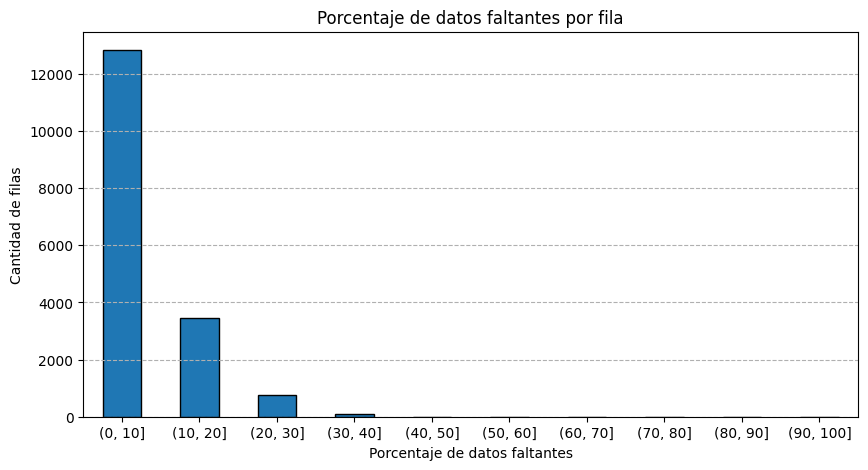

In [31]:
col_totales = len(properties_argentina_filtered.columns)
porcentaje_faltante_fila = properties_argentina_filtered.isna().sum(axis=1) / col_totales * 100

rangos = [0,10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
porcentaje_agrupado = pd.cut(porcentaje_faltante_fila, bins=rangos).value_counts().sort_index()
plt.figure(figsize=(10, 5))
porcentaje_agrupado.plot(kind='bar', edgecolor='black')
plt.title('Porcentaje de datos faltantes por fila')
plt.xlabel('Porcentaje de datos faltantes')
plt.ylabel('Cantidad de filas')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--')
plt.show()

Se puede ver que las mayoría de las filas tienen entre un 0% y un 10% de datos faltantes, otros entre un 10% y un 20%, algunos pocos entre 20% y 30% y finalmente una porción muy menor entre el 30% y 40%.



*  Revisar los datos faltantes o mal ingresados y tomar una decisión sobre estos: reemplazo de
valores, eliminación de registros incompletos, etc.



**Primero** voy a asignarles la latitud y longitud a todas las filas que tengan una zona, les voy a asiganar la media de todos las filas de la misma zona.

In [32]:
reparado = properties_argentina_filtered

place_l3_copy = properties_argentina_filtered["zone"]
place_l3_drop = place_l3_copy.drop_duplicates()
zones = place_l3_drop.values

media_zones = {}    #Me guardo las medias de (latitud,longitud) de c/zona

for zone in zones:
      zone_act = reparado[reparado["zone"]==zone]
      lat_med = zone_act["latitud"].mean()
      lon_med = zone_act["longitud"].mean()
      media_zones[zone] = (lat_med,lon_med)
      zone_act = zone_act.fillna({"latitud":lat_med,"longitud":lon_med})
      reparado[reparado["zone"]==zone]=zone_act


Ahora los únicas filas que no tienen latitud o longitud son los que tampoco tienen zona y esos los dropeamos ya que asignarle una zona basandonos en datos como precios y superficie total/cubierta podría alterar las mediciones que se quieran hacer en el futuro

In [33]:
reparado.shape

(75399, 14)

Este es el número de filas antes de eliminar

In [34]:
import math

i = 0
while i < reparado.shape[0]:
  fila = reparado.iloc[i]
  lat = fila["latitud"]
  if math.isnan(lat):
    reparado.drop(reparado.index[i:i+1], inplace=True)
  else:
    i+=1


reparado.shape

(75267, 14)

Este es el nuevo número de filas.

Ahora voy a asignarle un barrio a aquellas filas que no tienen pero si tienen latitud y longitud, para eso voy a calcular la distancia entre la ubicacion y la media de cada zona. Voy a calcular la diferencia entre la latitud y la longitud de cada fila y la media, luego calculo un promedio (diferencia de latitud sumado la diferencia de longitud dividido 2) y el barrio que menor diferencia tenga sera el elegido.

In [35]:
for i in range(1,reparado.shape[0]):
    fila = reparado.iloc[i]
    zona = fila["zone"]
    bool = zona!=zona

    if bool:
      lat=fila["latitud"]
      lon=fila["longitud"]
      dist_menor = abs( abs(media_zones["Palermo"][0]) - abs(lat) ) + abs( abs( abs(media_zones["Palermo"][1] ) - abs(lon) ))
      barrio = "Palermo"

      for c in media_zones:

          tupla_dist = media_zones.get(c)
          nueva_dist = abs( abs(tupla_dist[0]) - abs(lat) ) + abs( abs( abs(tupla_dist[1] ) - abs(lon) ))
          es_menor = nueva_dist<dist_menor

          if es_menor:
            dist_menor=nueva_dist
            barrio = c

      reparado.iat[i, 4] = barrio


    i+=1

reparado = reparado


Vemos que no hay ningun NaN restante en la columna zone:

In [36]:
reparado["zone"].isna().value_counts()

zone
False    75267
Name: count, dtype: int64

Ahora vamos a completar la columna "property_surface_total" la cual se podría calcular teniendo en cuenta el precio medio por m2 de cada zona.

In [37]:
prec_m2 = {}

for zona in zones:
  zona_act = reparado[reparado["zone"]==zona]
  prec_tot = 0
  sup_tot = 0

  for i in range(0,zona_act.shape[0]):
    fila = zona_act.iloc[i]
    prec = fila["property_price"]
    sup = fila["property_surface_total"]

    if not sup!=sup:    #es decir si la columna property_surface_total no es NaN
      prec_tot+=prec
      sup_tot+=sup

  if sup_tot!=0:
    prec_prom = prec_tot/sup_tot

    prec_m2[zona]= prec_prom





Ahora que ya sabemos los precios del m2 podriamos hacer una regla de 3 y sabiendo el precio de la propiedad obtener un estimado realista de la superficie total de esta.

In [38]:
for i in range (0,reparado.shape[0]):
  fila = reparado.iloc[i]
  zona = fila["zone"]
  sup = fila["property_surface_total"]
  if sup!=sup:
      prec = fila["property_price"]
      sup_calc = prec/prec_m2.get(zona)
      reparado.iat[i, 9] = sup_calc


Ahora buscamos el porcentaje de superficie cubierta por zona, este sera un porcentaje de la superficie total y sera: (sup_cub * 100)/sup_tot.
Ahora calculamos ese porcentaje por zona:

In [39]:
porc_sup_cub = {}

for zona in zones:
  zona_act = reparado[reparado["zone"]==zona]
  sup_tot = 0
  sup_cub = 0

  for i in range(0,zona_act.shape[0]):
    fila = zona_act.iloc[i]
    s_tot = fila["property_surface_total"]
    s_cub = fila["property_surface_covered"]

    if not s_cub!=s_cub:    #es decir si la columna property_surface_covered no es NaN
      sup_tot+=s_tot
      sup_cub+=s_cub

  if sup_tot!=0:
    porc_cub = (sup_cub * 100)/sup_tot
    porc_sup_cub[zona]= porc_cub

Ahora que ya sabemos los porcentajes de superficie cubierta con respecto a la superficie total hay que imputar la superficie cubierta de aquellas filas que no posean ese dato:

In [40]:
for i in range (0,reparado.shape[0]):
  fila = reparado.iloc[i]
  zona = fila["zone"]
  sup_cub = fila["property_surface_covered"]
  if sup_cub!=sup_cub:
      sup_tot = fila["property_surface_total"]
      nueva_sup_cub = sup_tot * porc_sup_cub.get(zona)
      reparado.iat[i, 10] = nueva_sup_cub

Ahora voy a calcular el promedio de superficie cubierta por habitación que hay en cada zona para luego poder estimar cuantas habitaciones (rooms) tiene cada propiedades a las que le falte el dato.

In [41]:
met_por_hab = {}

for zona in zones:
  zona_act = reparado[reparado["zone"]==zona]
  r_mediana = zona_act["property_rooms"].median()
  s_mediana = zona_act["property_surface_total"].median()
  met_por_hab[zona]=s_mediana/r_mediana


Teniendo el promedio de metros por habitación de cada zona, calculo e imputo los datos de property_rooms faltantes

In [42]:
for i in range (0,reparado.shape[0]):
  fila = reparado.iloc[i]
  zona = fila["zone"]
  rooms = fila["property_rooms"]
  if rooms!=rooms:
      sup_cub = fila["property_surface_covered"]
      nuevo_rooms = sup_cub / met_por_hab.get(zona)
      reparado.iat[i, 7] = round(nuevo_rooms)

Finalmente solo queda completar la columna property_beedrooms, para la cual primero calcularemos por zona el porcentaje de rooms que son bedrooms, esto para luego poder estimar cuantos bedrooms hay utilizando el dato property_rooms

In [43]:
por_bedrooms = {}

rooms=reparado["property_rooms"].median()
bedrooms=reparado["property_bedrooms"].median()
porcentaje_mediana_gral = (bedrooms*100)/rooms


for zona in zones:
  zona_act = reparado[reparado["zone"]==zona]
  r_mediana = zona_act["property_rooms"].median()
  b_mediana = zona_act["property_bedrooms"].median()
  porcentaje = (b_mediana * 100)/r_mediana
  if porcentaje==100.0:
    porcentaje=porcentaje_mediana_gral
  por_bedrooms[zona] = porcentaje


Ahora queda imputar el dato en aquillas filas donde no esta:

In [44]:
for i in range (0,reparado.shape[0]):
  fila = reparado.iloc[i]
  zona = fila["zone"]
  bedrooms = fila["property_bedrooms"]
  if bedrooms!=bedrooms:
      rooms = fila["property_rooms"]
      calc_bedrooms = (rooms*por_bedrooms.get(zona)/100)
      reparado.iat[i, 8] = round(calc_bedrooms)

Para poder ver la nueva en la nueva distribución de datos faltantes de las variables.

Primero vemos el nuevo porcentaje de datos faltantes por columna:

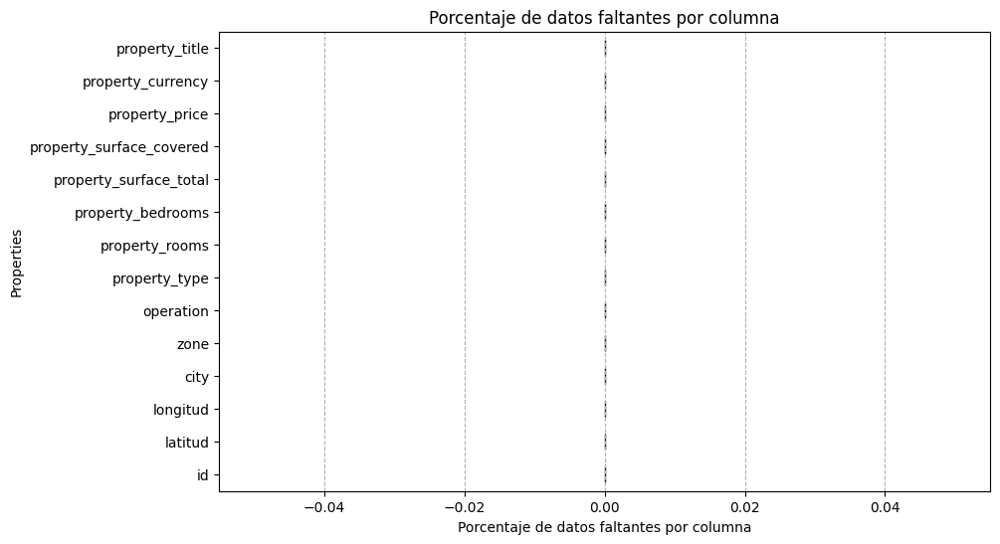

In [45]:
filas_totales = reparado.shape[0]
porcentaje_col_faltante = reparado.isna().sum() / filas_totales * 100


porcentaje_col_faltante.plot(kind='barh', figsize=(10, 6), edgecolor='black')
plt.title('Porcentaje de datos faltantes por columna')
plt.ylabel('Properties')
plt.xlabel('Porcentaje de datos faltantes por columna')
plt.grid(axis='x', linestyle='--')
plt.show()

Ahora vemos el nuevo grafico del porcentaje de datos faltantes por fila:

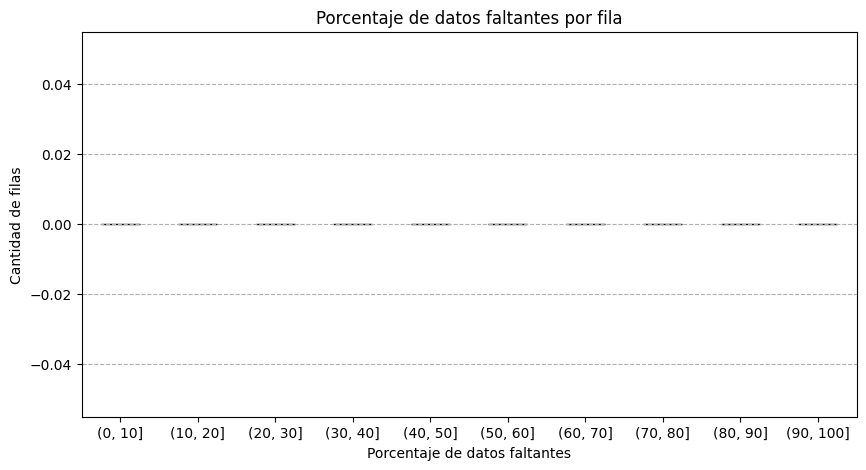

In [46]:
col_totales = len(reparado.columns)
porcentaje_faltante_fila = reparado.isna().sum(axis=1) / col_totales * 100

rangos = [0,10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
porcentaje_agrupado = pd.cut(porcentaje_faltante_fila, bins=rangos).value_counts().sort_index()
plt.figure(figsize=(10, 5))
porcentaje_agrupado.plot(kind='bar', edgecolor='black')
plt.title('Porcentaje de datos faltantes por fila')
plt.xlabel('Porcentaje de datos faltantes')
plt.ylabel('Cantidad de filas')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--')
plt.show()

Podemos ver que no quedan datos faltantes:

In [47]:
reparado.info()

<class 'pandas.core.frame.DataFrame'>
Index: 75267 entries, 285884 to 75496
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        75267 non-null  object 
 1   latitud                   75267 non-null  float64
 2   longitud                  75267 non-null  float64
 3   city                      75267 non-null  object 
 4   zone                      75267 non-null  object 
 5   operation                 75267 non-null  object 
 6   property_type             75267 non-null  object 
 7   property_rooms            75267 non-null  float64
 8   property_bedrooms         75267 non-null  float64
 9   property_surface_total    75267 non-null  float64
 10  property_surface_covered  75267 non-null  float64
 11  property_price            75267 non-null  float64
 12  property_currency         75267 non-null  object 
 13  property_title            75267 non-null  object 
dtypes: flo

Finalmente se podrían quitar las columnas "property_currency" ya que todas estan en USD y la columna "id" ya que todos los id son únicos y no aportan informacion

In [48]:
reparado = reparado.drop(columns=["id", "property_currency"])

Y ahora la estructura es la siguiente:

In [49]:
reparado.head(1)

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title
285884,-34.62139,-58.506366,Capital Federal,Monte Castro,Venta,Departamento,3.0,2.0,51.0,44.0,112000.0,Venta tres ambientes chico cochera y amplio ba...


### d.) Análisis de valores atípicos.

Primero comenzamos buscando valores que no sean lógicos del problema a tratar.

In [50]:
reparado[(reparado['property_bedrooms'] < 0) | (reparado['property_rooms'] < 0)]

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title
406880,-34.577595,-58.495185,Capital Federal,Villa Urquiza,Venta,Departamento,2.0,-1.0,61.0,43.0,125000.0,Jardines de Roosevelt - Hermoso 3 ambientes co...


No es probable que un inmueble, en este caso un departamento, -1 habitaciones. Puede tratarse de un dato mal cargado o de un registro incorrecto. Consideraremos que se trata de un error de tipeo por el título del anuncio haciendo referencia que se trata de un tres ambientes

In [51]:
reparado.loc[reparado[reparado['property_bedrooms'] < 0].index,'property_bedrooms'] = 1

Realizamos los mismos para otras variables y no nos encontramos registros que cumplan con la condición.

In [52]:
reparado[(reparado['property_price'] <= 0) | (reparado['property_surface_total'] <= 0) | (reparado['property_surface_covered'] <= 0)]

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title


#### d.2) Análisis univariado

Para encontrar otros valores atípicos comenzaremos con un análisis univariado. Decidimos comenzar graficando diferentes boxplot para poder reconocer los valores que se alejan de manera visual y así tener un primer acercamiento.

In [53]:
columnas = ['property_rooms', 'property_bedrooms']

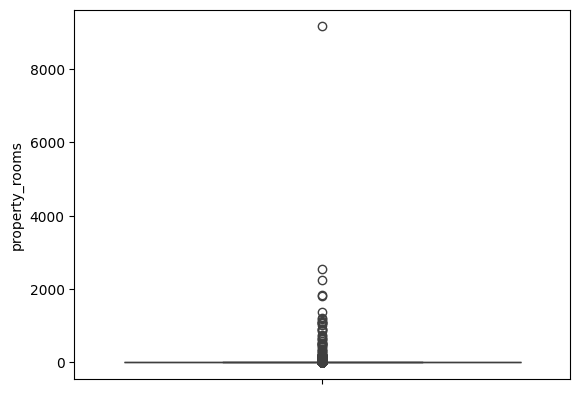

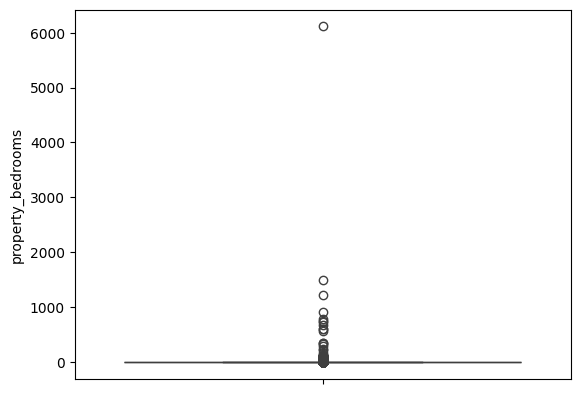

In [54]:
for col in columnas:
  sns.boxplot(y=reparado[col])
  plt.show()
  print('\n\n')

Podemos notar que tenemos registros que se alejan del común de los datos. Se puede ver a simple vista que son outliers

#### property_bedrooms

In [55]:
reparado['property_bedrooms'].describe()

count    75267.000000
mean         2.156124
std         24.736009
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max       6113.000000
Name: property_bedrooms, dtype: float64

Calcularemos la métrica Z-score y Z-score modificado para luego tomar decisiones al respecto.

In [56]:
def z_calculation(serie):
  media = np.mean(serie)
  std = np.std(serie)
  return (serie - media) / std

def z_mod_calculation(serie):
  median = np.median(serie)
  MAD = np.median(np.absolute(serie - median))
  return (serie - median) * 0.6745 / MAD

In [57]:
reparado["z_bedrooms"] = z_calculation(reparado['property_bedrooms'])

In [58]:
reparado["z_mod_bedrooms"] = z_mod_calculation(reparado['property_bedrooms'])

Observaremos los inmuebles que cumplen con la "regla de oro" de ambas métricas.

In [59]:
print(reparado[(reparado['z_bedrooms'] > 3) | (reparado['z_bedrooms'] < -3)].shape)
reparado[(reparado['z_bedrooms'] > 3) | (reparado['z_bedrooms'] < -3)]

(34, 14)


,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,z_bedrooms,z_mod_bedrooms
333910,-34.651286,-58.508025,Capital Federal,Liniers,Venta,Departamento,2257.0,1505.0,595.000000,47402.815840,1100000.0,Departamento - Liniers,60.755713,1013.7735
21244,-34.625605,-58.397219,Capital Federal,Constitución,Venta,Casa,1182.0,788.0,318.000000,28365.840806,300000.0,Casa - Constitución,31.769438,530.1570
169009,-34.628589,-58.463167,Capital Federal,Flores,Venta,PH,184.0,123.0,50.000000,4223.766954,10000.0,Tus Contactos Valen Recomendanos Gente y Gana ...,4.885375,81.6145
4275,-34.638494,-58.468998,Capital Federal,Flores,Venta,Casa,856.0,571.0,233.000000,19682.754007,249900.0,Casa - Flores,22.996743,383.7905
375559,-34.558574,-58.446057,Capital Federal,Belgrano,Venta,Departamento,123.0,82.0,37.000000,3150.932253,117000.0,Departamento - Belgrano,3.227861,53.9600
403550,-34.631721,-58.478355,Capital Federal,Floresta,Venta,PH,1101.0,734.0,313.000000,24587.791974,260000.0,Venta en Block - 4 PH a refaccionar en Floresta,29.586371,493.7340
209150,-34.597522,-58.374412,Capital Federal,Retiro,Venta,Departamento,128.0,85.0,31.000000,2891.578103,80000.0,Departamento - Retiro,3.349143,55.9835
32624,-34.641866,-58.402643,Capital Federal,Parque Patricios,Venta,Casa,523.0,349.0,127.000000,10984.530487,225000.0,Casa - Parque Patricios,14.021914,234.0515
169752,-34.628589,-58.463167,Capital Federal,Flores,Venta,Departamento,184.0,123.0,50.000000,4223.766954,10000.0,Tus Contactos Valen Recomendanos Gente y Gana ...,4.885375,81.6145
24893,-34.603877,-58.493163,Capital Federal,Villa del Parque,Venta,PH,341.0,227.0,95.000000,7607.117198,230000.0,PH 4 ambientes terraza y patio - Villa del Parque,9.089800,151.7625


In [60]:
print(reparado[(reparado['z_mod_bedrooms'] > 3.5) | (reparado['z_mod_bedrooms'] < -3.5)].shape)
reparado[(reparado['z_mod_bedrooms'] > 3.5) | (reparado['z_mod_bedrooms'] < -3.5)]

(216, 14)


,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,z_bedrooms,z_mod_bedrooms
328872,-34.583469,-58.450238,Capital Federal,Chacarita,Venta,Casa,13.0,9.0,530.000000,360.0,560000.0,Casa - Chacarita,0.276678,4.7215
129078,-34.597318,-58.389639,Capital Federal,Recoleta,Venta,Departamento,9.0,8.0,160.000000,160.0,315000.0,Piso 8 dormitorios en venta - Recoleta - Marce...,0.236251,4.0470
147972,-34.605473,-58.387790,Capital Federal,San Nicolás,Venta,Departamento,9.0,8.0,180.000000,156.0,175000.0,Departamento - San Nicolas,0.236251,4.0470
396876,-34.604062,-58.405112,Capital Federal,Once,Venta,Departamento,14.0,12.0,301.000000,179.0,220000.0,Venta Departamento 12 Ambientes,0.397960,6.7450
212637,-34.559873,-58.449254,Capital Federal,Belgrano,Venta,Departamento,12.0,8.0,470.000000,300.0,1150000.0,Local - Belgrano Barrancas,0.236251,4.0470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33028,-34.642399,-58.445755,Capital Federal,Flores,Venta,Casa,9.0,8.0,375.000000,350.0,250000.0,CASA TALLER DEPOSITO VENTA BAJO FLORES,0.236251,4.0470
309970,-34.617148,-58.463260,Capital Federal,Flores,Venta,Departamento,17.0,11.0,547.000000,396.0,1100000.0,EDIFICIO EN BLOQUE A ESTRENAR - 8 UNIDADES - 1...,0.357533,6.0705
312668,-34.655732,-58.409439,Capital Federal,Pompeya,Venta,PH,14.0,10.0,270.000000,217.0,190000.0,PH 5 DEPARTAMENTOS OPORTUNIDAD VENTA POMPEYA ...,0.317106,5.3960
94998,-34.646632,-58.497902,Capital Federal,Villa Luro,Venta,Departamento,3.0,70.0,82.745773,70.0,135000.0,Departamento - Villa Luro,2.742735,45.8660


In [61]:
print(reparado[((reparado['z_mod_bedrooms'] > 3.5) | (reparado['z_mod_bedrooms'] < -3.5)) & ((reparado['z_bedrooms'] > 3) | (reparado['z_bedrooms'] < -3))].shape)
reparado[((reparado['z_mod_bedrooms'] > 3.5) | (reparado['z_mod_bedrooms'] < -3.5)) & ((reparado['z_bedrooms'] > 3) | (reparado['z_bedrooms'] < -3))]

(34, 14)


,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,z_bedrooms,z_mod_bedrooms
333910,-34.651286,-58.508025,Capital Federal,Liniers,Venta,Departamento,2257.0,1505.0,595.000000,47402.815840,1100000.0,Departamento - Liniers,60.755713,1013.7735
21244,-34.625605,-58.397219,Capital Federal,Constitución,Venta,Casa,1182.0,788.0,318.000000,28365.840806,300000.0,Casa - Constitución,31.769438,530.1570
169009,-34.628589,-58.463167,Capital Federal,Flores,Venta,PH,184.0,123.0,50.000000,4223.766954,10000.0,Tus Contactos Valen Recomendanos Gente y Gana ...,4.885375,81.6145
4275,-34.638494,-58.468998,Capital Federal,Flores,Venta,Casa,856.0,571.0,233.000000,19682.754007,249900.0,Casa - Flores,22.996743,383.7905
375559,-34.558574,-58.446057,Capital Federal,Belgrano,Venta,Departamento,123.0,82.0,37.000000,3150.932253,117000.0,Departamento - Belgrano,3.227861,53.9600
403550,-34.631721,-58.478355,Capital Federal,Floresta,Venta,PH,1101.0,734.0,313.000000,24587.791974,260000.0,Venta en Block - 4 PH a refaccionar en Floresta,29.586371,493.7340
209150,-34.597522,-58.374412,Capital Federal,Retiro,Venta,Departamento,128.0,85.0,31.000000,2891.578103,80000.0,Departamento - Retiro,3.349143,55.9835
32624,-34.641866,-58.402643,Capital Federal,Parque Patricios,Venta,Casa,523.0,349.0,127.000000,10984.530487,225000.0,Casa - Parque Patricios,14.021914,234.0515
169752,-34.628589,-58.463167,Capital Federal,Flores,Venta,Departamento,184.0,123.0,50.000000,4223.766954,10000.0,Tus Contactos Valen Recomendanos Gente y Gana ...,4.885375,81.6145
24893,-34.603877,-58.493163,Capital Federal,Villa del Parque,Venta,PH,341.0,227.0,95.000000,7607.117198,230000.0,PH 4 ambientes terraza y patio - Villa del Parque,9.089800,151.7625


In [62]:
reparado[((reparado['z_mod_bedrooms'] > 3.5) | (reparado['z_mod_bedrooms'] < -3.5)) & ((reparado['z_bedrooms'] > 3) | (reparado['z_bedrooms'] < -3))]['property_bedrooms'].describe()

count      34.000000
mean      534.441176
std      1048.550376
min        78.000000
25%       110.250000
50%       198.000000
75%       609.750000
max      6113.000000
Name: property_bedrooms, dtype: float64

Podemos ver que este rango se centra en inmuebles con más de 75 bedrooms. Decidimos eliminar las filas de los registros con estos valores porque no pudimos encontrarle una razón lógica a los datos y resultaban estar muy alejados a la realidad y que, al final, a la hora de entrenar un modelo para obtener la predicción que buscamos va a causar resultados erróneos.

In [63]:
index = reparado[((reparado['z_mod_bedrooms'] > 3.5) | (reparado['z_mod_bedrooms'] < -3.5)) & ((reparado['z_bedrooms'] > 3) | (reparado['z_bedrooms'] < -3))].index
reparado.drop(index, inplace=True)

In [64]:
reparado[(reparado['z_bedrooms'] > 3) | (reparado['z_bedrooms'] < -3)]

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,z_bedrooms,z_mod_bedrooms


In [65]:
reparado[(reparado['z_mod_bedrooms'] > 3.5) | (reparado['z_mod_bedrooms'] < -3.5)]

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,z_bedrooms,z_mod_bedrooms
328872,-34.583469,-58.450238,Capital Federal,Chacarita,Venta,Casa,13.0,9.0,530.000000,360.0,560000.0,Casa - Chacarita,0.276678,4.7215
129078,-34.597318,-58.389639,Capital Federal,Recoleta,Venta,Departamento,9.0,8.0,160.000000,160.0,315000.0,Piso 8 dormitorios en venta - Recoleta - Marce...,0.236251,4.0470
147972,-34.605473,-58.387790,Capital Federal,San Nicolás,Venta,Departamento,9.0,8.0,180.000000,156.0,175000.0,Departamento - San Nicolas,0.236251,4.0470
396876,-34.604062,-58.405112,Capital Federal,Once,Venta,Departamento,14.0,12.0,301.000000,179.0,220000.0,Venta Departamento 12 Ambientes,0.397960,6.7450
212637,-34.559873,-58.449254,Capital Federal,Belgrano,Venta,Departamento,12.0,8.0,470.000000,300.0,1150000.0,Local - Belgrano Barrancas,0.236251,4.0470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33028,-34.642399,-58.445755,Capital Federal,Flores,Venta,Casa,9.0,8.0,375.000000,350.0,250000.0,CASA TALLER DEPOSITO VENTA BAJO FLORES,0.236251,4.0470
309970,-34.617148,-58.463260,Capital Federal,Flores,Venta,Departamento,17.0,11.0,547.000000,396.0,1100000.0,EDIFICIO EN BLOQUE A ESTRENAR - 8 UNIDADES - 1...,0.357533,6.0705
312668,-34.655732,-58.409439,Capital Federal,Pompeya,Venta,PH,14.0,10.0,270.000000,217.0,190000.0,PH 5 DEPARTAMENTOS OPORTUNIDAD VENTA POMPEYA ...,0.317106,5.3960
94998,-34.646632,-58.497902,Capital Federal,Villa Luro,Venta,Departamento,3.0,70.0,82.745773,70.0,135000.0,Departamento - Villa Luro,2.742735,45.8660


In [66]:
reparado[((reparado['z_mod_bedrooms'] > 3.5) | (reparado['z_mod_bedrooms'] < -3.5))]['property_bedrooms'].describe()

count    182.000000
mean      14.280220
std       12.461811
min        8.000000
25%        8.000000
50%       10.000000
75%       14.750000
max       76.000000
Name: property_bedrooms, dtype: float64

Existen registros que cumplen con la regla de oro del z-score modificado, pero que coinciden con la descripción de la publicación y no resultan tan alejados a la realidad como para decidir eliminarlos.

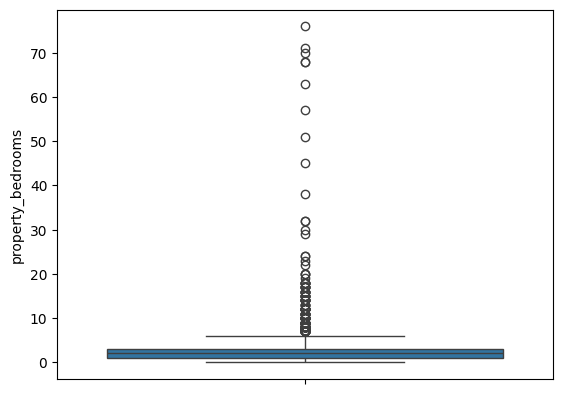

In [67]:
sns.boxplot(y=reparado['property_bedrooms'])
plt.show()

Se puede corroborar en el siguiente gráfico que todavía existen outliers, pero que consideramos no sacarlos.





#### property_rooms

In [68]:
reparado['property_rooms'].describe()

count    75233.000000
mean         3.115893
std         16.201402
min          0.000000
25%          2.000000
50%          3.000000
75%          4.000000
max       2558.000000
Name: property_rooms, dtype: float64

Apreciamos que también tenemos un valor altísimo de ambientes que no resultan lógicos, volveremos a analizar con más detenimiento estos casos y calcularemos las métricas.

<Axes: ylabel='property_rooms'>

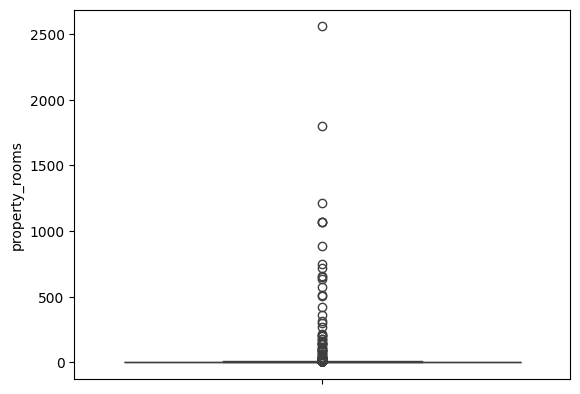

In [69]:
sns.boxplot(y=reparado['property_rooms'])

In [70]:
reparado["z_rooms"] = z_calculation(reparado['property_rooms'])
reparado["z_mod_rooms"] = z_mod_calculation(reparado['property_rooms'])

43 filas del dataset cumplen con la regla de oro del z-score

In [71]:
reparado[(reparado['z_rooms'] > 3) | (reparado['z_rooms'] < -3)].shape

(43, 16)

Mientras que 530 filas con el z-score modificado.

In [72]:
reparado[(reparado['z_mod_rooms'] > 3.5) | (reparado['z_mod_rooms'] < -3.5)].shape

(530, 16)

Al igual que antes, decidimos observar los registros que cumplen con ambos antes.

In [73]:
print(reparado[((reparado['z_rooms'] > 3) | (reparado['z_rooms'] < -3)) & ((reparado['z_mod_rooms'] > 3.5) | (reparado['z_mod_rooms'] < -3.5))].shape)
reparado[((reparado['z_rooms'] > 3) | (reparado['z_rooms'] < -3)) & ((reparado['z_mod_rooms'] > 3.5) | (reparado['z_mod_rooms'] < -3.5))]

(43, 16)


,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,z_bedrooms,z_mod_bedrooms,z_rooms,z_mod_rooms
356600,-34.582228,-58.406415,Capital Federal,Palermo,Venta,Departamento,106.0,71.0,35.00000,2332.305083,130000.0,Departamento - Palermo,2.783163,46.5405,6.350363,69.4735
192561,-34.623793,-58.402256,Capital Federal,San Cristobal,Venta,Casa,1801.0,13.0,368.00000,32442.736120,350000.0,"Casa con 6 dptos tipo ph en BLOCK, IDEAL PARA ...",0.438387,7.4195,110.971632,1212.7510
161979,-34.593729,-58.379936,Capital Federal,Retiro,Venta,Departamento,502.0,2.0,122.00000,11379.758984,370000.0,Departamento - Retiro,-0.006312,0.0000,30.792854,336.5755
434544,-34.620429,-58.361087,Capital Federal,Puerto Madero,Venta,Departamento,298.0,2.0,127.00000,11726.095681,720000.0,Departamento - Puerto Madero,-0.006312,0.0000,18.201268,198.9775
105126,-34.576741,-58.404830,Capital Federal,Palermo Chico,Venta,Departamento,1070.0,4.0,400.00000,36631.173435,2700000.0,Departamento - Palermo Chico,0.074543,1.3490,65.851781,719.6915
248089,-34.575048,-58.420743,Capital Federal,Palermo,Venta,Departamento,1212.0,4.0,400.00000,26654.915239,2700000.0,Departamento - Palermo Nuevo,0.074543,1.3490,74.616512,815.4705
306004,-34.628711,-58.458227,Capital Federal,Flores,Venta,Departamento,268.0,2.0,73.00000,6166.699753,149000.0,VENTA - 3 AMBIENTES - 2 DORMITORIOS EN SUITE ...,-0.006312,0.0000,16.349564,178.7425
2790,-34.606366,-58.383480,Capital Federal,San Nicolás,Venta,Departamento,750.0,6.0,178.00000,16882.888903,200000.0,"venta DEPARTAMENTO APTO PROFESIONAL, 6 habitac...",0.155397,2.6980,46.100273,503.8515
60841,-34.609896,-58.476014,Capital Federal,Paternal,Venta,PH,647.0,4.0,165.00000,12949.243616,109000.0,PH - Paternal,0.074543,1.3490,39.742756,434.3780
389059,-34.577332,-58.445887,Capital Federal,Colegiales,Venta,PH,57.0,38.0,37.00000,1242.091576,115000.0,PH - Colegiales,1.449066,24.2820,3.325914,36.4230


In [74]:
reparado['property_rooms'].describe()

count    75233.000000
mean         3.115893
std         16.201402
min          0.000000
25%          2.000000
50%          3.000000
75%          4.000000
max       2558.000000
Name: property_rooms, dtype: float64

También resultan valores bastante alejados de la realidad que, si los dejamos, puede que entrene en un futuro a nuestro modelo de forma incorrecta y de valores alejados a la realidad. Al igual que antes, tomamos la decisión de dropearlos.

In [75]:
index = reparado[((reparado['z_mod_rooms'] > 3.5) | (reparado['z_mod_rooms'] < -3.5)) & ((reparado['z_rooms'] > 3) | (reparado['z_rooms'] < -3))].index
reparado.drop(index, inplace=True)

In [76]:
reparado[(reparado['z_mod_rooms'] > 3.5) | (reparado['z_mod_rooms'] < -3.5)]

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,z_bedrooms,z_mod_bedrooms,z_rooms,z_mod_rooms
328872,-34.583469,-58.450238,Capital Federal,Chacarita,Venta,Casa,13.0,9.0,530.000000,360.0,560000.0,Casa - Chacarita,0.276678,4.7215,0.610081,6.7450
269052,-34.575012,-58.457444,Capital Federal,Colegiales,Venta,Casa,10.0,4.0,690.492360,600.0,650000.0,Casa - Colegiales,0.074543,1.3490,0.424911,4.7215
129078,-34.597318,-58.389639,Capital Federal,Recoleta,Venta,Departamento,9.0,8.0,160.000000,160.0,315000.0,Piso 8 dormitorios en venta - Recoleta - Marce...,0.236251,4.0470,0.363187,4.0470
147972,-34.605473,-58.387790,Capital Federal,San Nicolás,Venta,Departamento,9.0,8.0,180.000000,156.0,175000.0,Departamento - San Nicolas,0.236251,4.0470,0.363187,4.0470
6279,-34.593211,-58.390512,Capital Federal,Recoleta,Venta,Departamento,10.0,5.0,600.000000,600.0,2000000.0,PISO VIVIENDA APTO PROF EN RECOLETA LAS HERAS...,0.114970,2.0235,0.424911,4.7215
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350829,-34.600688,-58.514393,Capital Federal,Villa Devoto,Venta,Casa,20.0,4.0,549.801987,550.0,950000.0,Casa - Villa Devoto,0.074543,1.3490,1.042146,11.4665
229851,-34.577553,-58.400657,Capital Federal,Palermo Chico,Venta,Casa,11.0,4.0,580.000000,380.0,2900000.0,EXCLUSIVA CASA EN BARRIO PARQUE - 380M2 - AMP...,0.074543,1.3490,0.486634,5.3960
244028,-34.603597,-58.462264,Capital Federal,Caballito,Venta,PH,12.0,8.0,300.000000,260.0,250000.0,PH - Caballito,0.236251,4.0470,0.548358,6.0705
146689,-34.573243,-58.467891,Capital Federal,Belgrano,Venta,Casa,16.0,5.0,420.000000,420.0,960000.0,"Chalet en Venta, ubicado en Belgrano ""R"".",0.114970,2.0235,0.795252,8.7685


Seguimos teniendo registros que cumplen con la regla de oro del z-score modificado pero, nuevamente, consideramos que podrían ser valores más cercanos a la realidad por ende, por el momento, decidimos mantenerlos.

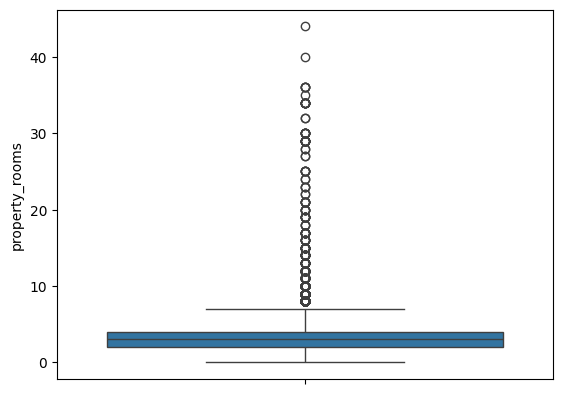

In [77]:
sns.boxplot(y=reparado['property_rooms'])
plt.show()

In [78]:
reparado.drop(['z_bedrooms', 'z_mod_bedrooms',
       'z_rooms', 'z_mod_rooms'], axis=1, inplace=True)

#### Análisis multivariado.

#### Mahalanobis

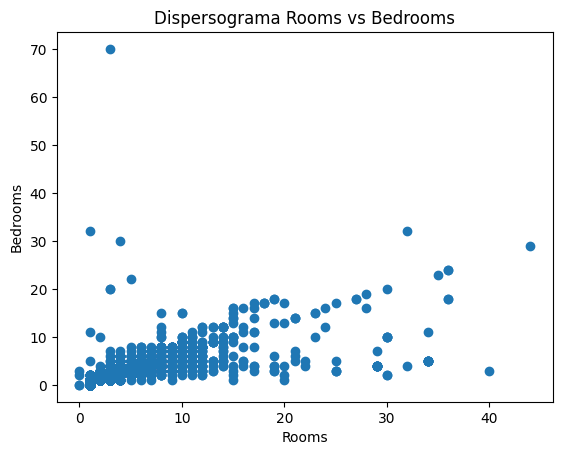

In [79]:
plt.scatter(reparado['property_rooms'], reparado['property_bedrooms'])
plt.title("Dispersograma Rooms vs Bedrooms")
plt.xlabel("Rooms")
plt.ylabel("Bedrooms")
plt.show()

Podemos notar que existen observacions anómalas, pero no son demasiadas. El valor notoriamente más alejado resulta ser una propiedad, en principio, con más de 70 habitaciones y pocos ambientes. Igualmente, calcularemos la distancia de mahalanobis para cada observación.

In [80]:
columnas = ["property_rooms", "property_bedrooms"]

In [81]:
def calculate_mahalanobis_distance(dataset, col1, col2, frac=1):
    X = dataset[[f'{col1}', f'{col2}']].copy()
    sample_X = X.sample(frac=frac)

    mu = sample_X.mean()
    X_diff = X - mu
    X_diff = X_diff.values.T

    cov = np.cov(sample_X.values.T)
    inv_cov = np.linalg.inv(cov)
    W = la.sqrtm(inv_cov)

    Wx = np.matmul(W, X_diff)
    X['mahalanobis'] = [np.dot(Wx[:, i], Wx[:, i]) for i in range(Wx.shape[1])]

    return X

In [82]:
reparado['mahalanobis'] = calculate_mahalanobis_distance(reparado, 'property_bedrooms', 'property_rooms')['mahalanobis']

<Axes: ylabel='mahalanobis'>

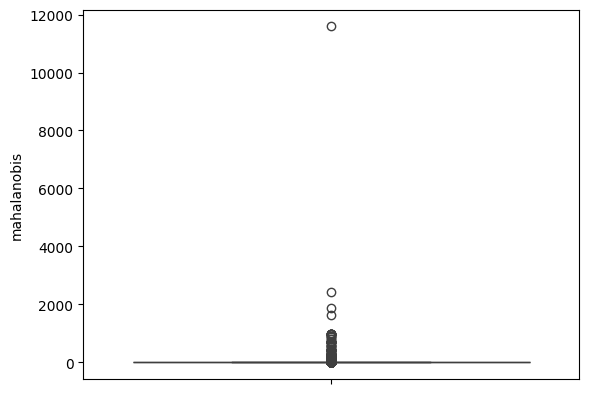

In [83]:
sns.boxplot(y=reparado.mahalanobis)

In [84]:
# Cuartiles
Q1 = np.quantile(reparado['mahalanobis'], 0.25)
Q3 = np.quantile(reparado['mahalanobis'], 0.75)

# Rango intercuartil
IQR = Q3 - Q1

# Limite inferior Outliers
out_inf = Q3 - 1.5 * IQR

# Limite superior Outliers
out_sup = Q3 + 1.5 * IQR

out_inf, out_sup

(-0.687499564109082, 3.4822508384139876)

In [85]:
umbral = 1100
reparado[reparado["mahalanobis"] > umbral]

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,mahalanobis
49960,-34.630186,-58.389156,Capital Federal,Parque Patricios,Venta,Departamento,1.0,32.0,32.000000,32.0,52000.0,Depto 1 ambiente amplio apto profesional,2441.786298
356618,-34.588742,-58.422459,Capital Federal,Palermo,Venta,Departamento,40.0,3.0,75.000000,68.0,145000.0,SOLER 4400 - PALERMO - DPTO 4 AMB C/ BALCON AL...,1627.971880
86014,-34.591110,-58.400685,Capital Federal,Recoleta,Venta,Departamento,4.0,30.0,148.000000,138.0,380000.0,Departamento. Recoleta. Balcón terraza. Silenc...,1884.157845
94998,-34.646632,-58.497902,Capital Federal,Villa Luro,Venta,Departamento,3.0,70.0,82.745773,70.0,135000.0,Departamento - Villa Luro,11594.189741


Nos encontramos con el registro de 70 habitaciones y 3 ambientes que resulta totalmente ilógico, además también de aquellos que tienen más habitaciones que ambientes. El último, en cambio, se trata de un error de tipeo a la hora de cargar el dataset por la descripción de la publicación en la columna title, se trataría de 4 ambientes y no 40. A pesar de que con el boxplot pudimos detectar un solo outliers, analizarlo nos brindó otros.

In [86]:
umbral_max = 1100
umbral_min = 500
reparado[(reparado["mahalanobis"] > umbral_min) & (reparado['mahalanobis'] < umbral_max)]

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,mahalanobis
278256,-34.562512,-58.453917,Capital Federal,Belgrano,Venta,Casa,34.0,5.0,1050.000000,870.000000,3250000.0,Impactante casa estilo INGLÉS - VIRREY DEL PIN...,963.621571
21009,-34.616391,-58.456038,Capital Federal,Caballito,Venta,Departamento,30.0,2.0,79.000000,79.000000,230000.0,C/DEP COCH Y BAULERA - SEGUI AL 700 - Caballito,925.035530
376658,-34.562512,-58.453917,Capital Federal,Belgrano,Venta,Casa,34.0,5.0,1050.000000,870.000000,3250000.0,Impactante casa estilo INGLÉS - VIRREY DEL PIN...,963.621571
137283,-34.579205,-58.398950,Capital Federal,Palermo Chico,Venta,Casa,29.0,4.0,1000.000000,990.000000,4500000.0,VENTA en Palermo Chico Barrio Parque Casa esti...,712.455021
357450,-34.579205,-58.398950,Capital Federal,Palermo Chico,Venta,Casa,29.0,4.0,1000.000000,990.000000,4500000.0,VENTA en Palermo Chico Barrio Parque Casa esti...,712.455021
22023,-34.620757,-58.374913,Capital Federal,San Telmo,Venta,Casa,29.0,7.0,750.000000,750.000000,1500000.0,Casa en venta con 7 dormitorios en San Telmo,531.951621
134312,-34.579205,-58.398950,Capital Federal,Palermo Chico,Venta,Casa,29.0,4.0,1000.000000,990.000000,4500000.0,VENTA en Palermo Chico Barrio Parque Casa esti...,712.455021
168118,-34.606525,-58.430740,Capital Federal,Caballito,Venta,Departamento,44.0,29.0,12.000000,978.535286,23000.0,Departamento - Caballito,649.221578
132367,-34.579205,-58.398950,Capital Federal,Palermo Chico,Venta,Casa,29.0,4.0,1000.000000,990.000000,4500000.0,VENTA en Palermo Chico Barrio Parque Casa esti...,712.455021
368773,-34.562512,-58.453917,Capital Federal,Belgrano,Venta,Casa,34.0,5.0,1050.000000,870.000000,3250000.0,Impactante casa estilo INGLÉS - VIRREY DEL PIN...,963.621571


Algunos valores pueden ser correctos porque existen registros catalogados como departamentos cuando en realidad están vendiendo edificios, otros también tienen un error de tipeo detectado a la hora de comparar con el título del anuncio. En algunos casos podría haber registros con valores correctos.

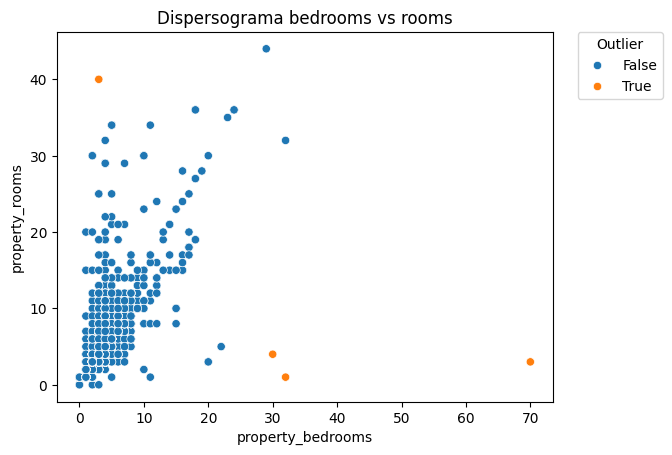

In [87]:
# Grafico scatter
es_outlier = reparado["mahalanobis"] > umbral

sns.scatterplot(x=reparado['property_bedrooms'], y=reparado['property_rooms'], hue=es_outlier)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0, title="Outlier")
plt.title("Dispersograma bedrooms vs rooms")
plt.show()

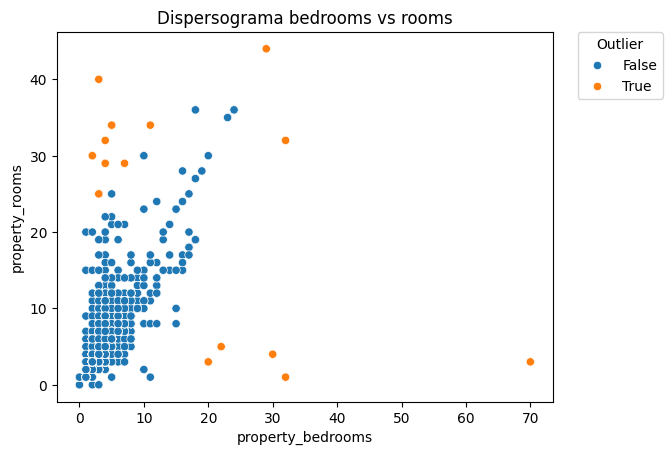

In [88]:
# Grafico scatter
es_outlier = reparado["mahalanobis"] > umbral_min

sns.scatterplot(x=reparado['property_bedrooms'], y=reparado['property_rooms'], hue=es_outlier)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0, title="Outlier")
plt.title("Dispersograma bedrooms vs rooms")
plt.show()

Gráficamente, tomando un umbral de 1100, podemos ver que se detectan outliers que realmente estan alejados a la nube de puntos. En cambio bajando más el mismo también considera outliers a puntos que están un poco más cerca de los valores que consideramos lógicos, pero que siguen siendo atípicos. Por lo tanto vamos a eliminar aquellos registros cuya distancia sea mayor a 500.

In [89]:
reparado.drop(reparado[reparado["mahalanobis"] > umbral_min].index, inplace=True)

### Relación entre price vs superfice_total

El trabajo práctico propone también analizar la relación entre precio de venta y los métros de superficie en busca de valores anómalos.

In [90]:
reparado['mahalanobis'] = calculate_mahalanobis_distance(reparado, 'property_price', 'property_surface_total')['mahalanobis']

<Axes: ylabel='mahalanobis'>

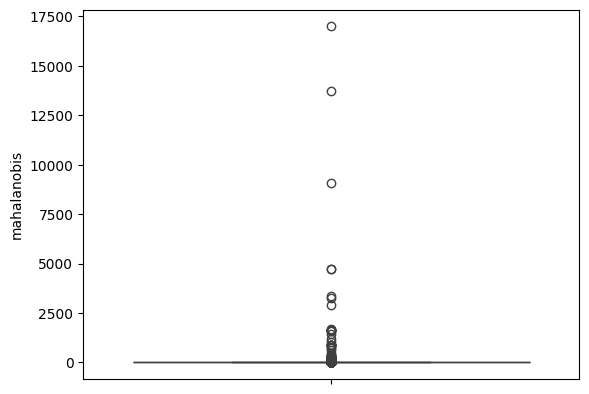

In [91]:
sns.boxplot(y=reparado.mahalanobis)

Como se puede apreciar, también existen valores anómalos que no detectamos anteriormente. Haremos el mismo trabajo de análisis, definiremos un umbral y veremos, de a partes, cómo son y qué proponemos realizar con estos registros.

In [92]:
umbral = 1000
reparado[reparado["mahalanobis"] > umbral]

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,mahalanobis
370932,-34.571747,-58.422612,Capital Federal,Palermo,Venta,Departamento,4.0,3.0,42110.0,307.0,1691800.0,REVENTA: L'avenue- Departamento de 4 Ambientes...,1594.099325
72521,-34.600113,-58.403649,Capital Federal,Balvanera,Venta,Departamento,2.0,1.0,33800.0,31670.0,66000.0,VENTA 2 AMBIENTES CON RENTA,1033.156479
60073,-34.616044,-58.458621,Capital Federal,Caballito,Venta,Departamento,3.0,2.0,68.0,64.0,21400000.0,Departamento venta,4747.086219
370922,-34.571747,-58.422612,Capital Federal,Palermo,Venta,Departamento,5.0,4.0,42110.0,307.0,2829000.0,Reventa - Departamento - Palermo Nuevo - Liber...,1619.893080
370921,-34.571747,-58.422612,Capital Federal,Palermo,Venta,Departamento,5.0,4.0,42110.0,307.0,2890500.0,Reventa - Departamento - Palermo Nuevo - Liber...,1622.068396
84073,-34.588175,-58.396261,Capital Federal,Recoleta,Venta,Departamento,1.0,1.0,36000.0,30.0,90000.0,Departamento Monoambiente alquiler temporario ...,1171.791520
356064,-31.198907,-60.159719,Capital Federal,Saavedra,Venta,Casa,15.0,2.0,60000.0,350.0,186000.0,VENTA CASA + GALPON + CAMPO EN COLONIA CAMPO D...,3257.137470
370919,-34.571747,-58.422612,Capital Federal,Palermo,Venta,Departamento,5.0,4.0,42110.0,307.0,3044250.0,Reventa - Departamento - Palermo Nuevo - Liber...,1627.857020
72316,-34.578917,-58.429373,Capital Federal,Palermo,Venta,Departamento,2.0,1.0,61130.0,53030.0,225000.0,VENTA DEPARTAMENTO 2 AMBIENTES PALERMO C/AMENI...,3380.016026
129214,-34.599421,-58.386867,Capital Federal,Barrio Norte,Venta,Departamento,5.0,3.0,137000.0,135.0,390000.0,Alquiler Divino 5 Amb. - 137 M² en Barrio Norte,17000.334363


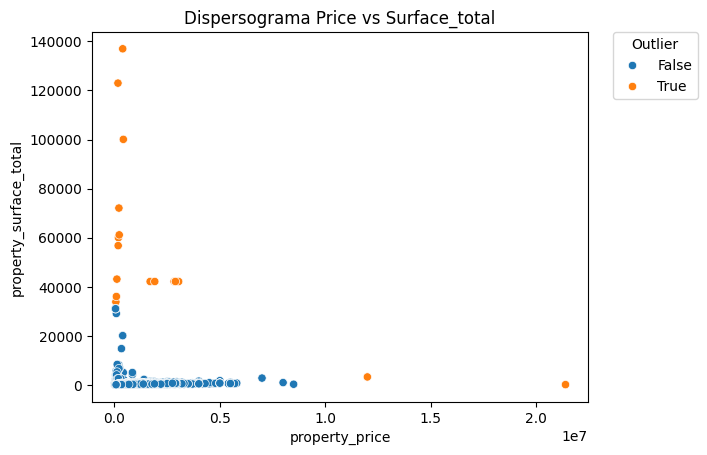

In [93]:
# Grafico scatter
es_outlier = reparado["mahalanobis"] > 1000

sns.scatterplot(x=reparado['property_price'], y=reparado['property_surface_total'], hue=es_outlier)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0, title="Outlier")
plt.title("Dispersograma Price vs Surface_total")
plt.show()

Son registros que difieren mucho con respecto a otros. Pueden tratarse de errores de tipeo o simplemente propiedades que se encuentren en diferentes zonas que influyen en el precio del inmueble a pesar de que tengan la misma superficie. En este caso tomamos la decisión de dejar estos puntos dentro del dataset.

# **2. Agrupamiento**

## a)Analizar la tendencia al clustering del dataset.
Primero instalo la libreria pyclustertend:


In [94]:
!pip install pyclustertend==1.4.9

Ahora calculo hopkins:

In [95]:
from pyclustertend import hopkins
from sklearn.preprocessing import scale, MinMaxScaler

In [96]:
reparado

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,mahalanobis
285884,-34.621390,-58.506366,Capital Federal,Monte Castro,Venta,Departamento,3.0,2.0,51.0,44.0,112000.0,Venta tres ambientes chico cochera y amplio ba...,0.134248
120762,-34.563005,-58.453674,Capital Federal,Belgrano,Venta,Departamento,3.0,2.0,79.0,66.0,299900.0,VENTA DEPARTAMENTO 3 AMB COCHERA BELGRANO,0.062156
419659,-34.612349,-58.491906,Capital Federal,Villa del Parque,Venta,Departamento,3.0,2.0,110.0,80.0,249000.0,VENTA | DEPARTAMENTO |3 AMBIENTES | V. DEL PARQUE,0.006317
21443,-34.620806,-58.397336,Capital Federal,Boedo,Venta,PH,3.0,2.0,97.0,67.0,135000.0,Casa - Boedo,0.084562
103677,-34.558229,-58.446708,Capital Federal,Belgrano,Venta,Departamento,3.0,2.0,89.0,89.0,300000.0,Departamento - Belgrano,0.061451
...,...,...,...,...,...,...,...,...,...,...,...,...,...
30514,-34.569953,-58.488393,Capital Federal,Villa Urquiza,Venta,Departamento,3.0,2.0,100.0,75.0,199000.0,DEPARTAMENTO 3 AMBIENTES - VILLA URQUIZA,0.006920
268902,-34.555575,-58.438803,Capital Federal,Belgrano,Venta,Departamento,3.0,2.0,91.0,81.0,333000.0,Adelanto y 12 cuotas en pesos - Belgrano,0.125829
379634,-34.638700,-58.374163,Capital Federal,Barracas,Venta,Departamento,1.0,1.0,43.0,36.0,99800.0,Departamento premium - mejor zona de Barracas,0.165003
4766,-34.607558,-58.421838,Capital Federal,Almagro,Venta,Departamento,2.0,1.0,34.0,34.0,76120.0,Departamento - Almagro,0.233266


In [97]:
df_clust = reparado.drop(columns=["city","zone","operation","property_type","property_title"])
scaler = MinMaxScaler()
df_escalado = scaler.fit_transform(df_clust)
x = df_clust.iloc[:,2:4]
x_norm = (x-x.min())/(x.max()-x.min())
x_norm.describe()

hopkins(x,x.shape[0])

0.0004042730663914263

Como el valor de hopkins tiende al 0 y teniendo en cuenta la hipótesis nula se puede deducir que no hay cluster significativos.

## b) Estimar la cantidad apropiada de grupos que se deben formar.

Para este punto usaremos el Elbow Method:

In [98]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.cluster import KMeans
import warnings
warnings.simplefilter(action='ignore',category=FutureWarning)
warnings.simplefilter(action='ignore',category=UserWarning)

Text(0, 0.5, 'Distancia promedio al centroide')

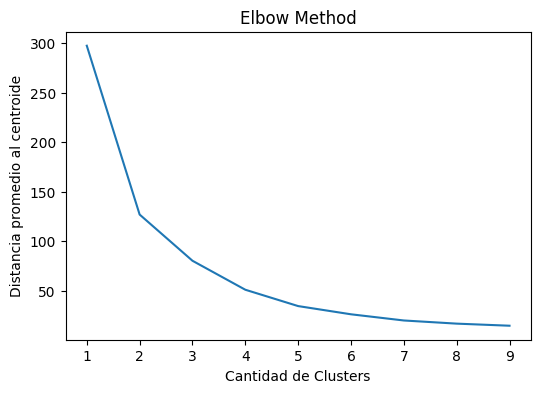

In [99]:
distancias_prom = []
for i in range(1,10):
  kmeans = KMeans(i)
  kmeans.fit(x_norm)
  iner = kmeans.inertia_
  distancias_prom.append(iner)

cant_clust = range(1,10)
plt.figure(figsize=(6,4))
plt.plot(cant_clust,distancias_prom)
plt.title('Elbow Method')
plt.xlabel('Cantidad de Clusters')
plt.ylabel('Distancia promedio al centroide')

En base al gráfico podemos deducir que utilizar 3 o 4 clusters sería lo ideal:

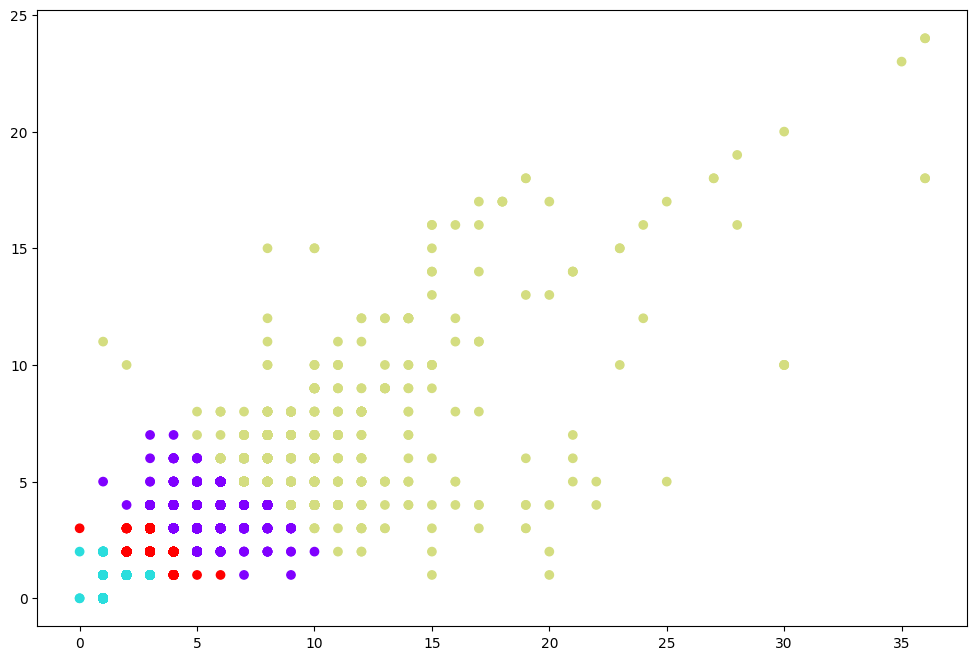

In [100]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(x_norm)
identified_clusters = kmeans.fit_predict(x_norm)
data_with_clusters = df_clust.copy()
data_with_clusters['cluster'] = identified_clusters
plt.figure(figsize=(12,8))
plt.scatter(data_with_clusters["property_rooms"], data_with_clusters["property_bedrooms"], c=data_with_clusters["cluster"], cmap='rainbow')
plt.show()

## c) Evaluar la calidad de los grupos formados realizando un análisis de Silhouette.

In [101]:
from sklearn.metrics import silhouette_score

list_k = list(range(3,7))

for n in list_k:
  clusterer = KMeans(n_clusters=n)
  preds = clusterer.fit_predict(x_norm)

  score = silhouette_score(x_norm,preds)
  print('For n = ' + str(n) + ' silhouette score is ' + str(score))

For n = 3 silhouette score is 0.6842666962233828
For n = 4 silhouette score is 0.7648253178972201
For n = 5 silhouette score is 0.788372265999519
For n = 6 silhouette score is 0.7954515274636975


Viendo estos resultados notamos que al haber 4 clusters aumenta el score notablemente y que la diferencia entre 4 y 7 no es tan grande.

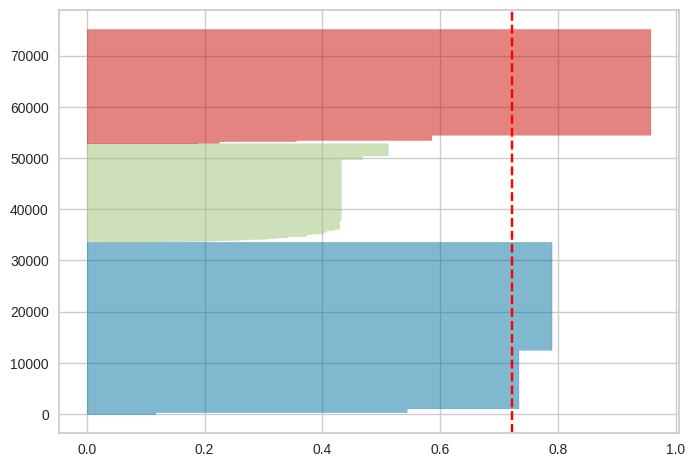

In [102]:
from yellowbrick.cluster import SilhouetteVisualizer
model = KMeans(n_clusters=3,random_state=0)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(x_norm)
plt.show()

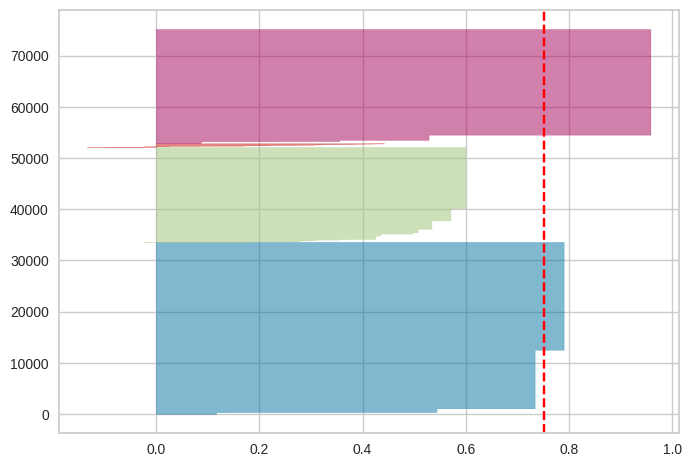

In [103]:
from yellowbrick.cluster import SilhouetteVisualizer
model = KMeans(n_clusters=4,random_state=0)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(x_norm)
plt.show()

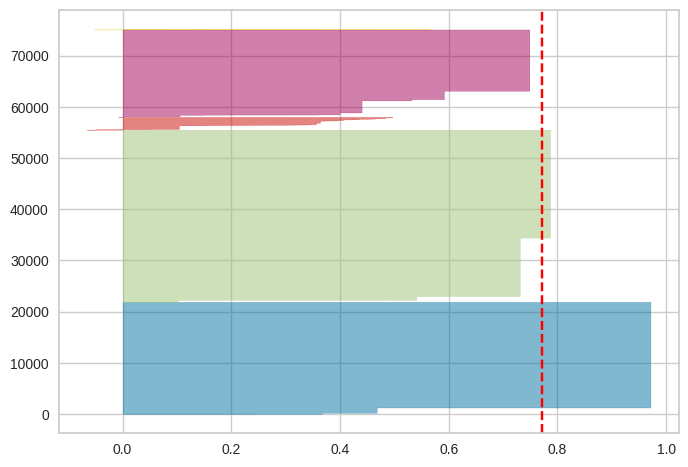

In [104]:
from yellowbrick.cluster import SilhouetteVisualizer
model = KMeans(n_clusters=5,random_state=0)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(x_norm)
plt.show()

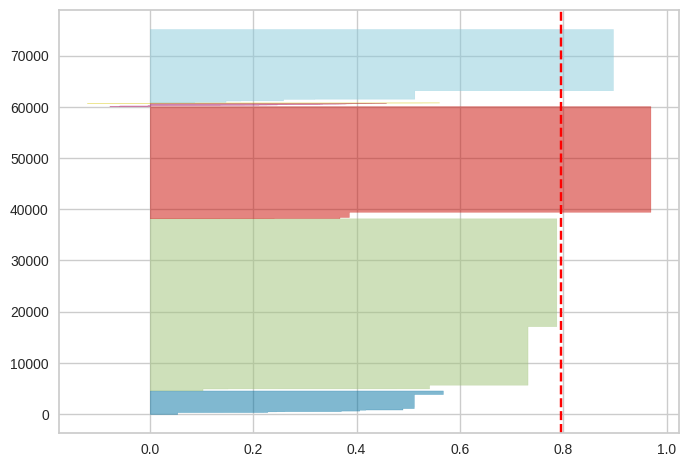

In [105]:
from yellowbrick.cluster import SilhouetteVisualizer
model = KMeans(n_clusters=6,random_state=0)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(x_norm)
plt.show()

*Conclusión*: Teniendo en cuenta los valores del SilhouetteScore lo ideal es tomar 4 clusters ya que los valores son 0.6842666962233828 para 3 clusters y 0.7648253178972201 para 4. Sin embargo al ver los SilhouetteVisualizer se observa que es mejor utilizar 3 cluster ya que al utilizar 4 uno de estos tiene un tamaño muchismo menor al resto y tiene mayor presencia de outliers. Como en el punto 2)f) se pide hacer el análisis con 3 clusters usaremos 4 para este primer análisis , y asi podremos luego compararlos y sacar conclusiones.

## d) Analizar los grupos formados.

Tomamos como ejemplo armar cuatro clusters, más adelante analizaremos lo que sucede si elegimos tres.

In [106]:
data_with_clusters['cluster'].unique()

array([3, 1, 0, 2], dtype=int32)

In [107]:
df = reparado.copy()

In [108]:
df['cluster'] = data_with_clusters['cluster']

In [109]:
df[df['cluster'] == 3]['zone'].unique()

array(['Monte Castro', 'Belgrano', 'Villa del Parque', 'Boedo',
       'Parque Patricios', 'Floresta', 'Palermo', 'Colegiales',
       'Caballito', 'Flores', 'Nuñez', 'Almagro', 'Villa Crespo',
       'Villa Luro', 'Villa Pueyrredón', 'Liniers', 'Recoleta',
       'Mataderos', 'Villa Urquiza', 'Puerto Madero', 'San Cristobal',
       'Balvanera', 'Congreso', 'Coghlan', 'Barracas', 'Velez Sarsfield',
       'Villa Devoto', 'Parque Avellaneda', 'Boca', 'Villa Santa Rita',
       'Barrio Norte', 'Palermo Chico', 'Retiro', 'Monserrat',
       'Parque Centenario', 'San Telmo', 'Saavedra', 'Parque Chas',
       'Parque Chacabuco', 'Constitución', 'San Nicolás', 'Paternal',
       'Villa Ortuzar', 'Palermo Hollywood', 'Villa General Mitre',
       'Chacarita', 'Palermo Soho', 'Pompeya', 'Once', 'Villa Lugano',
       'Versalles', 'Palermo Viejo', 'Abasto', 'Las Cañitas',
       'Tribunales', 'Agronomía', 'Villa Real', 'Villa Soldati',
       'Centro / Microcentro', 'Catalinas', 'Villa Riachue

Verificando los barrios de las propiedades que pertenecen dentro del cluster 3, no encontramos que tenga una relacion directa con la formación del mismo.

In [110]:
df.groupby(['cluster','property_type'])['operation'].count()

cluster  property_type
0        Casa              2370
         Departamento     13365
         PH                2708
1        Casa                59
         Departamento     32077
         PH                1477
2        Casa               454
         Departamento       312
         PH                 138
3        Casa               407
         Departamento     18727
         PH                3062
Name: operation, dtype: int64

Todos los grupos poseen propiedades de diferentes tipos. No parece ser la razón por para agruparlos y no se mantiene una relación entre los grupos con respecto a la cantidad de propiedades de cada tipo.

In [111]:
aux = df.groupby(['cluster', 'property_rooms','property_bedrooms'])['property_type'].count().reset_index()

In [112]:
aux[aux['cluster'] == 0]

,cluster,property_rooms,property_bedrooms,property_type
0,0,1.0,5.0,1
1,0,2.0,4.0,1
2,0,3.0,4.0,40
3,0,3.0,5.0,2
4,0,3.0,6.0,1
5,0,3.0,7.0,1
6,0,4.0,3.0,11959
7,0,4.0,4.0,241
8,0,4.0,5.0,11
9,0,4.0,6.0,9


In [113]:
aux[aux['cluster'] == 1]

,cluster,property_rooms,property_bedrooms,property_type
31,1,0.0,0.0,2
32,1,0.0,2.0,1
33,1,1.0,0.0,727
34,1,1.0,1.0,11430
35,1,1.0,2.0,20
36,1,2.0,1.0,21062
37,1,3.0,1.0,371


In [114]:
aux[aux['cluster'] == 2]

,cluster,property_rooms,property_bedrooms,property_type
38,2,1.0,11.0,1
39,2,2.0,10.0,1
40,2,5.0,7.0,1
41,2,5.0,8.0,1
42,2,6.0,6.0,19
...,...,...,...,...
155,2,30.0,10.0,4
156,2,30.0,20.0,1
157,2,35.0,23.0,1
158,2,36.0,18.0,2


A pesar de que tomamos la relación entre bedrooms y rooms, no notamos en los datos una relación fuerte, adjuntamos el gráfico realizado para visualizarlo con mayor claridad.

<Figure size 1200x800 with 0 Axes>

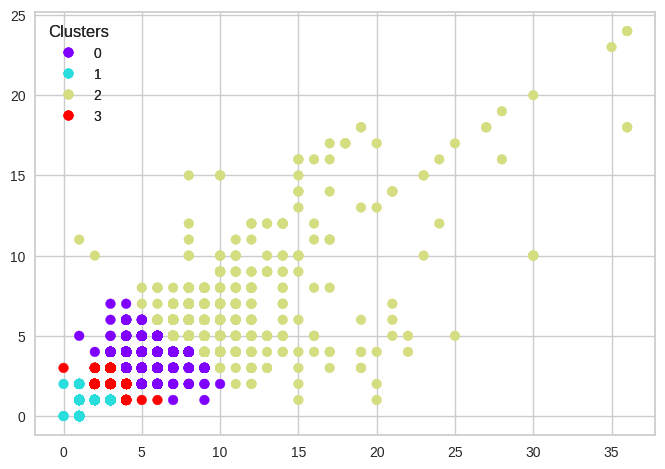

In [115]:
plt.figure(figsize=(12,8))

fig, ax = plt.subplots()
scatter = plt.scatter(data_with_clusters["property_rooms"], data_with_clusters["property_bedrooms"], c=data_with_clusters["cluster"], cmap='rainbow')

# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(),
                    loc="upper left", title="Clusters")
ax.add_artist(legend1)


plt.show()

Gráficamente podemos notar que tiene más sentido que fueran agrupados, finalmente, según la relación de cantidad de habitaciones y ambientes. Podemos notar que el grupo 2 posee más catidad de propiedades que el resto, siendo el más chico el 1, tiene sentido por lo analizado por Silhouette en el punto anterior para un grupo de cuatro.

<Axes: xlabel='cluster', ylabel='property_bedrooms'>

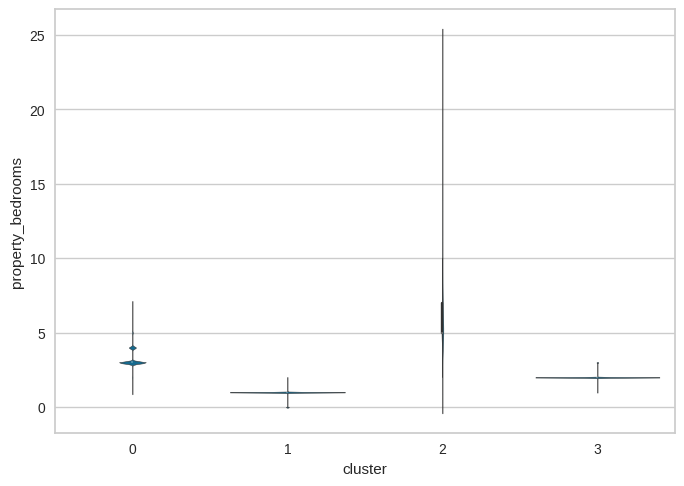

In [116]:
sns.violinplot(data=df, x="cluster", y="property_bedrooms")

Al graficar un violin plot podemos notar que, al tener todavía outliers que decidimos no eliminar, el gráfico no nos aporta mucha información. Tan solo para verlo con mayor claridad, eliminamos el outlier en el cluster 2.

In [117]:
aux=df[df['property_bedrooms'] < 8]

<Axes: xlabel='cluster', ylabel='property_bedrooms'>

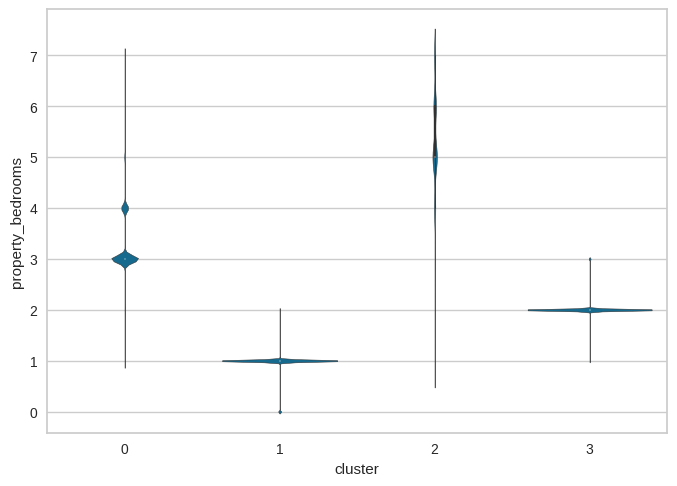

In [118]:
sns.violinplot(data= aux, x="cluster", y="property_bedrooms")

El violin plot nos indica la densidad de registros en cada cluster según la cantidad de habitaciones, en este caso. Podemos ver que el cluster 1 reune más registros de propiedades con una sola habitación, mientras que el 0 de propiedades entre 3 y 2 habitaciones y, el último cluster 2, a pesar de que también parece tener registros de tres habitaciones, reune a los que poseen más de 3 habitaciones.

<Axes: xlabel='cluster', ylabel='property_rooms'>

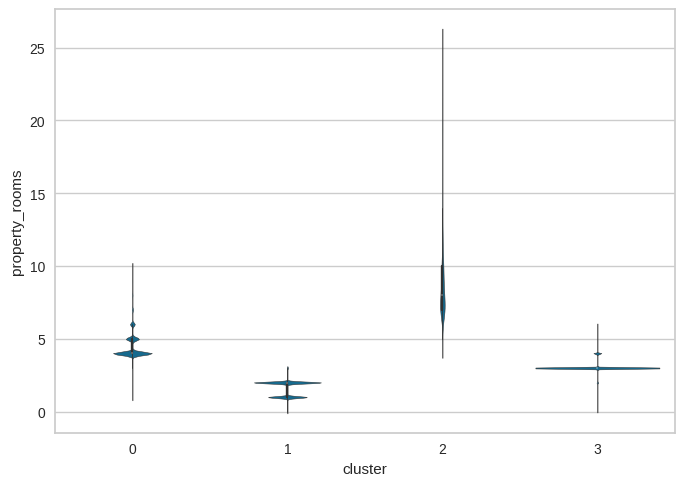

In [119]:
sns.violinplot(data=aux, x="cluster", y="property_rooms")

Para una visualización mejor volvemos a quitar el outlier en el gráfico.

<Axes: xlabel='cluster', ylabel='property_rooms'>

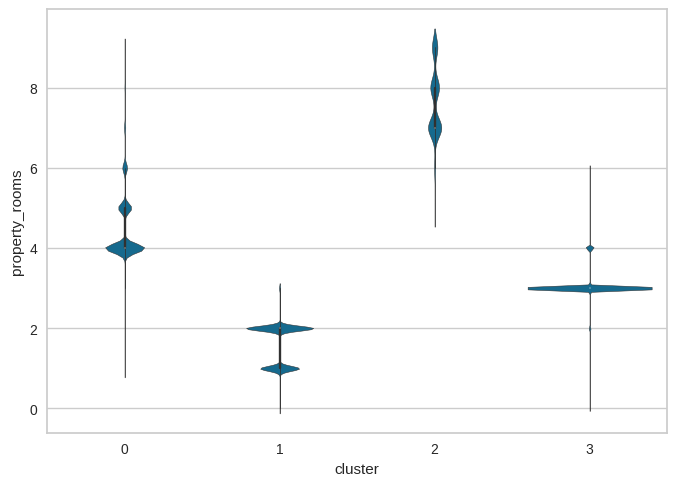

In [120]:
sns.violinplot(data= aux[aux['property_rooms'] < 10], x="cluster", y="property_rooms")

Vemos que para el caso de los ambientes sigue teniendo relación la división de clusters. Las propiedades con menor cantidad de ambientes están agrupados en 1, de 3 a 5 en el cluster 0 y, por último, los que poseen más en el cluster 2.

## e) Graficar sobre un mapa de CABA los avisos coloreados según el grupo al que pertenecen.

In [121]:
data_with_clusters = data_with_clusters[data_with_clusters["latitud"]>-34.69]
data_with_clusters = data_with_clusters[data_with_clusters["latitud"]<-34.525]


data_with_clusters = data_with_clusters[data_with_clusters["longitud"]>-58.53]
data_with_clusters = data_with_clusters[data_with_clusters["longitud"]<-58.34]

In [122]:
caba_gdf = gpd.read_file("comunas_wgs84.shp")

In [123]:
data_with_clusters

,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,mahalanobis,cluster
285884,-34.621390,-58.506366,3.0,2.0,51.0,44.0,112000.0,0.134248,3
120762,-34.563005,-58.453674,3.0,2.0,79.0,66.0,299900.0,0.062156,3
419659,-34.612349,-58.491906,3.0,2.0,110.0,80.0,249000.0,0.006317,3
21443,-34.620806,-58.397336,3.0,2.0,97.0,67.0,135000.0,0.084562,3
103677,-34.558229,-58.446708,3.0,2.0,89.0,89.0,300000.0,0.061451,3
...,...,...,...,...,...,...,...,...,...
30514,-34.569953,-58.488393,3.0,2.0,100.0,75.0,199000.0,0.006920,3
268902,-34.555575,-58.438803,3.0,2.0,91.0,81.0,333000.0,0.125829,3
379634,-34.638700,-58.374163,1.0,1.0,43.0,36.0,99800.0,0.165003,1
4766,-34.607558,-58.421838,2.0,1.0,34.0,34.0,76120.0,0.233266,1


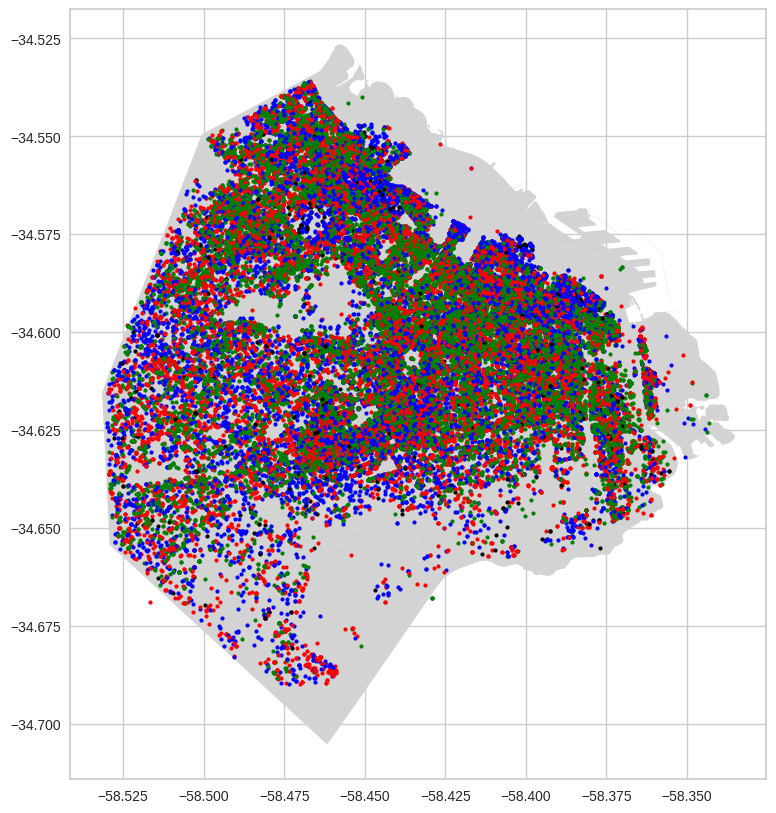

In [124]:
fig, ax = plt.subplots(figsize=(10, 10))
caba_gdf.plot(ax=ax, color='lightgray')

for i in range(0,data_with_clusters.shape[0]):
  prop = data_with_clusters.iloc[i]
  lon = prop['longitud']
  lat = prop['latitud']
  col = 'red'
  if prop['cluster'] == 0:
    col = 'blue'
  if prop['cluster'] == 1:
    col = 'green'
  if prop['cluster'] == 2:
    col = 'black'

  plt.plot(lon,lat, marker="o", color=col, markersize=3)


### 2f) Realizar nuevamente el análisis utilizando solamente 3 grupos.

In [125]:
kmeans = KMeans(n_clusters=3)

kmeans.fit(x_norm)
identified_clusters = kmeans.fit_predict(x_norm)

data_with_clusters = df_clust.copy()
data_with_clusters['cluster'] = identified_clusters

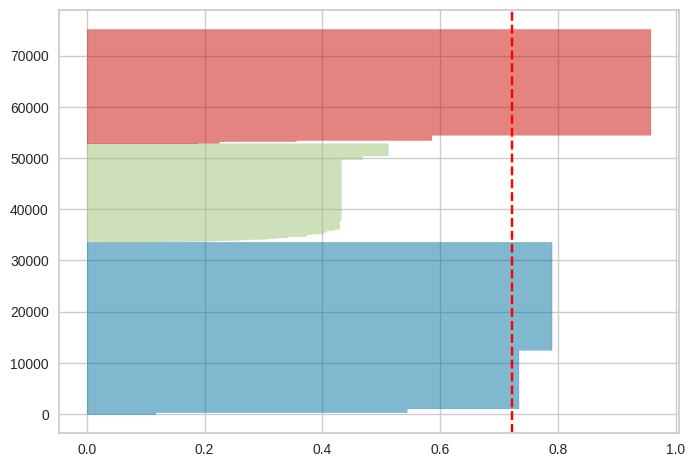

In [126]:
from yellowbrick.cluster import SilhouetteVisualizer
model = KMeans(n_clusters=3,random_state=0)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(x_norm)
plt.show()

El tamaño de los clusters son similares para los tres grupos, al menos resulta mucho mejor que los analizados con otras cantidades de grupos. El agrupamiento igual sigue siendo malo ya que el grupo verde no llega a pasar la puntuación media de la silueta y nos indica que estas instancias están demasiado cerca de otros grupos.

<Figure size 1200x800 with 0 Axes>

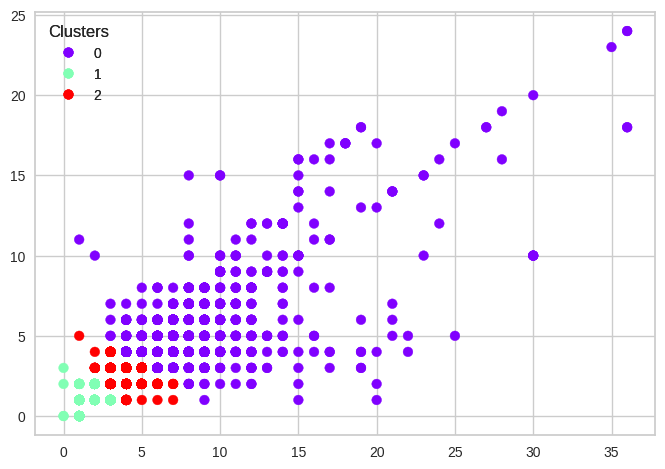

In [127]:
plt.figure(figsize=(12,8))

fig, ax = plt.subplots()
scatter = plt.scatter(data_with_clusters["property_rooms"], data_with_clusters["property_bedrooms"], c=data_with_clusters["cluster"], cmap='rainbow')

# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(),
                    loc="upper left", title="Clusters")
ax.add_artist(legend1)


plt.show()

Se puede apreciar que el grupo 2 sigue teniendo un mayor volumen de registros que los otros grupos y visualmente agrupa los registros de propiedades con más habitaciones.

In [128]:
df = reparado.copy()
df['cluster'] = data_with_clusters['cluster']

In [129]:
df.groupby(['cluster', 'property_type'])['zone'].count()

cluster  property_type
0        Casa              1642
         Departamento      3058
         PH                 852
1        Casa                61
         Departamento     32263
         PH                1501
2        Casa              1587
         Departamento     29160
         PH                5032
Name: zone, dtype: int64

No parece tener una relación clara el tipo de propiedad con los agrupamientos, pero en los tres grupos la cantidad de departamentos es mucho mayor que el resto.

In [130]:
data_with_clusters = data_with_clusters[data_with_clusters["latitud"]>-34.69]
data_with_clusters = data_with_clusters[data_with_clusters["latitud"]<-34.525]


data_with_clusters = data_with_clusters[data_with_clusters["longitud"]>-58.53]
data_with_clusters = data_with_clusters[data_with_clusters["longitud"]<-58.34]

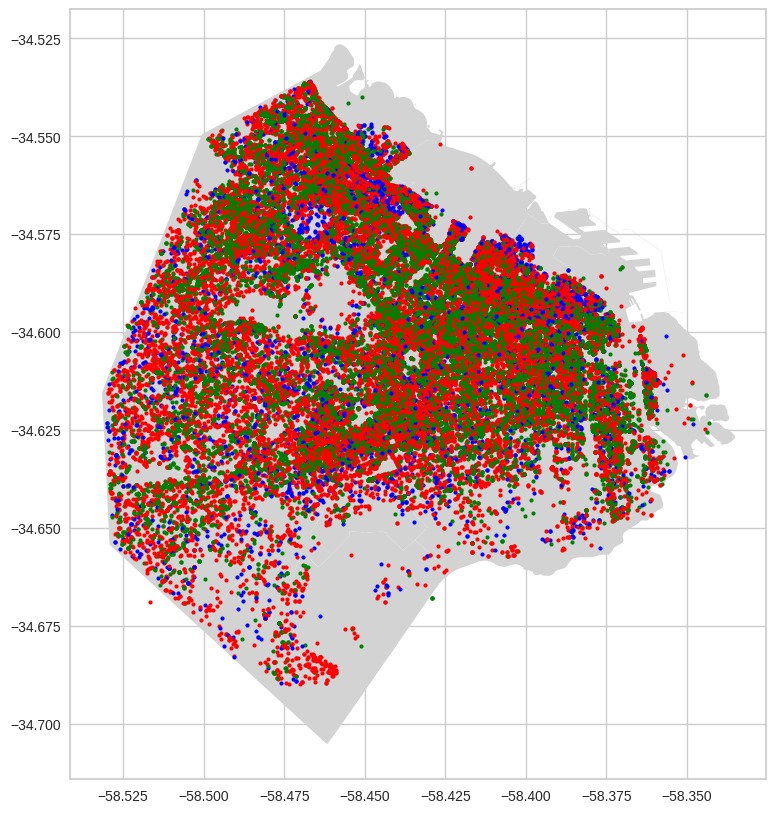

In [131]:
fig, ax = plt.subplots(figsize=(10, 10))
caba_gdf.plot(ax=ax, color='lightgray')

for i in range(0,data_with_clusters.shape[0]):
  prop = data_with_clusters.iloc[i]
  lon = prop['longitud']
  lat = prop['latitud']
  col = 'red'
  if prop['cluster'] == 0:
    col = 'blue'
  if prop['cluster'] == 1:
    col = 'green'

  plt.plot(lon,lat, marker="o", color=col, markersize=3)


Observando el mapa tampoco vemos una distinción clara de los agrupamientos según su dirección en el mapa, salvo que el grupo 1, los puntos verdes, no se encuentran concentrados en el sector sur de la ciudad.

Al igual que en el punto anterior visualizamos en un violin plot la densidad de registros en cada cluster según cantidad de habitaciones y ambientes. Al tener outliers que decidimos no eliminar, para la visualización decidimos cortarlos para poder analizar el gráfico con más claridad en ambos casos.

<Axes: xlabel='cluster', ylabel='property_bedrooms'>

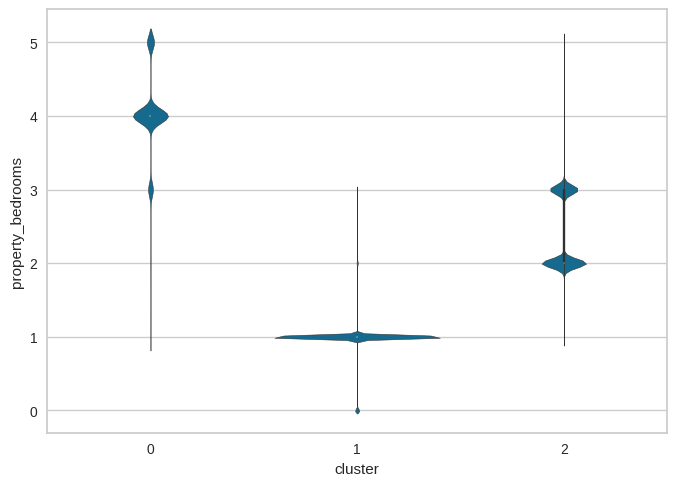

In [132]:
sns.violinplot(data= df[df['property_bedrooms'] < 6], x="cluster", y="property_bedrooms")

En este último gráfico podemos observar que, nuevamente, el cluster 1 agrupa las propiedades con menos habitaciones, y el 2 con más. También encontramos propiedades con 4 habitaciones, por ejemplo, dentro del grupo 1 como también del 2.

<Axes: xlabel='cluster', ylabel='property_rooms'>

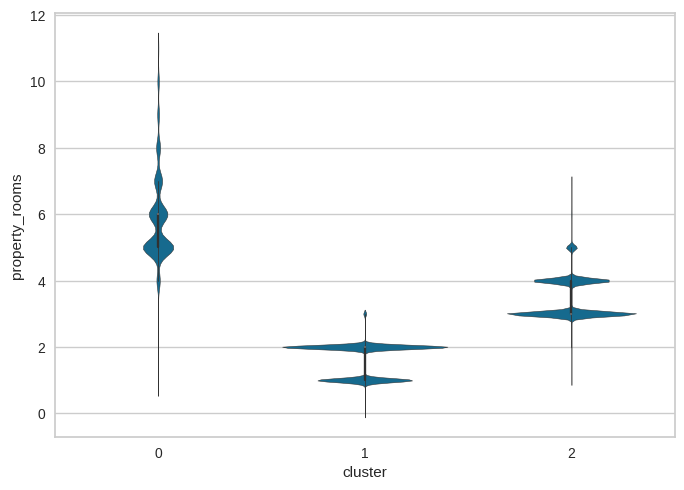

In [133]:
sns.violinplot(data= df[df['property_rooms'] < 12], x="cluster", y="property_rooms")

El análisis anterior es similar al de ambientes. El grupo 0 contiene propiedades con pocos ambientes y el 2 con más, observando también que podemos encontrar propiedades con 3 ambientes, por ejemplo, en el grupo 4, en menor medida, y en el grupo 1 también.

# **3. Clasificación**

## **a) Construcción del target**

Primero agregamos la columna "pxm2" y por cada propiedad calculamos su valor.

In [134]:
reparado.drop(['mahalanobis'], axis=1, inplace=True)

In [135]:
reparado.insert(12, "pxm2", "NaN", allow_duplicates=False)

In [136]:
for i in range (0,reparado.shape[0]):
  fila = reparado.iloc[i]
  precio = fila["property_price"]
  sup_tot = fila["property_surface_total"]
  pxm2 = precio/sup_tot
  reparado.iat[i, 12] = pxm2

Ahora tenemos la columna pxm2:

In [137]:
reparado = reparado[reparado['pxm2']<25000] #Elimino outliers
reparado

,latitud,longitud,city,zone,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,pxm2
285884,-34.621390,-58.506366,Capital Federal,Monte Castro,Venta,Departamento,3.0,2.0,51.0,44.0,112000.0,Venta tres ambientes chico cochera y amplio ba...,2196.078431
120762,-34.563005,-58.453674,Capital Federal,Belgrano,Venta,Departamento,3.0,2.0,79.0,66.0,299900.0,VENTA DEPARTAMENTO 3 AMB COCHERA BELGRANO,3796.202532
419659,-34.612349,-58.491906,Capital Federal,Villa del Parque,Venta,Departamento,3.0,2.0,110.0,80.0,249000.0,VENTA | DEPARTAMENTO |3 AMBIENTES | V. DEL PARQUE,2263.636364
21443,-34.620806,-58.397336,Capital Federal,Boedo,Venta,PH,3.0,2.0,97.0,67.0,135000.0,Casa - Boedo,1391.752577
103677,-34.558229,-58.446708,Capital Federal,Belgrano,Venta,Departamento,3.0,2.0,89.0,89.0,300000.0,Departamento - Belgrano,3370.786517
...,...,...,...,...,...,...,...,...,...,...,...,...,...
30514,-34.569953,-58.488393,Capital Federal,Villa Urquiza,Venta,Departamento,3.0,2.0,100.0,75.0,199000.0,DEPARTAMENTO 3 AMBIENTES - VILLA URQUIZA,1990.0
268902,-34.555575,-58.438803,Capital Federal,Belgrano,Venta,Departamento,3.0,2.0,91.0,81.0,333000.0,Adelanto y 12 cuotas en pesos - Belgrano,3659.340659
379634,-34.638700,-58.374163,Capital Federal,Barracas,Venta,Departamento,1.0,1.0,43.0,36.0,99800.0,Departamento premium - mejor zona de Barracas,2320.930233
4766,-34.607558,-58.421838,Capital Federal,Almagro,Venta,Departamento,2.0,1.0,34.0,34.0,76120.0,Departamento - Almagro,2238.823529


Primero divido en igual cantidad de observaciones:

In [138]:
alt_1 = reparado.copy()

cuantiles = alt_1['pxm2'].quantile([0.33, 0.66])

alt_1['tipo_precio'] = pd.cut(alt_1['pxm2'], bins=[float('-inf'), cuantiles.iloc[0], cuantiles.iloc[1], float('inf')], labels=['bajo', 'medio', 'alto'])

cant_tipos = alt_1['tipo_precio'].value_counts()
elem_por_categoria = cant_tipos.min()
alt_1 = alt_1.groupby('tipo_precio').apply(lambda x: x.sample(elem_por_categoria)).reset_index(drop=True)

alt_1['tipo_precio'].value_counts()


tipo_precio
bajo     24769
medio    24769
alto     24769
Name: count, dtype: int64

Luego la 2da alternativa:

In [139]:
alt_2 = reparado.copy()
percentiles = [0, 0.25, 0.75, 1]
labels = ['bajo', 'medio', 'alto']
alt_2["tipo_precio"] = pd.cut(alt_2["pxm2"], bins=alt_2["pxm2"].quantile(percentiles), labels=labels)
alt_2['tipo_precio'].value_counts()

tipo_precio
medio    37584
bajo     18788
alto     18780
Name: count, dtype: int64

Para la 3er alternativa hay que volver a calcular el pxm2 para poder dividir por el tipo de propiedad:

Para esta alternativa voy a dividirlo en 2:

*   alt_3_dptos
*   alt_3_ph



In [140]:
alt_3_dptos = reparado[reparado.copy()['property_type']=='Departamento']

percentiles = [0, 0.25, 0.75, 1]

labels = ['bajo', 'medio', 'alto']
alt_3_dptos["tipo_precio"] = pd.cut(alt_3_dptos["pxm2"], bins=alt_3_dptos["pxm2"].quantile(percentiles), labels=labels)
print('alt_3_dptos:')
alt_3_dptos['tipo_precio'].value_counts()



alt_3_dptos:


<ipython-input-140-d4a86b60470a>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  alt_3_dptos["tipo_precio"] = pd.cut(alt_3_dptos["pxm2"], bins=alt_3_dptos["pxm2"].quantile(percentiles), labels=labels)


tipo_precio
medio    32248
bajo     16114
alto     16111
Name: count, dtype: int64

In [141]:
alt_3_ph = reparado[reparado.copy()['property_type']=='PH']

labels = ['bajo', 'medio', 'alto']
alt_3_ph["tipo_precio"] = pd.cut(alt_3_ph["pxm2"], bins=alt_3_ph["pxm2"].quantile(percentiles), labels=labels)
print('alt_3_PH:')
alt_3_ph['tipo_precio'].value_counts()

alt_3_PH:


<ipython-input-141-d5645a40d04a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  alt_3_ph["tipo_precio"] = pd.cut(alt_3_ph["pxm2"], bins=alt_3_ph["pxm2"].quantile(percentiles), labels=labels)


tipo_precio
medio    3692
bajo     1846
alto     1846
Name: count, dtype: int64

a. Mostrar la distribución del precio por metro cuadrado

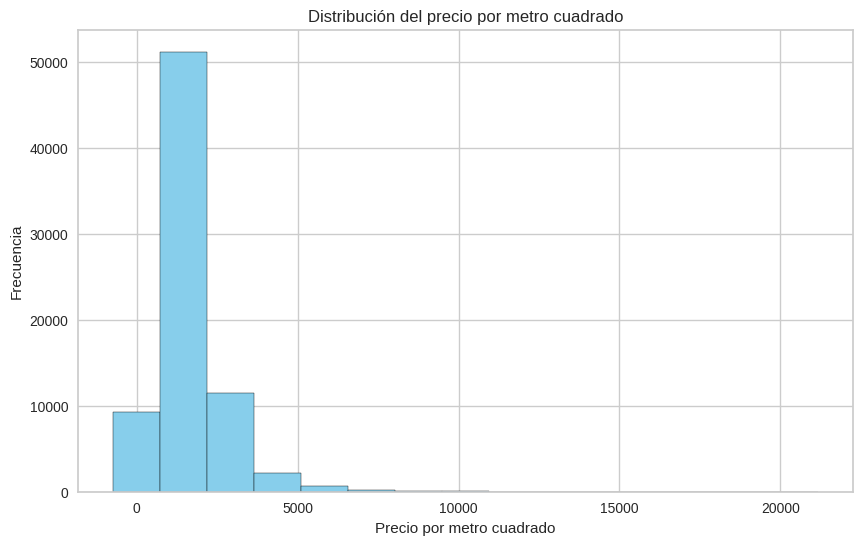

In [142]:
import numpy as np
import matplotlib.pyplot as plt

num_intervalos = 15

intervalos = np.linspace(reparado['pxm2'].min(), reparado['pxm2'].max(), num_intervalos+1)
frecuencia_por_intervalo, _ = np.histogram(reparado['pxm2'], bins=intervalos)

plt.figure(figsize=(10, 6))
plt.bar(intervalos[:-1], frecuencia_por_intervalo, width=np.diff(intervalos), color='skyblue', edgecolor='black')
plt.title('Distribución del precio por metro cuadrado')
plt.xlabel('Precio por metro cuadrado')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

Podemos ver que la mayoria de las propiedades tienen un pxm2 de aproximadamente 2000 a 3000 dolares

b. Mostrar la distribución del precio por metro cuadrado por tipo de propiedad

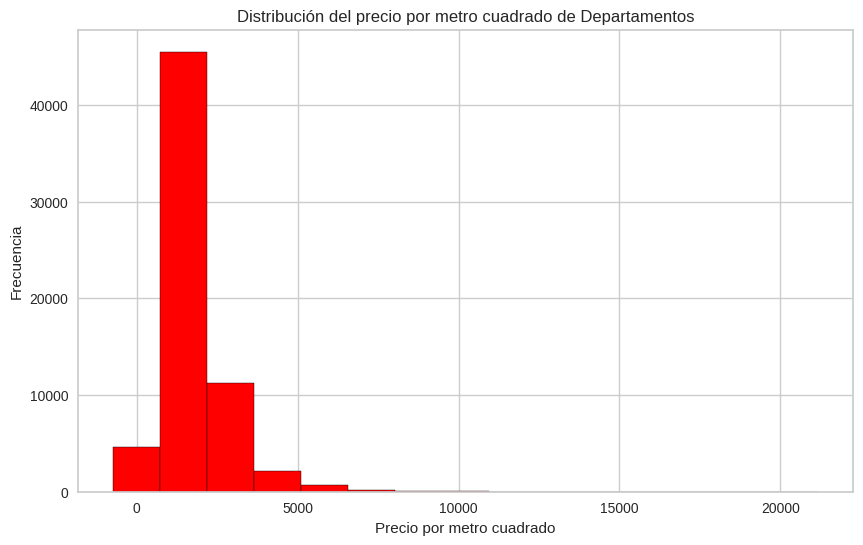

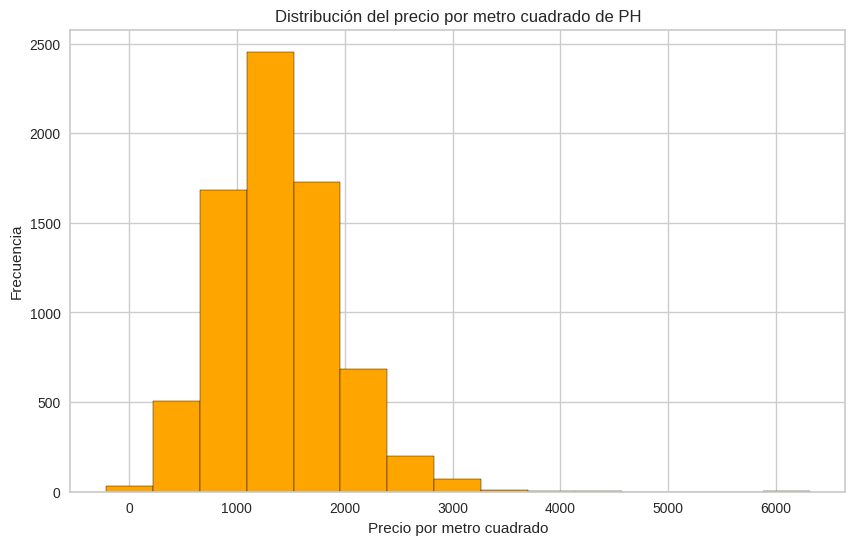

In [143]:
departamentos = reparado.copy()
departamentos = departamentos[departamentos["property_type"]=="Departamento"]
num_intervalos = 15

intervalos = np.linspace(departamentos['pxm2'].min(), departamentos['pxm2'].max(), num_intervalos+1)
frecuencia_por_intervalo, _ = np.histogram(departamentos['pxm2'], bins=intervalos)

plt.figure(figsize=(10, 6))
plt.bar(intervalos[:-1], frecuencia_por_intervalo, width=np.diff(intervalos), color='red', edgecolor='black')
plt.title('Distribución del precio por metro cuadrado de Departamentos')
plt.xlabel('Precio por metro cuadrado')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

ph = reparado.copy()
ph = ph[ph["property_type"]=="PH"]
num_intervalos = 15

intervalos = np.linspace(ph['pxm2'].min(), ph['pxm2'].max(), num_intervalos+1)
frecuencia_por_intervalo, _ = np.histogram(ph['pxm2'], bins=intervalos)

plt.figure(figsize=(10, 6))
plt.bar(intervalos[:-1], frecuencia_por_intervalo, width=np.diff(intervalos), color='orange', edgecolor='black')
plt.title('Distribución del precio por metro cuadrado de PH')
plt.xlabel('Precio por metro cuadrado')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

Lo primero que podemos observar es la diferencia en las frecuencias, esto se debe a que hay menos ph que departamentos y que en el caso de los ph los pxm2 varían más que en el caso de los departamentos. Además se puede observar que el mxp2 de los ph es por lo general más caro que el pxm2 de los departamentos.

c. Para cada una de las tres alternativas mostrar gráficamente la distribución de la
nueva variable creada tipo_precio.

Primero vemos la alternativa 1:

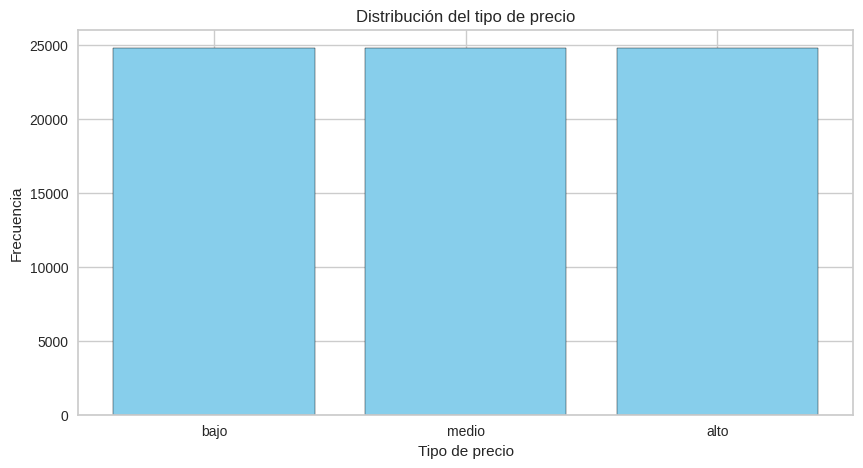

In [144]:
plt.figure(figsize=(10, 5))

frecuencia_por_tipo = alt_1['tipo_precio'].value_counts()

plt.bar(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución del tipo de precio')
plt.xlabel('Tipo de precio')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

Ahora puedo ver la relación entre el tipo de precio y las zonas:  

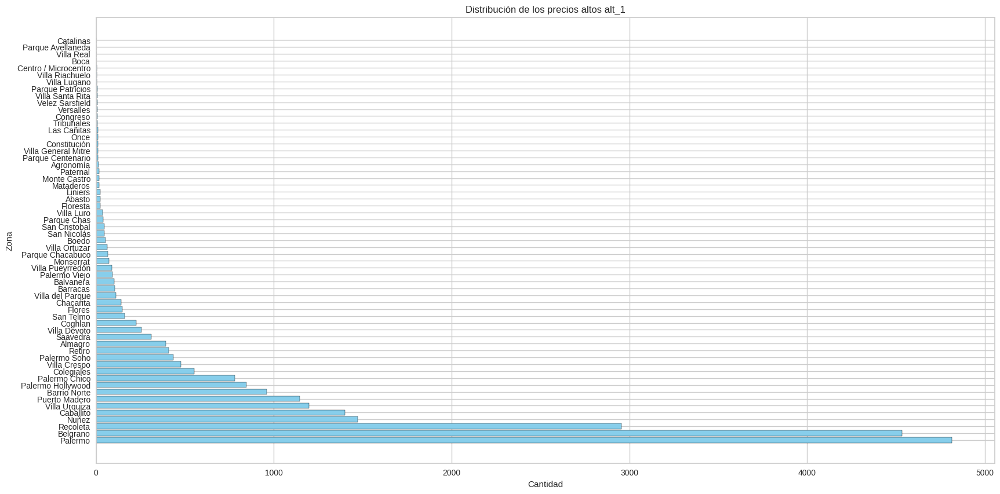

In [145]:
alto = alt_1[alt_1.copy()['tipo_precio']=='alto']


plt.figure(figsize=(20, 10))
frecuencia_por_tipo = alto['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución de los precios altos alt_1')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

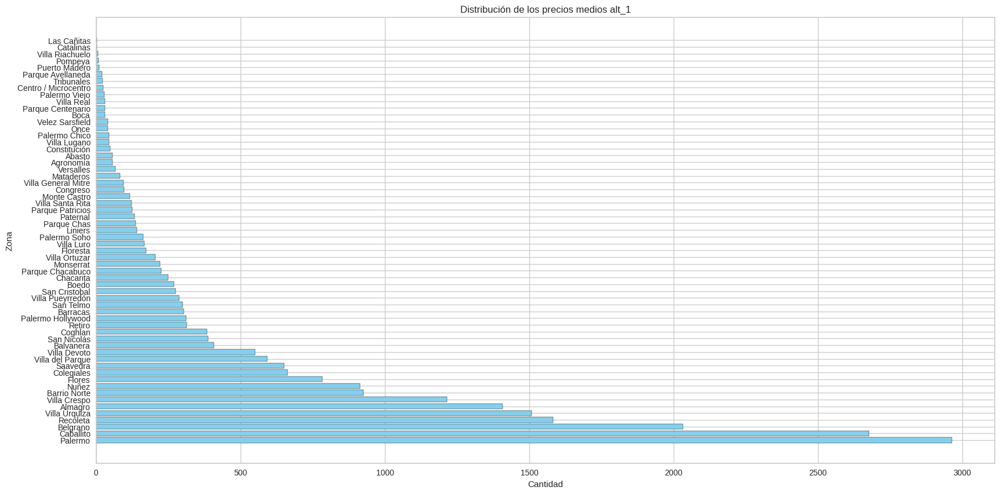

In [146]:
medio = alt_1[alt_1.copy()['tipo_precio']=='medio']

plt.figure(figsize=(20, 10))
frecuencia_por_tipo = medio['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución de los precios medios alt_1')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

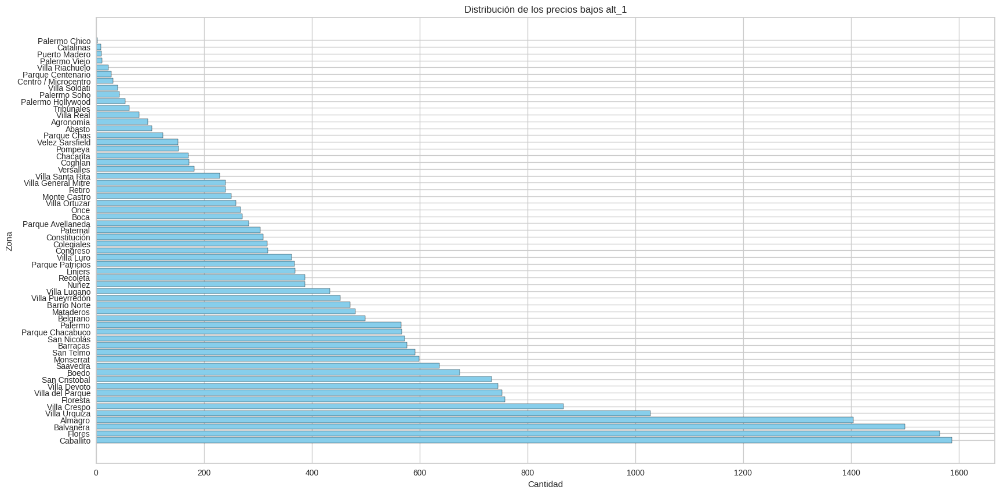

In [147]:
bajo = alt_1[alt_1.copy()['tipo_precio']=='bajo']

plt.figure(figsize=(20, 10))
frecuencia_por_tipo = bajo['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución de los precios bajos alt_1')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

Ahora lo vemos en la alternativa 2:

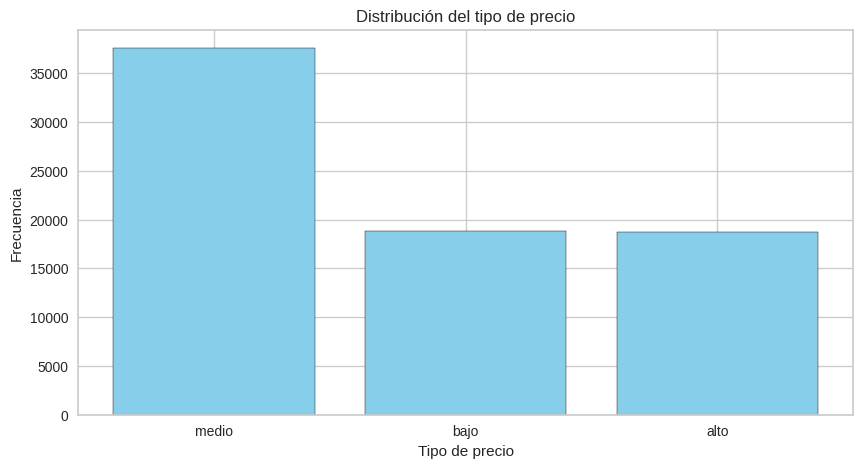

In [148]:
plt.figure(figsize=(10, 5))

frecuencia_por_tipo = alt_2['tipo_precio'].value_counts()

plt.bar(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución del tipo de precio')
plt.xlabel('Tipo de precio')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

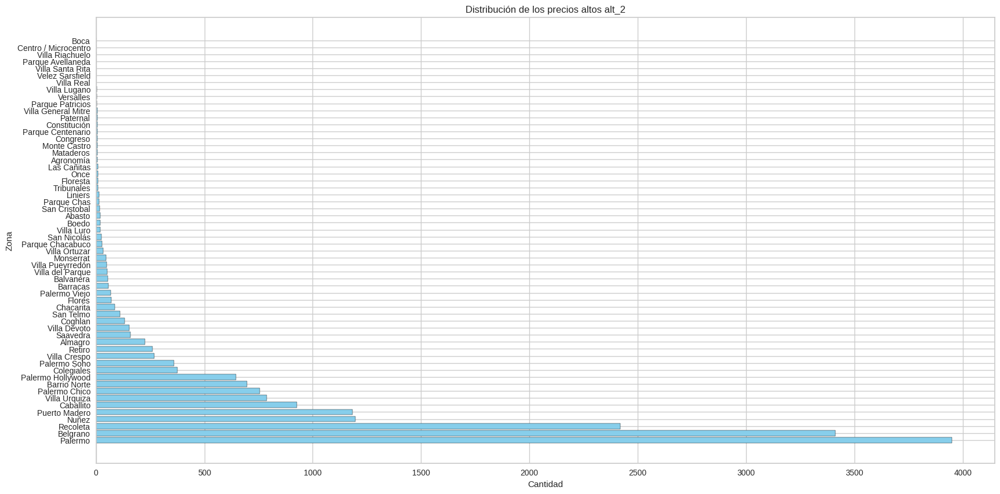

In [149]:
alto = alt_2[alt_2.copy()['tipo_precio']=='alto']


plt.figure(figsize=(20, 10))
frecuencia_por_tipo = alto['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución de los precios altos alt_2')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

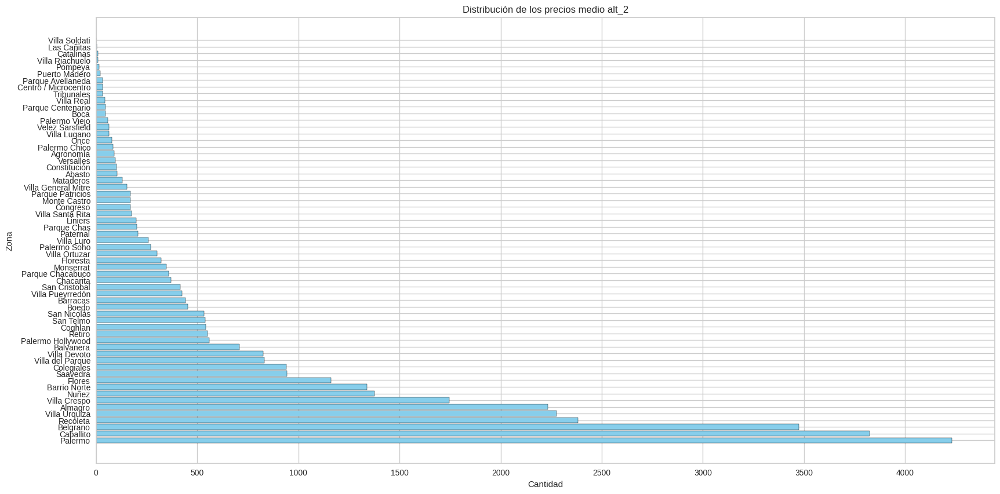

In [150]:
medio = alt_2[alt_2.copy()['tipo_precio']=='medio']


plt.figure(figsize=(20, 10))
frecuencia_por_tipo = medio['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución de los precios medio alt_2')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

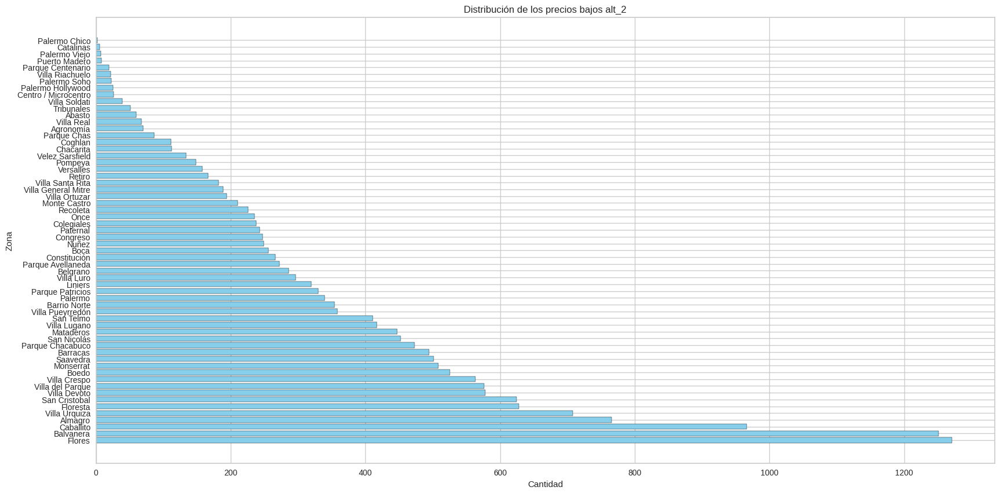

In [151]:
bajo = alt_2[alt_2.copy()['tipo_precio']=='bajo']

plt.figure(figsize=(20, 10))
frecuencia_por_tipo = bajo['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución de los precios bajos alt_2')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

Por último la alternativa_3:

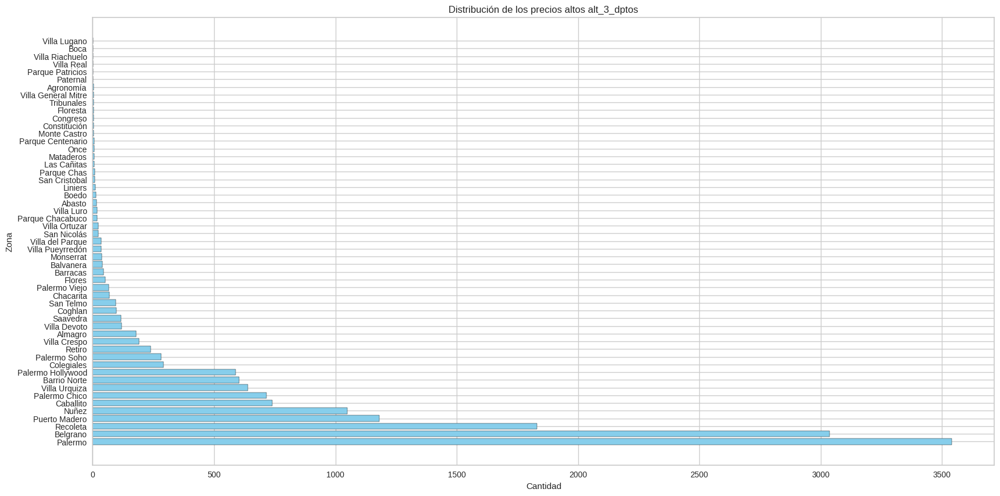

In [152]:
alto = alt_3_dptos[alt_3_dptos.copy()['tipo_precio']=='alto']


plt.figure(figsize=(20, 10))
frecuencia_por_tipo = alto['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución de los precios altos alt_3_dptos')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

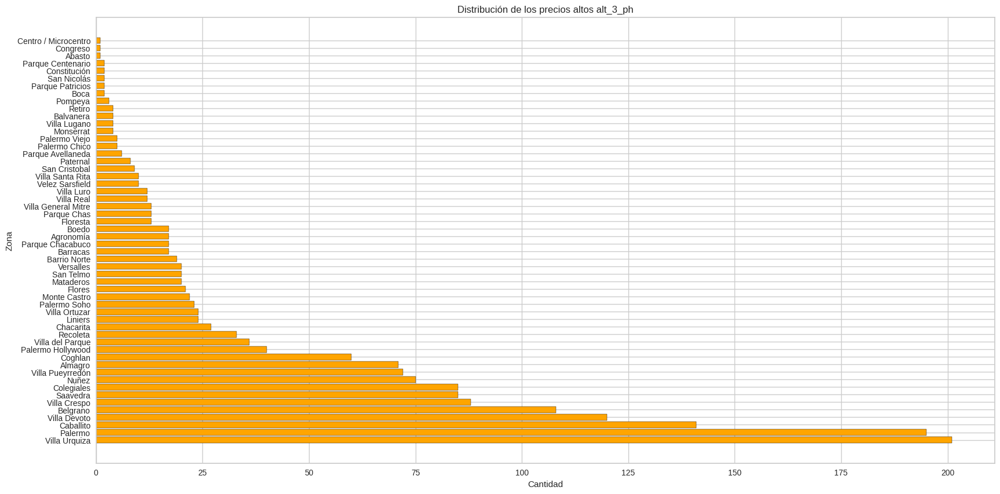

In [153]:
alto = alt_3_ph[alt_3_ph.copy()['tipo_precio']=='alto']


plt.figure(figsize=(20, 10))
frecuencia_por_tipo = alto['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='orange', edgecolor='black')
plt.title('Distribución de los precios altos alt_3_ph')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

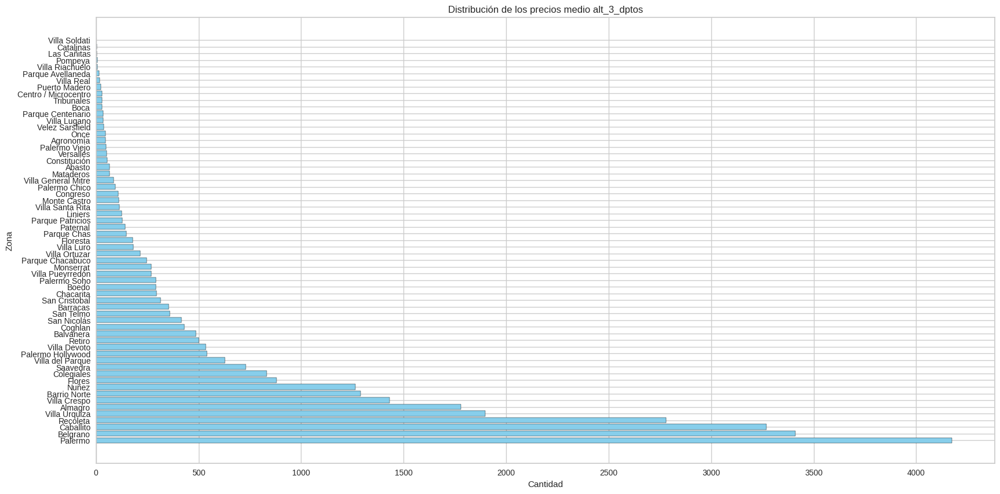

In [154]:
medio = alt_3_dptos[alt_3_dptos.copy()['tipo_precio']=='medio']

plt.figure(figsize=(20, 10))
frecuencia_por_tipo = medio['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución de los precios medio alt_3_dptos')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

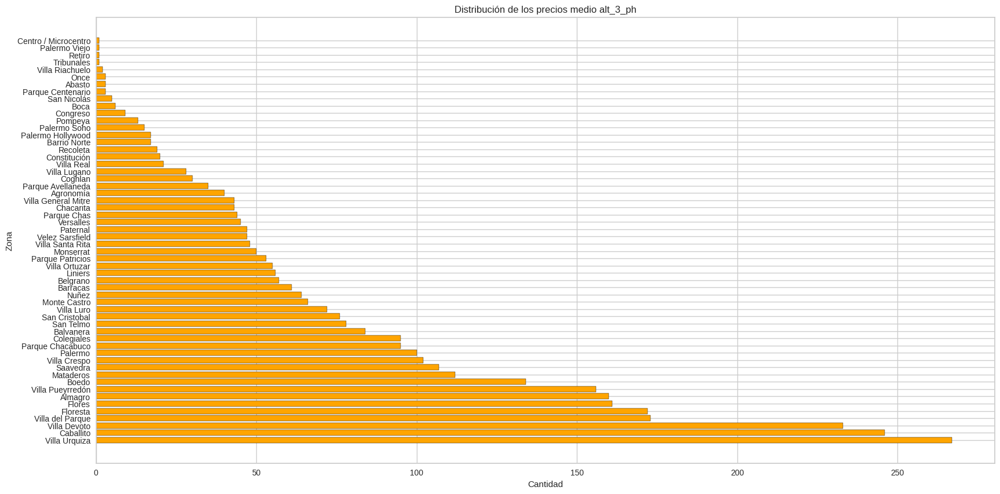

In [155]:
medio = alt_3_ph[alt_3_ph.copy()['tipo_precio']=='medio']

plt.figure(figsize=(20, 10))
frecuencia_por_tipo = medio['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='orange', edgecolor='black')
plt.title('Distribución de los precios medio alt_3_ph')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

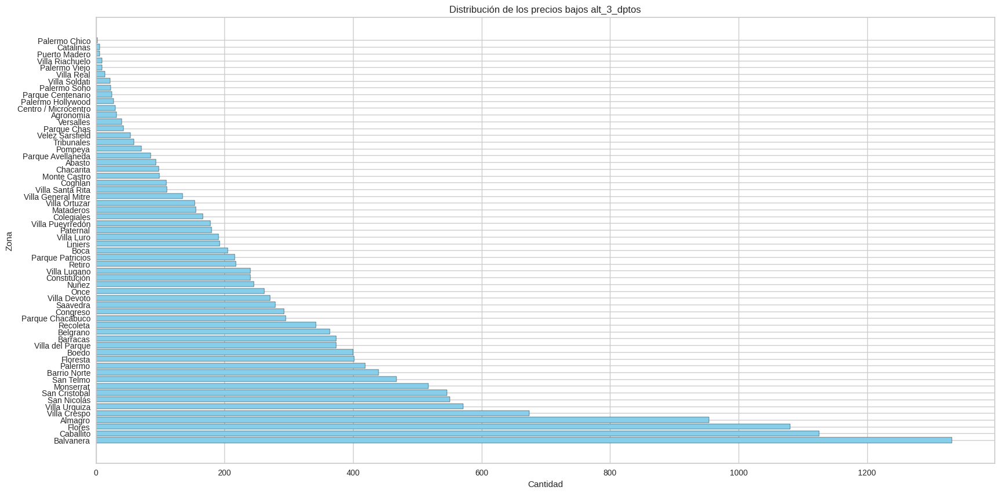

In [156]:
bajo = alt_3_dptos[alt_3_dptos.copy()['tipo_precio']=='bajo']

plt.figure(figsize=(20, 10))
frecuencia_por_tipo = bajo['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='skyblue', edgecolor='black')
plt.title('Distribución de los precios bajos alt_3_dptos')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

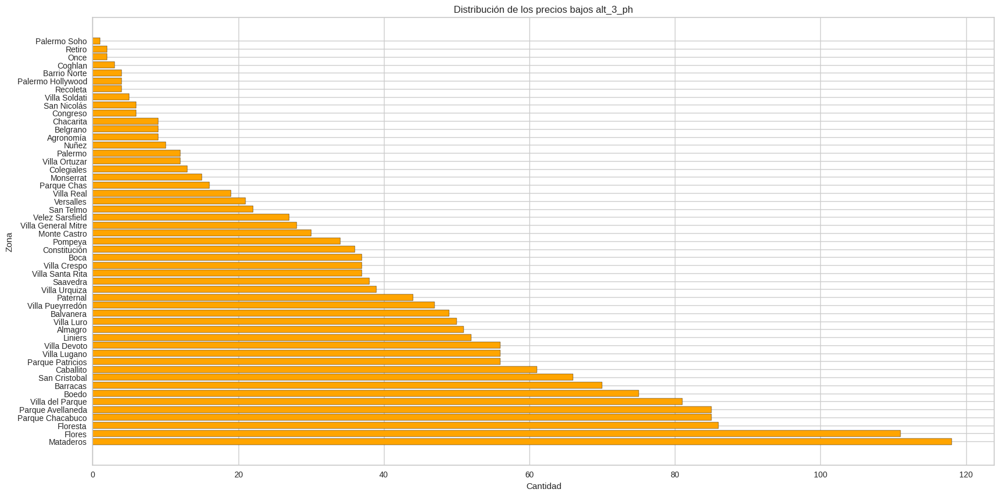

In [157]:
bajo = alt_3_ph[alt_3_ph.copy()['tipo_precio']=='bajo']

plt.figure(figsize=(20, 10))
frecuencia_por_tipo = bajo['zone'].value_counts()
plt.barh(frecuencia_por_tipo.index, frecuencia_por_tipo, color='orange', edgecolor='black')
plt.title('Distribución de los precios bajos alt_3_ph')
plt.xlabel('Cantidad')
plt.ylabel('Zona')
plt.grid(True)
plt.show()

d. Seleccionar una de las alternativas, justificando la misma.

La alternativa elegida es la alternativa 2, una de las razones es que al quedar solo un 25% en bajo y otro en alto, la variacion entre los precios dentro de las categorias es mucho menor que en el caso de la alternariva 1. Esto suena mejor que tener en el mismo grupo valores que tienen diferencias muy grandes entre si.

e. Comparar, si aplica, la alternativa seleccionada con la división en 3 grupos obtenida
utilizando agrupamiento por K Means.

Para hacer la comparacion primero veamos como se distribuyen en el mapa de CABA

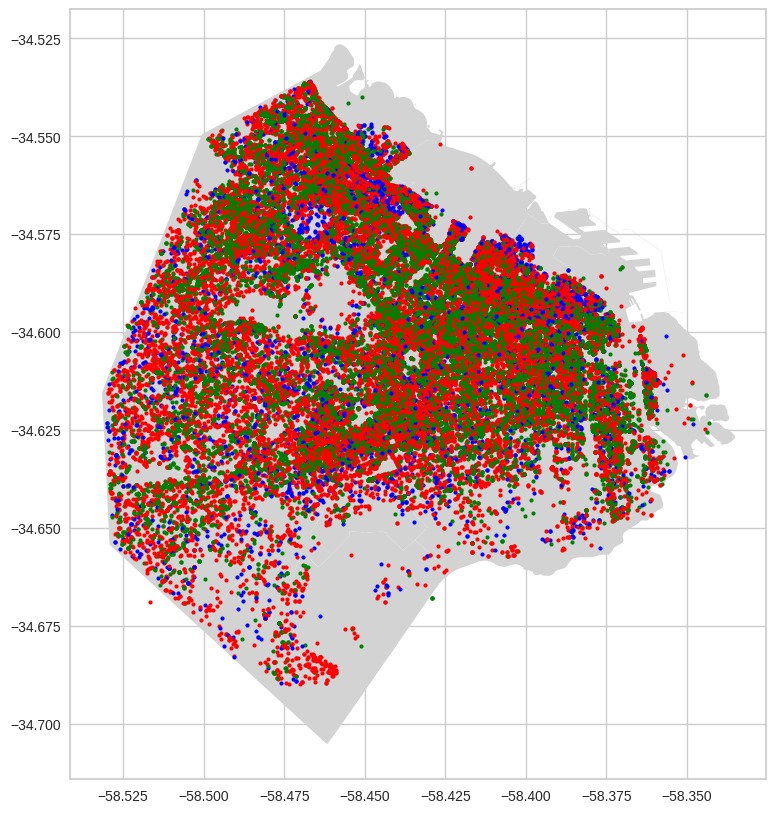

In [158]:
fig, ax = plt.subplots(figsize=(10, 10))
caba_gdf.plot(ax=ax, color='lightgray')

for i in range(0,data_with_clusters.shape[0]):
  prop = data_with_clusters.iloc[i]
  lon = prop['longitud']
  lat = prop['latitud']
  col = 'red'
  if prop['cluster'] == 0:
    col = 'blue'
  if prop['cluster'] == 1:
    col = 'green'

  plt.plot(lon,lat, marker="o", color=col, markersize=3)


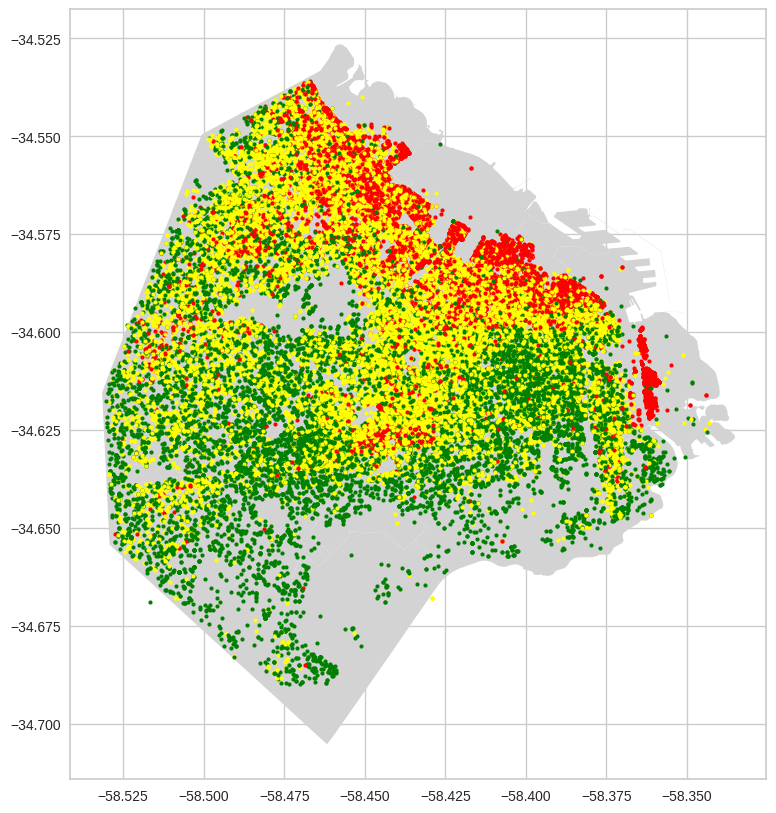

In [159]:
alt_2 = alt_2[alt_2["latitud"]>-34.69]
alt_2 = alt_2[alt_2["latitud"]<-34.525]
alt_2.shape

prob = alt_2[alt_2["longitud"]>-58.53]
prob = prob[prob["longitud"]<-58.34]
import geopandas as gpd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
caba_gdf.plot(ax=ax, color='lightgray')

for i in range(0,alt_2.shape[0]):
  prop = alt_2.iloc[i]
  lon = prop['longitud']
  lat = prop['latitud']
  col = 'red'
  if prop['tipo_precio'] == 'medio':
    col = 'yellow'
  if prop['tipo_precio'] == 'bajo':
    col = 'green'

  plt.plot(lon,lat, marker="o", color=col, markersize=3)


Lo primero que se aprecia es como se distribuyen los clusters, en el target de tipo_precio los precios altos estan en el norte y noreste de la ciudad principalmente, los medios estan por toda la ciudad pero principalmente en el norte, centro y noreste y por ultimo los bajos estan principalmente en el centro y este de la ciudad. En el caso de los 3 clusters de kmeans el cluster 0 (azul) es el mas repetido y esta por toda la ciudad, el verde tambien se distribuye por toda la ciudad pero principalmente en el noreste y este y por último el cluster rojo que es el que menos propiedade tiene y estan distribuidos por toda la ciudad.

Ahora analicemos la distribución de los grupos:

In [160]:
data_with_clusters['cluster'].value_counts()

cluster
2    35656
1    33784
0     5515
Name: count, dtype: int64

In [161]:
alt_2['tipo_precio'].value_counts()

tipo_precio
medio    37544
alto     18779
bajo     18630
Name: count, dtype: int64

Podemos ver que la distribución es muy distinta, en el caso de los tipo_precio se usó la distribución del 25% para alto, otro 25% para bajo y el resto para medio pero en KMeans se ve que el cluster 0 y 1 (azul y verde) tienen una cantidad similar de elementos y muchisimo mayor que el cluster 2 (rojo) por lo que se podría decir que la distribución de los tipo_precio es mejor que la de KMeans tanto por la cantidad de propiedades de cada grupo como por como se distribuyen en el mapa.

f. Mostrar en un mapa de CABA los avisos coloreados por tipo_precio

In [162]:
import geopandas as gpd

Primero importo el shp de CABA

<Axes: >

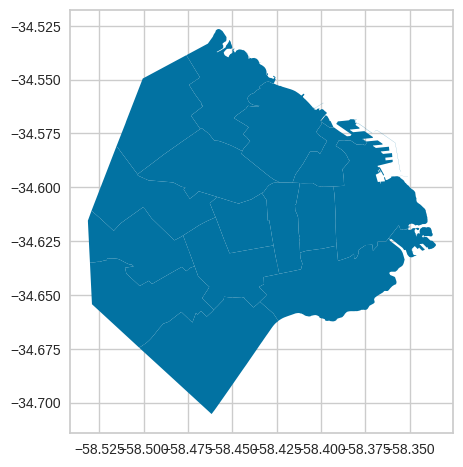

In [163]:
caba_gdf.plot()

Saco los outliers (los puntos fuera de la longitud o latitud de CABA)

In [164]:
alt_2 = alt_2[alt_2["latitud"]>-34.69]
alt_2 = alt_2[alt_2["latitud"]<-34.525]
alt_2.shape

prob = alt_2[alt_2["longitud"]>-58.53]
prob = prob[prob["longitud"]<-58.34]

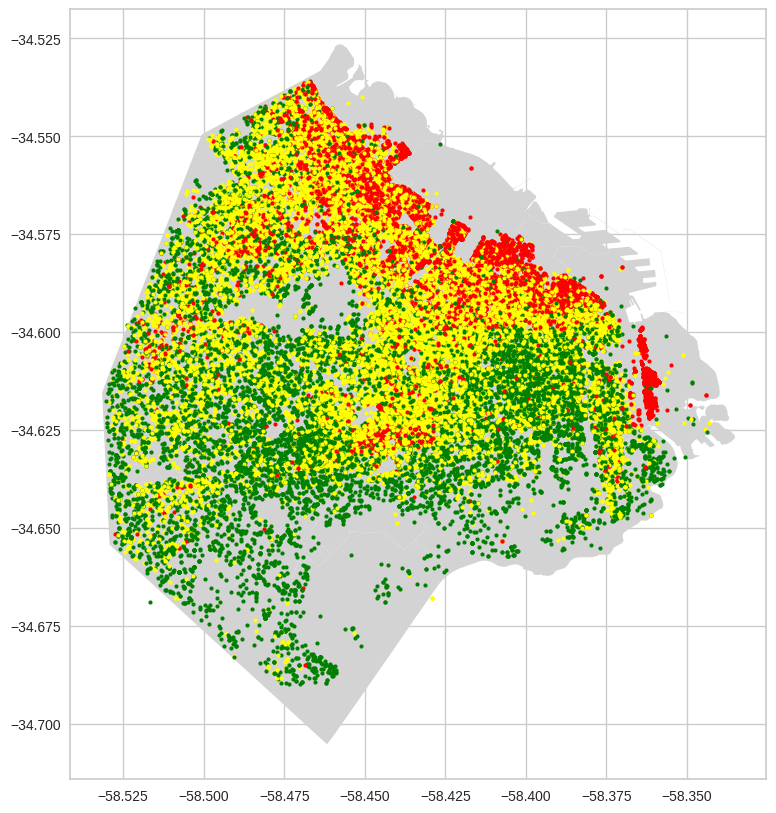

In [165]:
import geopandas as gpd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
caba_gdf.plot(ax=ax, color='lightgray')

for i in range(0,alt_2.shape[0]):
  prop = alt_2.iloc[i]
  lon = prop['longitud']
  lat = prop['latitud']
  col = 'red'
  if prop['tipo_precio'] == 'medio':
    col = 'yellow'
  if prop['tipo_precio'] == 'bajo':
    col = 'green'

  plt.plot(lon,lat, marker="o", color=col, markersize=3)


Se puede ver como los puntos rojos, es decir precios altos, se concentran mayormente en la parte superios derecha mientras que los verdes y amariilos, precios bajos y medios se distribuyen por todo el mapa

## b) Entrenamiento y predicción.

Se pide predecir el atributo **tipo_precio** excluyendo del entrenamiento la variable *price*, *pxm2* y cualquier otra que pueda tener el precio de la venta.

In [452]:
df = alt_2.copy()

Dropeamos las columnas precio, ciudad y operación. Estas últimas porque siempre resultan "Capital Federal" y "Venta", no aportan información útil.

También dcidimos quitar la comuna "zona" porque al predecir con el dataset de test obteniamos resultados muy poco satisfactorios.

In [453]:
df.drop(['property_price', 'city', 'operation', 'pxm2', 'zone'], axis=1, inplace=True)

In [454]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 74954 entries, 285884 to 75496
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   latitud                   74954 non-null  float64 
 1   longitud                  74954 non-null  float64 
 2   property_type             74954 non-null  object  
 3   property_rooms            74954 non-null  float64 
 4   property_bedrooms         74954 non-null  float64 
 5   property_surface_total    74954 non-null  float64 
 6   property_surface_covered  74954 non-null  float64 
 7   property_title            74954 non-null  object  
 8   tipo_precio               74953 non-null  category
dtypes: category(1), float64(6), object(2)
memory usage: 5.2+ MB


Se puede apreciar que tenemos varias columnas categoricas, debemos aplicar algún método de ingenería de características.

In [455]:
from sklearn.preprocessing import (
    KBinsDiscretizer,
    LabelEncoder,
    MinMaxScaler,
    Normalizer,
    OneHotEncoder,
    OrdinalEncoder,
    PowerTransformer,
    RobustScaler,
    StandardScaler,
)
ohe = OneHotEncoder()

Utilizamos One Hot Encoding para las columnas zone y property_type

In [456]:
df_dummies = pd.get_dummies(df, columns=['property_type'],drop_first=True, dtype=int)

Para property_title, en cambio, calculamos la cantidad de palabras y cuántas son en total para luego dropear el texto.

In [457]:
df_dummies['title_len'] = df_dummies['property_title'].str.len()

In [458]:
df_dummies['title_words'] = df_dummies['property_title'].str.split().str.len()

In [459]:
df_dummies.drop(['property_title'], axis=1, inplace=True)

Escalo las vaiables numéricas.

In [354]:
cols_num = [ 'property_rooms', 'property_bedrooms', 'property_surface_total', 'property_surface_covered','title_len','title_words']

In [460]:
from sklearn.preprocessing import StandardScaler

standard_scaler = StandardScaler()
df_dummies[cols_num] = standard_scaler.fit_transform(df_dummies[cols_num])

In [461]:
df_dummies.head(5)

,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,tipo_precio,property_type_Departamento,property_type_PH,title_len,title_words
285884,-34.621390,-58.506366,0.099976,0.087786,-0.057286,-0.112795,medio,1,0,0.167686,0.135525
120762,-34.563005,-58.453674,0.099976,0.087786,-0.030120,-0.104609,alto,1,0,-0.243168,-0.426753
419659,-34.612349,-58.491906,0.099976,0.087786,-0.000043,-0.099399,medio,1,0,0.116330,0.416664
21443,-34.620806,-58.397336,0.099976,0.087786,-0.012656,-0.104237,bajo,0,1,-1.783875,-1.270171
103677,-34.558229,-58.446708,0.099976,0.087786,-0.020417,-0.096050,alto,1,0,-1.218949,-1.270171


### Árbol de decisión

In [177]:
!pip install 'dtreeviz'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 2.3 MB/s eta 0:00:00


In [462]:
import dtreeviz

#modelos y métricas
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, accuracy_score,f1_score#, precision_recall_curve, roc_curve,
from sklearn.metrics import confusion_matrix, classification_report

#preprocesamiento
from sklearn.preprocessing import MinMaxScaler

#configuración warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

Separamos el dataset de train con el target.

In [463]:
df_dummies.dropna(inplace=True)

In [464]:
x_train = df_dummies.drop(['tipo_precio'], axis='columns', inplace=False)
y_train = df_dummies['tipo_precio'].copy()

Buscamos los mejores hiperparámetros.

In [465]:
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer, f1_score

#Cantidad de combinaciones que quiero probar
n=10

#Conjunto de parámetros que quiero usar
params_grid = {'criterion':['gini','entropy'],
               'min_samples_leaf':list(range(1,10)),
               'min_samples_split': list(range(3,20)),
               'ccp_alpha':np.linspace(0,0.05,n),
               'max_depth':list(range(1,6))}

#Cantidad de splits para el Cross Validation
folds=15

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)

#Clasificador
base_tree = DecisionTreeClassifier()

#Metrica que quiero optimizar F1 Score
#scorer_fn = make_scorer(f1_score)
scorer_fn =  make_scorer(f1_score, average='micro')

#Random Search Cross Validation
randomcv = RandomizedSearchCV(estimator=base_tree,
                              param_distributions = params_grid,
                              scoring=scorer_fn,
                              cv=kfoldcv,
                              error_score='raise',
                              n_iter=n)

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train);

Utilizamos 15 folds porque notamos que las métricas alcanzan su máximo valor. Elegimos f1 score ya que es un balance entre las métricas de presición y recall y preferimos no tener falsos negativos/positivos a la hora de predecir el tipo de precio.

In [466]:
#Mejores hiperparametros del arbol
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_)

{'min_samples_split': 11, 'min_samples_leaf': 7, 'max_depth': 4, 'criterion': 'entropy', 'ccp_alpha': 0.011111111111111112}
0.5903434321067688


Conseguimos los mejores parámetros y la mejor métrica de las 10 iteraciones realizadas.

In [467]:
best_tree = randomcv.best_estimator_
feat_imps = best_tree.feature_importances_

for feat_imp,feat in sorted(zip(feat_imps,x_train.columns)):
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))


longitud: 0.23919711840197863
property_type_Departamento: 0.27519569220260887
latitud: 0.48560718939541253


Podemos ver los atributos que el árbol considera importantes para la clasificación.

In [468]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol.fit(x_train,y_train)

reglas = export_text(arbol, feature_names=list(x_train.columns))
print(reglas)

|--- latitud <= -34.60
|   |--- property_type_Departamento <= 0.50
|   |   |--- class: bajo
|   |--- property_type_Departamento >  0.50
|   |   |--- longitud <= -58.37
|   |   |   |--- longitud <= -58.41
|   |   |   |   |--- class: medio
|   |   |   |--- longitud >  -58.41
|   |   |   |   |--- class: bajo
|   |   |--- longitud >  -58.37
|   |   |   |--- class: alto
|--- latitud >  -34.60
|   |--- property_type_Departamento <= 0.50
|   |   |--- class: medio
|   |--- property_type_Departamento >  0.50
|   |   |--- longitud <= -58.47
|   |   |   |--- class: medio
|   |   |--- longitud >  -58.47
|   |   |   |--- latitud <= -34.59
|   |   |   |   |--- class: medio
|   |   |   |--- latitud >  -34.59
|   |   |   |   |--- class: alto


In [364]:
feact = x_train.columns

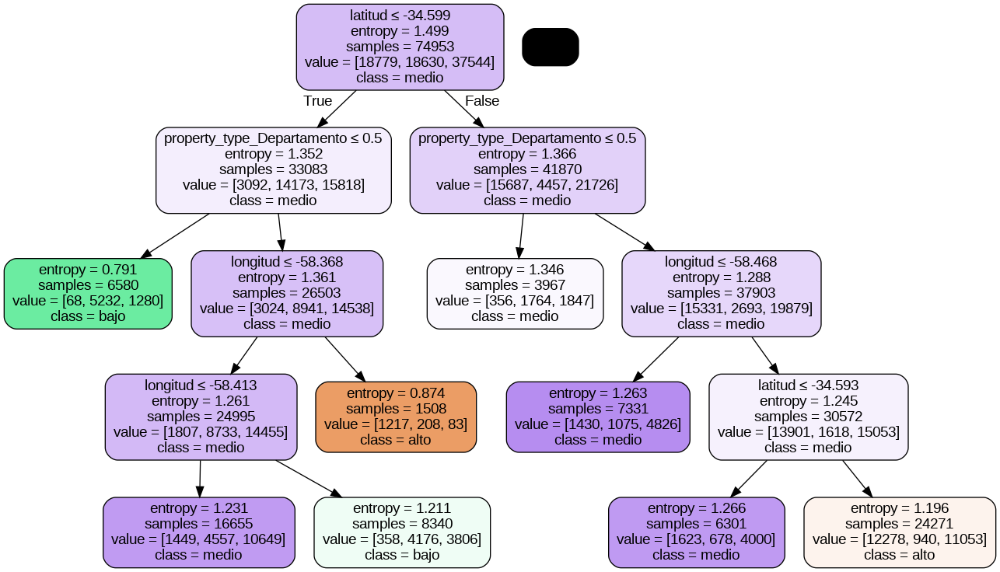

In [469]:
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,
                feature_names=x_train.columns.to_list(),
                class_names=['alto','bajo','medio'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

Podemos ver que para clasificar un nuevo ingreso primero se verifica que la latitud sea menor o igual a -34.599, siendo este el nodo raíz. Si es correcto, avanza al nodo de la izquierda en donde se pregunta si es un departamento, si es correcto, termina clasificado como clase "baja" por la hoja del árbol, el último nodo. Lo mismo ocurre si la condición del nodo raíz es falsa. El ingreso recorre el árbol de decisión hasta llegar a las hojas donde, por fin, es clasificado.

### Evaluar con test

Para evaluar debemos hacer la misma ingenieria de caracteristicas realizadas con el dataset de train.

In [470]:
df_test = properties_argentina_test_set.copy()
df_test.head(2)

,id,start_date,end_date,created_on,latitud,longitud,place_l2,place_l3,place_l4,place_l5,place_l6,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_currency,property_title
212483,YFz1x0+yHihePDT0XdbztQ==,2021-03-22,2021-06-05,2021-03-22,-34.587719,-58.418529,Capital Federal,Palermo,NaN,NaN,NaN,Venta,Departamento,1.0,1.0,26.0,20.0,53000.0,USD,Venta Departamento Monoambiente Palermo
276449,jWTIlUSYoW5XfmJhydjX5g==,2021-12-23,2022-01-27,2021-12-23,-34.599837,-58.466978,Capital Federal,Paternal,NaN,NaN,NaN,Venta,Casa,3.0,2.0,100.0,56.0,119000.0,USD,CASA DE 3 AMBIENTES CON PATIO Y TERRAZA. MUY L...


#### Preparar dataset.

En esta sección se buscó rellenar los  datos faltantes de la  misma forma que en el dataset  de train.

In [471]:
df_test.drop(['id', 'start_date', 'end_date', 'created_on', 'place_l5', 'place_l6', 'operation', 'place_l2', 'property_currency'], axis=1, inplace=True)
df_test.rename(columns={"place_l3":"zone"}, inplace=True)
df_test['zone'] = df_test.apply(lambda x: x['zone'] if str(x['place_l4']) == 'nan' else x['place_l4'], axis=1)
df_test.drop(['place_l4'], axis=1, inplace=True)

In [472]:
place_l3_copy = df_test["zone"]
place_l3_drop = place_l3_copy.drop_duplicates()
zones = place_l3_drop.values

media_zones = {}    #Me guardo las medias de (latitud,longitud) de c/zona

for zone in zones:
      zone_act = df_test[df_test["zone"]==zone]
      lat_med = zone_act["latitud"].mean()
      lon_med = zone_act["longitud"].mean()
      media_zones[zone] = (lat_med,lon_med)
      zone_act = zone_act.fillna({"latitud":lat_med,"longitud":lon_med})
      df_test[df_test["zone"]==zone]=zone_act

In [473]:
import math

i = 0
while i < df_test.shape[0]:
  fila = df_test.iloc[i]
  lat = fila["latitud"]
  if math.isnan(lat):
    df_test.drop(df_test.index[i:i+1], inplace=True)
  else:
    i+=1

In [474]:
for i in range(1,df_test.shape[0]):
    fila = df_test.iloc[i]
    zona = fila["zone"]
    bool = zona!=zona

    if bool:
      lat=fila["latitud"]
      lon=fila["longitud"]
      dist_menor = abs( abs(media_zones["Palermo"][0]) - abs(lat) ) + abs( abs( abs(media_zones["Palermo"][1] ) - abs(lon) ))
      barrio = "Palermo"

      for c in media_zones:

          tupla_dist = media_zones.get(c)
          nueva_dist = abs( abs(tupla_dist[0]) - abs(lat) ) + abs( abs( abs(tupla_dist[1] ) - abs(lon) ))
          es_menor = nueva_dist<dist_menor

          if es_menor:
            dist_menor=nueva_dist
            barrio = c

      df_test.iat[i, 4] = barrio


    i+=1

df_test = df_test

In [475]:
import math

i = 0
while i < df_test.shape[0]:
  fila = df_test.iloc[i]
  lat = fila["zone"]
  if str(lat) == 'nan':
    df_test.drop(df_test.index[i:i+1], inplace=True)
  else:
    i+=1
df_test["zone"].isna().value_counts()


zone
False    18759
Name: count, dtype: int64

In [476]:
prec_m2 = {}

for zona in zones:
  zona_act = df_test[df_test["zone"]==zona]
  prec_tot = 0
  sup_tot = 0

  for i in range(0,zona_act.shape[0]):
    fila = zona_act.iloc[i]
    prec = fila["property_price"]
    sup = fila["property_surface_total"]

    if not sup!=sup:    #es decir si la columna property_surface_total no es NaN
      prec_tot+=prec
      sup_tot+=sup

  if sup_tot!=0:
    prec_prom = prec_tot/sup_tot

    prec_m2[zona]= prec_prom

for i in range (0,df_test.shape[0]):
  fila = df_test.iloc[i]
  zona = fila["zone"]
  sup = fila["property_surface_total"]
  if sup!=sup:
      prec = fila["property_price"]
      sup_calc = prec/prec_m2.get(zona)
      df_test.iat[i, 9] = sup_calc

In [477]:
for i in range (0,df_test.shape[0]):
  fila = df_test.iloc[i]
  zona = fila["zone"]
  sup = fila["property_surface_total"]
  if sup!=sup:
      prec = fila["property_price"]
      sup_calc = prec/prec_m2.get(zona)
      df_test.iat[i, 9] = sup_calc

In [478]:
porc_sup_cub = {}

for zona in zones:
  zona_act = df_test[df_test["zone"]==zona]
  sup_tot = 0
  sup_cub = 0

  for i in range(0,zona_act.shape[0]):
    fila = zona_act.iloc[i]
    s_tot = fila["property_surface_total"]
    s_cub = fila["property_surface_covered"]

    if not s_cub!=s_cub:    #es decir si la columna property_surface_covered no es NaN
      sup_tot+=s_tot
      sup_cub+=s_cub

  if sup_tot!=0:
    porc_cub = (sup_cub * 100)/sup_tot
    porc_sup_cub[zona]= porc_cub

In [479]:

for i in range (0,df_test.shape[0]):
  fila = df_test.iloc[i]
  zona = fila["zone"]
  sup_cub = fila["property_surface_covered"]
  if sup_cub!=sup_cub:
      sup_tot = fila["property_surface_total"]
      nueva_sup_cub = sup_tot * porc_sup_cub.get(zona)
      reparado.iat[i, 10] = nueva_sup_cub

In [480]:
met_por_hab = {}

for zona in zones:
  zona_act = df_test[df_test["zone"]==zona]
  r_mediana = zona_act["property_rooms"].median()
  s_mediana = zona_act["property_surface_total"].median()
  met_por_hab[zona]=s_mediana/r_mediana


In [481]:
import math

i = 0
while i < df_test.shape[0]:
  fila = df_test.iloc[i]
  lat = fila["property_rooms"]
  if str(lat) == 'nan':
    df_test.drop(df_test.index[i:i+1], inplace=True)
  else:
    i+=1
df_test["property_rooms"].isna().value_counts()


property_rooms
False    18577
Name: count, dtype: int64

In [482]:
for i in range (0,df_test.shape[0]):
  fila = df_test.iloc[i]
  zona = fila["zone"]
  rooms = fila["property_rooms"]
  if rooms!=rooms:
      sup_cub = fila["property_surface_covered"]
      nuevo_rooms = sup_cub / met_por_hab.get(zona)
      df_test.iat[i, 7] = round(nuevo_rooms)

In [483]:

por_bedrooms = {}

rooms=df_test["property_rooms"].median()
bedrooms=df_test["property_bedrooms"].median()
porcentaje_mediana_gral = (bedrooms*100)/rooms


for zona in zones:
  zona_act = df_test[df_test["zone"]==zona]
  r_mediana = zona_act["property_rooms"].median()
  b_mediana = zona_act["property_bedrooms"].median()
  porcentaje = (b_mediana * 100)/r_mediana
  if porcentaje==100.0:
    porcentaje=porcentaje_mediana_gral
  por_bedrooms[zona] = porcentaje

In [484]:

for i in range (0,df_test.shape[0]):
  fila = df_test.iloc[i]
  zona = fila["zone"]
  bedrooms = fila["property_bedrooms"]
  if bedrooms!=bedrooms:
      rooms = fila["property_rooms"]
      calc_bedrooms = (rooms*por_bedrooms.get(zona)/100)
      df_test.iat[i, 8] = round(calc_bedrooms)

In [485]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18577 entries, 212483 to 449786
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   latitud                   18577 non-null  float64
 1   longitud                  18577 non-null  float64
 2   zone                      18577 non-null  object 
 3   property_type             18577 non-null  object 
 4   property_rooms            18577 non-null  object 
 5   property_bedrooms         16510 non-null  float64
 6   property_surface_total    17677 non-null  float64
 7   property_surface_covered  17938 non-null  float64
 8   property_price            18577 non-null  float64
 9   property_title            18577 non-null  object 
dtypes: float64(6), object(4)
memory usage: 1.6+ MB


In [486]:
df_test.dropna(inplace=True)
df_test.drop(['zone'], axis=1, inplace=True)

Terminamos  dropeando todas las filas que tienen datos nulos al finalizar, como también la columna de zonaa.

#### Preparar target

In [487]:
df_test['pxm2'] = df_test['property_price'] / df_test['property_surface_total']

percentiles = [0, 0.25, 0.75, 1]
labels = ['bajo', 'medio', 'alto']
df_test["tipo_precio"] = pd.cut(df_test["pxm2"], bins=df_test["pxm2"].quantile(percentiles), labels=labels)

In [488]:
df_test.dropna(inplace=True)

In [489]:
df_test.drop(['pxm2', 'property_price'], axis=1, inplace=True)

#### Ingeniería de características.

Nuevamente se tomaron las mismas decisiones que en el dataset de train.

In [490]:
df_test_dummies = pd.get_dummies(df_test, columns=['property_type'],drop_first=True, dtype=int)
df_test_dummies['title_len'] = df_test_dummies['property_title'].str.len()
df_test_dummies['title_words'] = df_test_dummies['property_title'].str.split().str.len()
df_test_dummies.drop(['property_title'], axis=1, inplace=True)

In [491]:
from sklearn.preprocessing import StandardScaler

standard_scaler = StandardScaler()
df_test_dummies[cols_num] = standard_scaler.fit_transform(df_test_dummies[cols_num])

#### Predicción

In [492]:

x_test = df_test_dummies.drop(['tipo_precio'], axis='columns', inplace=False)
y_test = df_test_dummies['tipo_precio'].copy()

F1-Score: 0.5914332784184514


Text(70.72222222222221, 0.5, 'True')

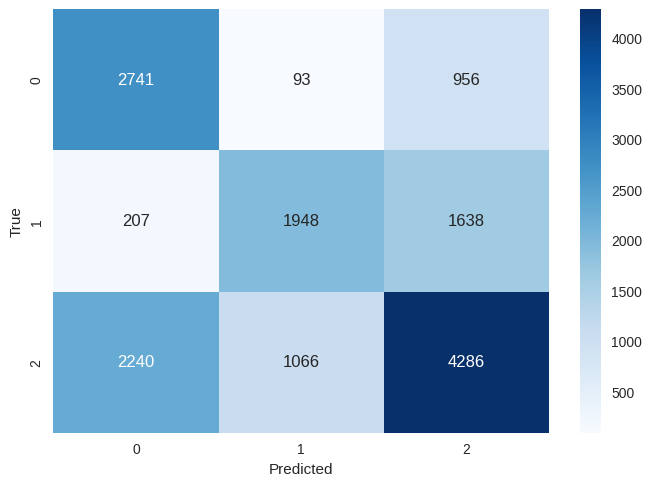

In [493]:
#Evalúo el Arbol con los mejores hiperparámetros
from sklearn.metrics import confusion_matrix, classification_report , f1_score

#Hago predicción sobre el set de evaluacion
y_pred= arbol.predict(x_test)

#Arbol Reporte y Matriz de Confusion
#print(classification_report(y_test,y_pred))
print('F1-Score: {}'.format(f1_score(y_test, y_pred, average='micro'))) #binary considera la clase positiva por defecto 1

cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, cmap='Blues',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

Nos da un score muy similar al entrenamiento, lo que quiere decir que no estamos overfiteando datos.

In [494]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

        alto       0.53      0.72      0.61      3790
        bajo       0.63      0.51      0.56      3793
       medio       0.62      0.56      0.59      7592

    accuracy                           0.59     15175
   macro avg       0.59      0.60      0.59     15175
weighted avg       0.60      0.59      0.59     15175


Podemos observar que la métrica de precisión resulta de 0,6 para las tres clases, indica *la cantidad de casos verdaderos sobre la cantidad de casos que predecimos como verdaderos*.

Por otro lado, la métrica recall indica la cantidad de casos clasificados como positivos sobre lo  que realmente es positivo. Esta métrica nos dio un valor muy bajo para el caso de propiedades bajas y altas. Obtenemos bastantes falsos negativos.

Por último, f1-score es un balance entre recall y precisión.


## Random Forest

#### a.) Construir un clasificador RF y optimizar sus hiperparámetros mediante k-fold Cross Validation para obtener la mejor performance
- ¿Cuántos folds utilizaron?
- ¿Qué métrica consideran adecuada para buscar los parámetros?

##### 1. Optimizar sus hiperparámetros mediante k-fold


In [495]:
from sklearn.ensemble import RandomForestClassifier

#Cantidad de combinaciones que quiero porbar
n=10

#Conjunto de parámetros que quiero usar
params_grid = {'criterion':['gini','entropy'],
               'min_samples_leaf':list(range(1,10)),
               'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.05,n),
               'max_depth':list(range(1,6))}

#Cantidad de splits para el Cross Validation
folds=5

#Kfold estratificado
k_fold_cv_random_forest = StratifiedKFold(n_splits=folds)

#Clasificador
base_random_forest = RandomForestClassifier(
    max_features=0.5,
    oob_score=True,
    random_state=42,
    n_jobs=-1
)

#Metrica que quiero optimizar F1 Score
scorer_fn_random_forest_version = make_scorer(f1_score)

#Random Search Cross Validation
random_cv_random_forest_version = RandomizedSearchCV(
                              estimator=base_random_forest,
                              param_distributions = params_grid,
                              scoring=scorer_fn_random_forest_version,
                              cv=k_fold_cv_random_forest,
                              n_iter=n)

#Busco los hiperparamtros que optimizan F1 Score
random_cv_random_forest_version.fit(x_train,y_train);

#### Mejores hiperparametros del arbol

In [392]:
random_cv_random_forest_version.best_params_

{'min_samples_split': 6,
 'min_samples_leaf': 7,
 'max_depth': 5,
 'criterion': 'entropy',
 'ccp_alpha': 0.022222222222222223}

#### b. Analizar la importancia de los atributos

In [393]:
best_rf = random_cv_random_forest_version.best_estimator_
feat_imps = best_rf.feature_importances_
print(feat_imps)

for feat_imp,feat in sorted(zip(feat_imps,df_dummies.columns)):
  if feat_imp > 0:
    print('{}: {}'.format(feat,feat_imp))

[5.02641003e-01 1.37862371e-01 0.00000000e+00 0.00000000e+00
 2.64231211e-02 9.69808419e-03 2.58242259e-01 6.37972033e-02
 9.71802441e-04 3.64156299e-04]
title_len: 0.0003641562994342539
property_type_PH: 0.0009718024411489397
property_surface_covered: 0.009698084193554455
property_surface_total: 0.026423121119879198
property_type_Departamento: 0.06379720328859417
longitud: 0.13786237061643203
tipo_precio: 0.2582422586389209
latitud: 0.5026410034020362


Como podemos observar hay dos atributos que mas peso tienen al momento de determinar si una propiedad es de precio bajo, medio y alto son :
- Tipo de propiedad
- Latitud

#### c.) Mostrar la conformación final de uno de los árboles generados. Si es muy extenso mostrar una porción representativa y explicar las primeras reglas.


RandomForest utiliza la tecnica de baggin.
## BAGGIN
Es una técnica para construir ensambles
Pasos
1. Se toma un data set y se parte en varios conjuntos (utiilizando bootstrap)
2. Cada conjunto de datos entrena un modelo distinto ( Los modelos no pueden estar correlacionados, ya que buscamos que vean partes del problema distintas ) Son el mismo modelo pero con data set distintitos
3. Cada modelo vota por una instancia
4. La instancia que tenga mas votos es la instancia elegida

**Bootstrap** : Como crear los subconjuntos

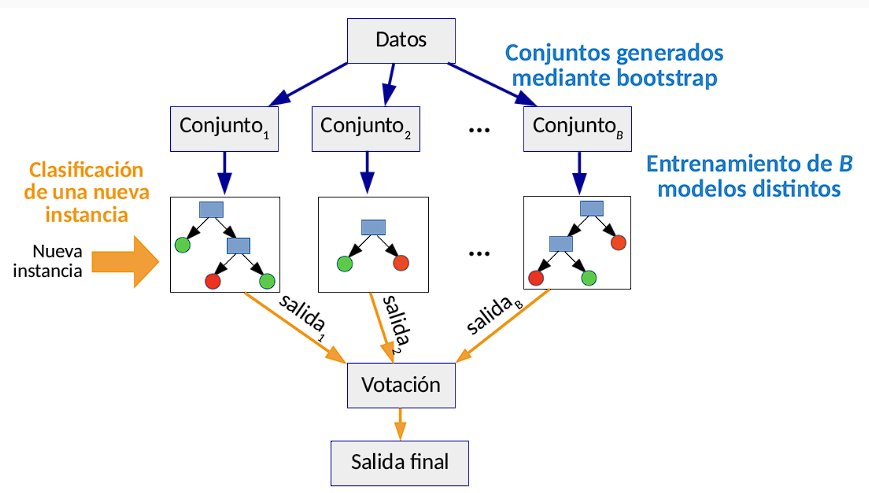Dicho esto, vamos a ver los paramatros que utiliza la libreria de randomForest para hacer la clasificacion.

In [394]:
random_forest = RandomForestClassifier()
random_forest.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

##### CONFIGURAMOS LOS PARAMETROS

In [395]:
params = random_cv_random_forest_version.best_params_
random_forest_configurado = RandomForestClassifier(
    random_state=42,
    max_features='auto',
    n_jobs=-1,
    criterion="gini",
    n_estimators=50,
    min_samples_leaf=5,
    min_samples_split=5
)
rfc_optimizado = random_forest_configurado.set_params(**params)

#### ENTRANMOS EL MODELO

In [397]:
model_rf = rfc_optimizado.fit(X = x_train, y = y_train)

In [398]:
model_rf.estimators_[48]

DecisionTreeClassifier(ccp_alpha=0.022222222222222223, criterion='entropy',
                       max_depth=5, max_features='sqrt', min_samples_leaf=7,
                       min_samples_split=6, random_state=1958805693)

#### GRAFICOS PARA UN ARBOL ESPECIFICO
Como elegimos n_estimators = 50 , que representa la cantidad de arboles que crea el modelo, vamos a graficar algunos para analizar sus reglas

##### Arbol_n = 48

In [396]:
plt.figure(figsize=(100,100))

tree_plot_completo = tree.plot_tree(model_rf.estimators_[48],
                                 feature_names=x_train.columns.to_list(),
                                 filled=True,
                                 rounded=True,
                                 class_names=['bajo','medio',"alto"])
plt.show(tree_plot_completo)

##### Arbol_n = 10

In [399]:
plt.figure(figsize=(100,100))

tree_plot_completo = tree.plot_tree(model_rf.estimators_[10],
                                 feature_names=x_train.columns.to_list(),
                                 filled=True,
                                 rounded=True,
                                 class_names=['bajo','medio',"alto"])
plt.show(tree_plot_completo)

#### CONFORMACION DE LOS ARBOLES
RandomForest es un modelo que se caracteriza por no utilizar un unico arbol, utiliza k arbolores y es con este conjunto que resuelve la clasificacion por medio de la votacion de cada arbol.

Se divide el conjunto de entranamiento trani_x en distintos subconjuntos, obteniendo como resultado diferentes muestras aleatorias

Para cada subconjuto se entrena un modelo y con el conjunto se resuelve el problema de clasificacion.

La construccion del subconjto se hace de la siguiente forma:
- Se toma el conjunto total y se extrae 2/3 de las filas y esto reprenta el subconjuto con el cual vamos a entranar los k arbolores generados por el algoritmo




#### d. Evaluar la performance del modelo en el conjunto de evaluación, explicar todas las métricas y mostrar la matriz de confusión. Comparar con la performance de entrenamiento.

              precision    recall  f1-score   support

        alto       0.96      0.01      0.03      3790
        bajo       0.68      0.36      0.47      3793
       medio       0.53      0.92      0.68      7592

    accuracy                           0.55     15175
   macro avg       0.73      0.43      0.39     15175
weighted avg       0.68      0.55      0.46     15175

F1-Score: 0.5914332784184514


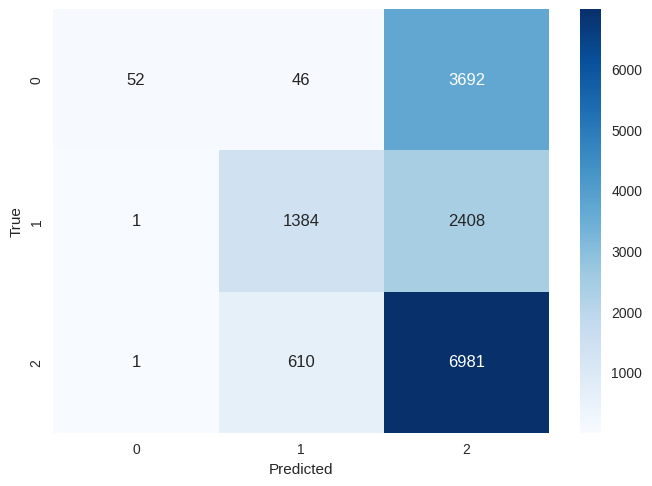

In [496]:
y_pred_model_rfc_multimetrica = model_rf.predict(x_test)
#Matriz de Confusión
cm = confusion_matrix(y_test,y_pred_model_rfc_multimetrica)
sns.heatmap(cm, cmap='Blues',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

#Reporte
print(classification_report(y_test,y_pred_model_rfc_multimetrica))
print('F1-Score: {}'.format(f1_score(y_test, y_pred, average='micro')))

- Exactitud de las predicciones positivas: Precisión
1. Predice con una precisión del 96% que los inmuebles son costo alto
2. Predice con una precisión del 68% que los inmuebles son costo bajo
3. Predice con una precisión del 53% que los inmuebles son costo medio

La métrica recall indica la cantidad de casos clasificados como positivos sobre lo  que realmente es positivo.
Esto quiere decir que para los tipos alto y bajo tenemos muchas prediccion del tipo falso positivo

# SVM

In [222]:
df = alt_2.copy()
df.drop(['property_price', 'operation', 'pxm2'], axis=1, inplace=True)

df_dummies = pd.get_dummies(df, columns=['property_type'],drop_first=True, dtype=int)

df_dummies['title_len'] = df_dummies['property_title'].str.len()

df_dummies['title_words'] = df_dummies['property_title'].str.split().str.len()

df_dummies.drop(['property_title'], axis=1, inplace=True)

cols_num = [ 'property_rooms', 'property_bedrooms', 'property_surface_total', 'property_surface_covered','title_len','title_words']

standard_scaler = StandardScaler()
df_dummies[cols_num] = standard_scaler.fit_transform(df_dummies[cols_num])

df_dummies.dropna(inplace=True)

In [223]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay


# Excluir columnas relacionadas con el precio
excluidas = ['tipo_precio']
features = [col for col in df_dummies.columns if col not in excluidas]
target = 'tipo_precio'

X = df_dummies[features]
y = df_dummies[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Definir las columnas categóricas y numéricas
categorical_features = ['city', 'zone']  # Incluye otras variables categóricas si las hay
numeric_features = [col for col in features if col not in categorical_features]

# Crear el preprocesador de columnas
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(), categorical_features)
    ])

# Definir el modelo SVM
svm_model = SVC()

# Crear el pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', svm_model)
])

# Definir los hiperparámetros para Grid Search
param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__gamma': [1, 0.1, 0.01],
    'classifier__kernel': ['rbf', 'linear']
}



In [224]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay


excluidas = ['tipo_precio']
features = [col for col in df_dummies.columns if col not in excluidas]
target = 'tipo_precio'

# Dividido el dataset en conjunto de entrenamiento y prueba
X = df_dummies[features]
y = df_dummies[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Defino las columnas categóricas y numéricas
categorical_features = ['city', 'zone']  # Incluye otras variables categóricas si las hay
numeric_features = [col for col in features if col not in categorical_features]


preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(), categorical_features)
    ])


log_reg_model = LogisticRegression(max_iter=1000, random_state=42)

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', log_reg_model)
])

# Defino los hiperparámetros para Grid Search
param_grid = {
    'classifier__C': [0.01, 0.1, 1, 10, 100],
    'classifier__solver': ['saga']
}

In [225]:
# Grid Search con validación cruzada
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         StandardScaler(),
                                                                         ['latitud',
                                                                          'longitud',
                                                                          'property_rooms',
                                                                          'property_bedrooms',
                                                                          'property_surface_total',
                                                                          'property_surface_covered',
                                                                          'property_type_Departamento',
                                                                          'property_type_PH',
                                                                          'title_len',
                                                                          'title_words']),
                                                                        ('cat',
                                                                         OneHotEncoder(),
                                                                         ['city',
                                                                          'zone'])])),
                                       ('classifier',
                                        LogisticRegression(max_iter=1000,
                                                           random_state=42))]),
             param_grid={'classifier__C': [0.01, 0.1, 1, 10, 100],
                         'classifier__solver': ['saga']},
             scoring='accuracy')

In [226]:
#Busco el mejor modelo y sus hiperparámetros
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

# Cross-Validation en el conjunto de entrenamiento
cross_val_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='accuracy')

#Evaluo el modelo en el conjunto de prueba
y_pred = best_model.predict(X_test)

# Calculo y muestro las métricas de evaluación
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Mejores hiperparámetros:", best_params)
print("Cross-Validation Accuracy Scores en entrenamiento:", cross_val_scores)
print("Promedio de Cross-Validation Accuracy en entrenamiento:", cross_val_scores.mean())
print("Accuracy en conjunto de prueba:", accuracy)

Mejores hiperparámetros: {'classifier__C': 100, 'classifier__solver': 'saga'}
Cross-Validation Accuracy Scores en entrenamiento: [0.64921204 0.64287501 0.64492995 0.65376918 0.65193462]
Promedio de Cross-Validation Accuracy en entrenamiento: 0.6485441613233692
Accuracy en conjunto de prueba: 0.6453205256487226


Text(70.72222222222221, 0.5, 'True')

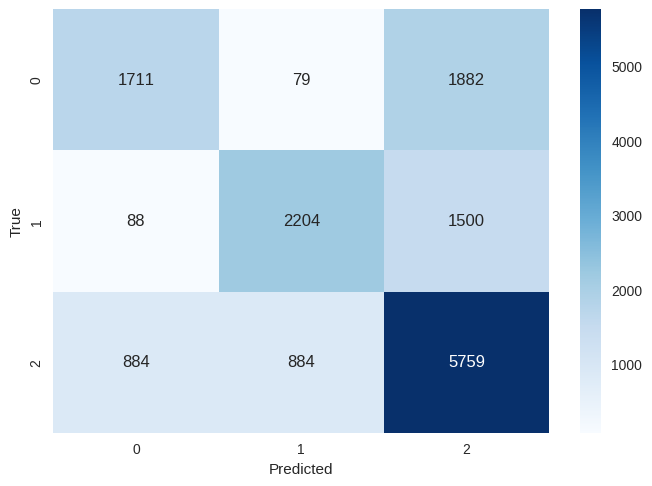

In [227]:
mc = confusion_matrix(y_test, y_pred)
sns.heatmap(mc, cmap='Blues',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

In [228]:
print("Reporte de clasificación:\n", report)

Reporte de clasificación:
               precision    recall  f1-score   support

        alto       0.64      0.47      0.54      3672
        bajo       0.70      0.58      0.63      3792
       medio       0.63      0.77      0.69      7527

    accuracy                           0.65     14991
   macro avg       0.65      0.60      0.62     14991
weighted avg       0.65      0.65      0.64     14991


- Exactitud de las predicciones positivas: Precisión
1. Predice con una precisión del 64% que los inmuebles son costo alto
2. Predice con una precisión del 70% que los inmuebles son costo bajo
3. Predice con una precisión del 63% que los inmuebles son costo medio

Podemos observar que la métrica de precisión resulta entre 0,63 y 0,70 para las tres clases, indica *la cantidad de casos verdaderos sobre la cantidad de casos que predecimos como verdaderos*.

Por otro lado, la métrica recall indica la cantidad de casos clasificados como positivos sobre lo  que realmente es positivo. Esta métrica nos dio un valor muy bajo para el caso de propiedades bajas y altas. Obtenemos bastantes falsos negativos.

Por último, f1-score es un balance entre recall y precisión.


In [229]:
print('F1-Score: {}'.format(f1_score(y_test, y_pred, average='micro')))

F1-Score: 0.6453205256487226


Nos da un score muy similar al entrenamiento, lo que quiere decir que no estamos overfiteando datos.

# 4) Regresión

## XGBoost

a) Construir un modelo XGBoost y optimizar sus hiperparámetros mediante k-fold Cross Validation para obtener la mejor performance.
- ¿Cuántos folds utilizaron?
- ¿Qué métrica consideran adecuada para buscar los parámetros?

In [233]:
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error
import xgboost as xgb


In [234]:
data = alt_2.copy()
data.drop(['property_title'], axis='columns', inplace=True)

In [235]:
# divido en conjunto de entrenamiento y evaluación
train, test = train_test_split(data, test_size=0.2, random_state=42)


features = ['latitud', 'longitud', 'property_rooms', 'property_bedrooms','property_surface_total', 'property_surface_covered']
target = 'property_price'

X_train, y_train = train[features], train[target]
X_test, y_test = test[features], test[target]

# Definir el modelo XGBoost
xgb = xgb.XGBRegressor()

# defino hiperparametros para Grid search
param_grid = {
    'prof_max': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estim': [100, 200, 300],
    'lambda': [1, 5, 10]
}

k_folds = 5 #utilizo 5 folds

mse = 'neg_mean_squared_error' #defino MSE

# hago Grid search con k-fold cross validation
grid_search = GridSearchCV(xgb, param_grid, cv=KFold(n_splits=k_folds), scoring=mse)
grid_search.fit(X_train, y_train)

# busco el mejor modelo y sus hiperparámetros
mejor_xgb = grid_search.best_estimator_
param = grid_search.best_params_

# evaluo el modelo en el conjunto de test
y_pred = mejor_xgb.predict(X_test)

# calculo MSE y MAE
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)


Como se puede ver en el código se utilizan 5 folds y en cuanto a métricas se utilizaron MAE y MSE.

b)
Evaluar la performance del modelo en el conjunto de evaluación, explicar todas las
métricas. Comparar con la performance de entrenamiento.

Los hiperparámetros usados son:

In [236]:
print("Mejores hiperparámetros:", param)

Mejores hiperparámetros: {'lambda': 1, 'learning_rate': 0.1, 'n_estim': 100, 'prof_max': 3}


Ahora evaluo el rendimiento del modelo en el conjunto de evaluación:

In [237]:
score_entren = mejor_xgb.score(X_train, y_train)
score_test = mejor_xgb.score(X_test, y_test)
print("Coeficiente de Pearson en conjunto de evaluación:", score_test)

Coeficiente de Pearson en conjunto de evaluación: 0.851250502258384


Por último las métricas son:

In [238]:
print("MSE:", mse)
print("MAE:", mae)

MSE: 12896555802.763245
MAE: 46226.186128995105


Finalmente comparo el rendimiento en el conjunto de entrenamiento

In [239]:
# comparo con el rendimiento en el conjunto de entrenamiento

print("Coeficiente de Pearson en conjunto de entrenamiento:", score_entren)
print("Coeficiente de Pearson en conjunto de evaluación:", score_test)

Coeficiente de Pearson en conjunto de entrenamiento: 0.9181216220839679
Coeficiente de Pearson en conjunto de evaluación: 0.851250502258384


# KNN

In [264]:
from sklearn.neighbors import KNeighborsRegressor

In [265]:
data_knn = alt_2.copy()
data_knn.drop(['property_title','operation','pxm2','tipo_precio','city','zone'], axis='columns', inplace=True)

Utilizamos como antes los features de latitud, longitud, tipo de propiedad, la superficie total, la superficie cubierta, la cantidad de habitaciones y de ambientes. El resto de las columnas, com explicamos anteriormente, las desestimamos.

In [266]:
tst_knn = test.copy()
tst_knn.drop(['operation','pxm2','tipo_precio','city', 'zone'], axis='columns', inplace=True)

In [267]:
data_knn = pd.get_dummies(data_knn, columns=["property_type"], drop_first=True)
tst_knn = pd.get_dummies(tst_knn, columns=["property_type"], drop_first=True)

Ingeniería de características.

Para la variable categórica utilizamos one hot encoding, mientras que para las numéricas z-score.

In [268]:
from sklearn.preprocessing import StandardScaler

In [269]:
standard_scaler = StandardScaler()
data_knn['latitud'] = standard_scaler.fit_transform(data_knn['latitud'].to_frame())
data_knn['longitud'] = standard_scaler.fit_transform(data_knn['longitud'].to_frame())
data_knn['property_rooms'] = standard_scaler.fit_transform(data_knn['property_rooms'].to_frame())
data_knn['property_bedrooms'] = standard_scaler.fit_transform(data_knn['property_bedrooms'].to_frame())
data_knn['property_surface_total'] = standard_scaler.fit_transform(data_knn['property_surface_total'].to_frame())
data_knn['property_surface_covered'] = standard_scaler.fit_transform(data_knn['property_surface_covered'].to_frame())

In [270]:
tst_knn['latitud'] = standard_scaler.fit_transform(tst_knn['latitud'].to_frame())
tst_knn['longitud'] = standard_scaler.fit_transform(tst_knn['longitud'].to_frame())
tst_knn['property_rooms'] = standard_scaler.fit_transform(tst_knn['property_rooms'].to_frame())
tst_knn['property_bedrooms'] = standard_scaler.fit_transform(tst_knn['property_bedrooms'].to_frame())
tst_knn['property_surface_total'] = standard_scaler.fit_transform(tst_knn['property_surface_total'].to_frame())
tst_knn['property_surface_covered'] = standard_scaler.fit_transform(tst_knn['property_surface_covered'].to_frame())

In [271]:
Y_train = data_knn['property_price']
X_train = data_knn.drop(columns=['property_price'])

Buscamos hiperparámetros nuevamente con RandomSearchCV.

In [272]:
from sklearn.neighbors import KNeighborsRegressor
import sklearn

n = 10
#Conjunto de parámetros que quiero usar
params_grid = {'metric':['manhattan','cityblock','euclidean' , 'minkowski'],'n_neighbors': np.arange(1,20),
               'algorithm':['ball_tree', 'kd_tree', 'brute'],
               'weights':['uniform','distance']
               }

#['algorithm', 'leaf_size', 'metric', 'metric_params', 'n_jobs', 'n_neighbors', 'p', 'weights']
#Cantidad de splits para el Cross Validation
folds=10
kfoldcv = KFold(n_splits=folds)

#Clasificador
knn = KNeighborsRegressor()

#Metrica que quiero optimizar
scorer =  make_scorer(sklearn.metrics.mean_squared_error)

#Random Search Cross Validation
randomcv = RandomizedSearchCV(estimator=knn,
                              param_distributions = params_grid,
                              scoring=scorer,
                              cv=kfoldcv,
                              error_score='raise',
                              n_iter=n)

#Busco los hiperparamtros
randomcv.fit(X_train,Y_train);

Utilizamos 10 folds y 10 iteraciones, agregando más no teníamos ganancia de un mejor score.

Llegamos a los mejores hiperparámetros:

In [409]:
print(randomcv.best_params_)

{'min_samples_split': 7, 'min_samples_leaf': 1, 'max_depth': 4, 'criterion': 'entropy', 'ccp_alpha': 0.0}


In [410]:
Y_test_knn = tst_knn['property_price']
X_test_knn= tst_knn.drop(columns=['property_price'])

In [286]:
best_knn=randomcv.best_estimator_
Y_predict = best_knn.predict(X_test_knn)

In [287]:
mse = mean_squared_error(Y_test_knn, Y_predict)
mae = mean_absolute_error(Y_test_knn, Y_predict)

print("MSE:", mse)
print("MAE:", mae)

MSE: 13939510700.799892
MAE: 40861.87843817401


In [288]:
print(best_knn.score(X_train, Y_train))
print(best_knn.score(X_test_knn, Y_test_knn))

0.8536285450233528
0.8392210100728138


# GREDIENT BOOST
Se utiliza para problemas de clasificacion o regresion.

Permite elegir una función de costo L , por ejemplo, error cuadrático medio si es un problema de regresión, o entropía cruzada si es un problema de clasificación, y cada árbol que construye lo hace de manera que la función de costo se minimice (técnica de optimización se denomina descenso por gradiente).

En cada iteración construimos un árbol nuevo que aprenda a predecir el residuo entre las observaciones y los valores predichos por el árbol anterior.


Criterio de elección de atributos en cada nodo (Information Gain, Gini Gain)

Criterio de parada (ej: máxima profundidad generalmente se usa 5 o 6)

Estrategia de poda
Parámetros de boosting: estos afectan la operación de boosting en el modelo.

learning_rate (por defecto=0.1): la tasa de aprendizaje reduce la contribución de cada árbol. Hay una compensación entre learning_rate y la cantidad de estimadores.

n_estimators (por defecto=100): cantidad de estimadores que se van a utilizar.

#### Hacemos una evaluacion del modelo sin configurar ningun parametro

In [403]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error

train, test = train_test_split(data, test_size=0.2, random_state=42)


features = ['latitud', 'longitud', 'property_rooms', 'property_bedrooms','property_surface_total', 'property_surface_covered']
target = 'property_price'

X_train, y_train = train[features], train[target]
X_test, y_test = test[features], test[target]

gradient_boost_regresor = GradientBoostingRegressor(random_state=2)
gradient_boost_regresor.fit(X_train, y_train)

GradientBoostingRegressor(random_state=2)

#### Accuracy Train

In [404]:
print(gradient_boost_regresor.score(X_train, y_train))

0.8392695328532489


#### MSE

In [405]:
print(mean_squared_error(y_train, gradient_boost_regresor.predict(X_train)))

14245968215.51736


##### Optimizamos los hiperparametros, para mejoras las metricas

In [406]:
#Cantidad de combinaciones que quiero porbar
n=10

#Conjunto de parámetros que quiero usar
params_grid = {'n_estimators':range(20, 150, 5),
               'max_depth':range(1,7),
               'learning_rate':np.arange(0,1,0.001)
               }

#Cantidad de splits para el Cross Validation
folds=5

#Kfold estratificado
k_fold_cv_regressor = StratifiedKFold(n_splits=folds)

#Regressor
base_gradient_boost = GradientBoostingRegressor(
    random_state=2,
)


#Random Search Cross Validation
random_cv_gradient_boost_version = RandomizedSearchCV(
                              estimator=base_gradient_boost,
                              param_distributions = params_grid,
                              cv=k_fold_cv_random_forest,
                              n_iter=n,
                              scoring='r2',
                              random_state=2,error_score='raise')

#Busco los hiperparamtros que optimizan F1 Score
random_cv_gradient_boost_version.fit(X_train,y_train);

#### Best Parmas

In [411]:
random_cv_gradient_boost_version.best_params_

{'n_estimators': 145, 'max_depth': 5, 'learning_rate': 0.227}

##### PREDICCION DE TRAIN Y TEST

In [412]:
gradient_boost_regresor_best = random_cv_gradient_boost_version.best_estimator_
property_prices_pred_train = gradient_boost_regresor_best.predict(X_train)
property_prices_pred_test = gradient_boost_regresor_best.predict(X_test)

resultados = pd.DataFrame({'Prediccion': property_prices_pred_train})
resultados

,Prediccion
0,86400.420182
1,147697.876808
2,438558.472530
3,103844.554555
4,224106.789963
...,...
59958,203423.437118
59959,65341.171486
59960,180780.817438
59961,152400.614980


#### METRICAS

In [417]:
print("MSE", mean_squared_error(y_train, gradient_boost_regresor_best.predict(X_train)))
score_train_gb = gradient_boost_regresor_best.score(X_train, y_train)
print("Score de training (R²): ", score_train_gb)
score_test_gb = gradient_boost_regresor_best.score(X_test,y_test)
print("Score de test (R²): ", score_test_gb)
print("Coeficiente de Pearson en conjunto de entrenamiento:", gradient_boost_regresor_best.score(X_train, y_train) )
print("Coeficiente de Pearson en conjunto de evaluación:", gradient_boost_regresor_best.score(X_test, y_test))

MSE 4609665002.019385
Score de training (R²):  0.9479913475900101
Score de test (R²):  0.86309409339916
Coeficiente de Pearson en conjunto de entrenamiento: 0.9479913475900101
Coeficiente de Pearson en conjunto de evaluación: 0.86309409339916
